In [1]:
import pandapower as pp
import seaborn as sns
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import logging
import time
import pandas as pd
import math
from tqdm import tqdm
import pandapower.networks as pn
import pandapower.plotting as pp_plot

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from scipy.stats import skew, kurtosis
from scipy.signal import find_peaks

from sklearn.metrics import silhouette_score

# Functions

In [28]:
def plot_and_save_generator_distrib(gen_df, save):
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns

    groups = [(0, 4), (4, 8), (8, 11), (11, 13)]
    titles = [
        'Distribution of Active Power for Generators 1–4',
        'Distribution of Active Power for Generators 5–8',
        'Distribution of Active Power for Generators 9–11',
        'Distribution of Active Power for Generators 12–13'
    ]

    bin_width = 0.04  # constant bin width
    tick_step = 0.1   # uniform xtick step

    for (start, end), title in zip(groups, titles):
        plt.figure(figsize=(10, 6))

        # Estendi lo span dei dati di un 10% ai bordi
        all_vals = np.concatenate([gen_df[f'gen{i+1}_p_mw'].values for i in range(start, end)])
        center = all_vals.mean()
        span = all_vals.max() - all_vals.min()
        half_width = max(0.6, span / 2)
        x_min = np.floor((center - half_width - 0.1 * span) / tick_step) * tick_step
        x_max = np.ceil((center + half_width + 0.1 * span) / tick_step) * tick_step

        bins = np.arange(x_min, x_max + bin_width, bin_width)
        xticks = np.arange(x_min, x_max + tick_step, tick_step)

        for i in range(start, end):
            data = gen_df[f'gen{i+1}_p_mw']
            # Istogramma
            sns.histplot(
                data,
                bins=bins,
                stat='density',
                label=f'Generator {i+1}',
                alpha=0.5,
                edgecolor=None,
            )
            # KDE
            sns.kdeplot(
                data,
                bw_adjust=2.5,
                fill=False,
                clip=(x_min, x_max)
            )

        plt.xticks(xticks, fontsize=12)
        plt.yticks(fontsize=12)
        plt.xlabel('P (MW)', fontsize=16)
        plt.ylabel('Density', fontsize=16)
        plt.legend(fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        #plt.title(title, fontsize=16)
        if (save == 1):
            plt.savefig(f"opf_real_{start+1}-{end}.png", dpi=300)
        plt.show()

        break  # solo il primo gruppo

    return


In [10]:
def plot_and_save_generator_distrib_other(gen_df, save):
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns

    # 2 gruppi: (5–9), (10–13)
    groups = [(4, 8), (8, 13)]
    titles = [
        'Distribution of Active Power for Generators 5–9',
        'Distribution of Active Power for Generators 10–13'
    ]

    bin_width = 0.02
    tick_step = 0.1

    # Palette di 10 colori ben distinti
    palette = sns.color_palette("tab10", 10)


    for group_idx, ((start, end), title) in enumerate(zip(groups, titles)):
        plt.figure(figsize=(10, 6))

        all_vals = np.concatenate([gen_df[f'gen{i+1}_p_mw'].values for i in range(start, end)])
        center = all_vals.mean()
        span = all_vals.max() - all_vals.min()
        half_width = max(0.6, span / 2)
        x_min = np.floor((center - half_width - 0.1 * span) / tick_step) * tick_step
        x_max = np.ceil((center + half_width + 0.1 * span) / tick_step) * tick_step

        bins = np.arange(x_min, x_max + bin_width, bin_width)
        xticks = np.arange(x_min, x_max + tick_step, tick_step)

        for k, i in enumerate(range(start, end)):
            data = gen_df[f'gen{i+1}_p_mw']
            color = palette[k % len(palette)]

            sns.histplot(
                data,
                bins=bins,
                stat='density',
                label=f'Generator {i+1}',
                alpha=0.25,          # più trasparente per le sovrapposizioni
                edgecolor=None,
                color=color
            )
            sns.kdeplot(
                data,
                bw_adjust=2.5,
                fill=False,
                clip=(x_min, x_max),
                color=color,
                linewidth=2
            )

        plt.xticks(xticks, fontsize=12)
        plt.yticks(fontsize=12)
        plt.xlabel('P (MW)', fontsize=16)
        plt.ylabel('Density', fontsize=16)
        plt.legend(fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        #plt.title(title, fontsize=16)
        if (save == 1):
            plt.savefig(f"opf_{(start+1, end)}.png", dpi=300)
        plt.show()
    return

In [11]:
def plot_cost_mc(results_df, save):
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np

    plt.figure(figsize=(6, 4))
    data = results_df['total_cost']

    # Compute extended x-limits
    span = data.max() - data.min()
    x_min = data.min() - 0.1 * span
    x_max = data.max() + 0.1 * span
    bins = np.linspace(x_min, x_max, 41)

    # Plot histogram
    sns.histplot(
        data,
        bins=bins,
        stat='density',
        edgecolor=None,
        linewidth=1.2,
        alpha=0.4,
        color='C0'
    )
    # Separate KDE plot, clipped to x_min, x_max
    sns.kdeplot(
        data,
        bw_adjust=1.5,
        clip=(x_min, x_max),
        color='C0'
    )
    
    # Mean line
    mean_val = data.mean()
    plt.axvline(mean_val, color='black', linestyle='--', linewidth=1.5, label=f"Mean = {mean_val:.2f}")
    
    # Axis and grid styling
    plt.xlabel('Total Cost', fontsize=16)
    plt.ylabel('Density', fontsize=16)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(fontsize=12)
    plt.tight_layout()
    if (save == 1):
        plt.savefig("opf_real_cost_distribution_AM.png", dpi=300)
    plt.show()
    return

In [12]:
def plot_ext_grid(results_df, save):
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np
    # Prepare ext_grid data
    ext_data = {
        f'ext_grid_p_mw': results_df['ext_grid_p_mw'].apply(lambda x: x[0])
    }
    ext_df = pd.DataFrame(ext_data)
    data = ext_df['ext_grid_p_mw']

    plt.figure(figsize=(6, 4))
    # Compute extended x-limits
    span = data.max() - data.min()
    x_min = data.min() - 0.1 * span
    x_max = data.max() + 0.1 * span
    bins = np.linspace(x_min, x_max, 26)

    # Plot histogram
    sns.histplot(
        data,
        bins=bins,
        stat='density',
        edgecolor=None,
        linewidth=1.2,
        alpha=0.4,
        color='C0'
    )
    # Separate KDE plot, clipped to x_min, x_max
    sns.kdeplot(
        data,
        bw_adjust=2,
        clip=(x_min, x_max),
        color='C0'
    )
    
    # Axis and grid styling
    plt.xlabel('P (MW)', fontsize=16)
    plt.ylabel('Density', fontsize=16)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    if (save == 1):
        plt.savefig("opf_ext_grid_distribution_6_AM.png", dpi=300)
    plt.show()
    return


In [13]:
# Funzione per MC
def save_results_loads(net2, results):
    result_dict = {"total_cost": net2.res_cost}
        
    # Aggiungi i dati di ogni categoria (res_*): res_gen, res_ext_grid, res_bus
    for category in ['sgen','load','gen', 'ext_grid', 'bus']:  
        res = getattr(net2, f"res_{category}")  # Ottieni il DataFrame dalla rete
        for column in res.columns: 
            result_dict[f"{category}_{column}"] = res[column].values.tolist()
        
    result_dict.update({
        "trafo_loading_percent": net2.res_trafo["loading_percent"].values.tolist(),
        "line_loading_percent": net2.res_line["loading_percent"].values.tolist()
    })

    # Aggiungi il dizionario dei risultati alla lista
    results.append(result_dict)

    return results 

# import and load df

*The following function works with raw data available at:* https://data.mendeley.com/datasets/pns69yxgrp/2

In [62]:
def load_and_concatenate_json(folder_path):
    all_data = []
    
    # Sort files numerically if they contain numbers
    def extract_number(filename):
        return int(''.join(filter(str.isdigit, filename))) if any(char.isdigit() for char in filename) else filename
    
    file_list = sorted(os.listdir(folder_path), key=extract_number)
    
    # Iterate over all files in the folder (numeric order)
    for file in file_list:
        if file.endswith(".json"):  # Process only JSON files
            file_path = os.path.join(folder_path, file)
            df = pd.read_json(file_path)
            
            # Filter data from 1st January to 31st December
            df_filtered = df[(df["day"] >= 1) & (df["day"] <= 31) & (df["month"] >= 1) & (df["month"] <= 12) & (df['year'] == 2016)]
            
            all_data.append(df_filtered)
    
    # Concatenate all datasets vertically
    final_dataset = pd.concat(all_data, ignore_index=True)
    return final_dataset

In [63]:
import os
folder_path = "C:\\Users\\marco\\Desktop\\TESI\\repository1k"
df = load_and_concatenate_json(folder_path)

In [131]:
df.head(3)

,meterID,day,month,year,lowConsumptionSum,highConsumptionSum,maxConsumption,laggingReactivePowerSum,leadingReactivePowerSum,laggingReactivePower,leadingReactivePower,consumption
0,1,1,1,2016,8.42,8.32,0.25,1.24,2.38,"[0.0, 0.0, 0.0, 0.02, 0.06, 0.05, 0.03, 0.0, 0...","[0.06, 0.04, 0.07, 0.01, 0.0, 0.0, 0.0, 0.02, ...","[0.15, 0.19, 0.13, 0.19, 0.24, 0.2, 0.23, 0.16..."
1,1,2,1,2016,9.01,8.35,0.27,1.26,2.24,"[0.01, 0.01, 0.03, 0.03, 0.02, 0.01, 0.02, 0.0...","[0.02, 0.02, 0.01, 0.0, 0.0, 0.02, 0.0, 0.0, 0...","[0.21, 0.18, 0.21, 0.2, 0.2, 0.19, 0.19, 0.2, ..."
2,1,3,1,2016,9.19,8.42,0.28,1.41,2.36,"[0.0, 0.0, 0.01, 0.09, 0.05, 0.01, 0.01, 0.0, ...","[0.05, 0.03, 0.0, 0.0, 0.0, 0.02, 0.04, 0.03, ...","[0.2, 0.22, 0.25, 0.28, 0.24, 0.18, 0.17, 0.17..."


In [64]:
zips = pd.read_csv("C:\\Users\\marco\\Desktop\\TESI\\meter_info.csv", index_col=0)

In [65]:
zips['meterID'] = zips.index.values
zips = zips.reset_index(drop=True)

In [66]:
zips

,reservedCapacity,ZIP,meterID
0,44,91501,1
1,56,94901,2
2,44,93101,3
3,35,93101,4
4,35,93101,5
...,...,...,...
995,18,94201,996
996,35,91701,997
997,56,94901,998
998,44,92508,999


In [67]:
df = df.merge(zips, on='meterID', how='left')

In [68]:
# add date
df['date'] = pd.to_datetime(df[['year', 'month', 'day']])

# erase all meterID which have non-compatible timeseries (different number of time steps)
invalid_rows = df[df['consumption'].apply(lambda x: len(x) != 96)]

# Count total days per meterID
total_days = df.groupby('meterID').size()

# Count invalid days per meterID
invalid_days = invalid_rows.groupby('meterID').size()

# MeterIDs where all days are invalid
fully_invalid_meterIDs = invalid_days[invalid_days == total_days].index.tolist()


In [69]:
# MeterIDs with some (but not all) invalid days
partially_invalid_meterIDs = invalid_days[invalid_days < total_days].index.tolist()
invalid_dates = np.sort(invalid_rows['date'].unique())


In [70]:
print("MeterIDs with all days invalid:", fully_invalid_meterIDs)
print("MeterIDs with some days invalid:", partially_invalid_meterIDs)
print("Unique dates affected:", invalid_dates)

MeterIDs with all days invalid: [159]
MeterIDs with some days invalid: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 2

In [71]:
#first erase the always wrong one
df = df[df['meterID'] != 159]

#then find the problematic days

# Find rows with invalid consumption length
invalid_dates = df[df['consumption'].apply(lambda x: len(x) != 96)]['date'].unique()

# Sort for readability
invalid_dates = np.sort(invalid_dates)

# Display result
print(invalid_dates)


['2016-03-27T00:00:00.000000000' '2016-10-30T00:00:00.000000000']


In [72]:
#delete those days
df = df[~((df['day']==27) & (df['month'] == 3) & (df['year'] == 2016))]
df = df[~((df['day']==30) & (df['month'] == 10) & (df['year'] == 2016))]

# filter out Public lighting

In [73]:
# Raggruppa per meterID e somma le serie temporali di tutti i giorni
aggregated_march = (
    df.groupby('meterID')['consumption']
    .apply(lambda x: np.sum(np.array(x.tolist()), axis=0))
)

# Trasforma in DataFrame con 96 colonne
march_ts_matrix = pd.DataFrame(aggregated_march.tolist(), index=aggregated_march.index)
march_ts_matrix.columns = [f"t_{i}" for i in range(march_ts_matrix.shape[1])]

In [146]:
march_ts_matrix.head(3)

,t_0,t_1,t_2,t_3,t_4,t_5,t_6,t_7,t_8,t_9,...,t_86,t_87,t_88,t_89,t_90,t_91,t_92,t_93,t_94,t_95
meterID,,,,,,,,,,,,,,,,,,,,,
1,109.41,106.74,108.31,113.54,112.56,106.93,107.19,111.96,110.39,109.12,...,103.88,107.41,109.80,110.27,110.47,115.93,113.48,113.72,113.25,111.66
2,121.41,122.26,122.47,122.65,138.63,141.67,136.56,136.28,157.80,179.54,...,434.30,333.35,247.75,242.29,232.60,192.99,185.66,191.42,184.04,126.68
3,308.10,302.49,293.13,287.92,281.38,275.35,274.49,261.92,256.59,251.29,...,712.60,641.60,556.99,502.66,458.56,420.34,389.51,361.89,334.86,316.77


In [74]:
from tslearn.utils import to_time_series_dataset
from sklearn.preprocessing import MinMaxScaler
import numpy as np
# Reshape to 3D format expected by tslearn: (n_samples, n_timestamps, 1)
X_raw = march_ts_matrix.copy()
X_raw = march_ts_matrix.astype(float).values
X = to_time_series_dataset([x for x in X_raw])

# Apply MinMax scaling to each time series individually to filter based on shape
X_scaled = np.array([MinMaxScaler().fit_transform(ts) for ts in X])

C:\Users\marco\anaconda3\envs\pandapower_env\lib\site-packages\tslearn\bases\bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


In [75]:
labels_manual = []

for ts in X_scaled:
    mean_0_10 = np.mean(ts[0:20])
    mean_40_60 = np.mean(ts[30:65])
    mean_80_end = np.mean(ts[75:])
    
    if mean_0_10 > 0.7 and mean_40_60 < 0.15 and mean_80_end > 0.7:
        labels_manual.append(0)
    else:
        labels_manual.append(1)

labels_manual = np.array(labels_manual)

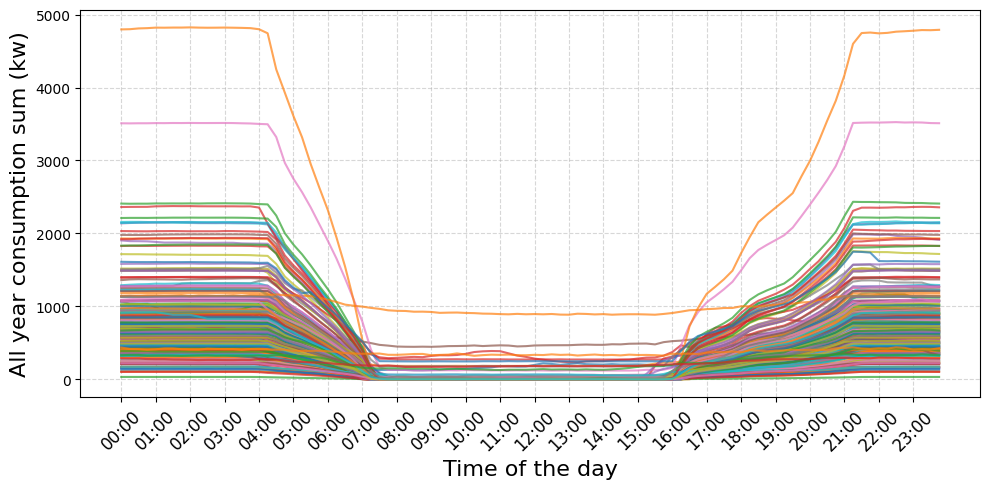

In [76]:
import matplotlib.pyplot as plt
import numpy as np

# Trova gli indici dove label è 0
indices_label_0 = np.where(labels_manual == 0)[0]

# Prendi i primi 10 (o meno se meno di n disponibili)
n = 500
first_10_idx = indices_label_0[:n]

time_labels = [f"{h:02d}:00" for h in range(24)]
x_ticks = np.arange(0, 96, 4)

plt.figure(figsize=(10, 5))

for i in first_10_idx:
    plt.plot(X_raw[i].ravel(), label=f'meterID {march_ts_matrix.index[i]}', alpha=0.7)

plt.xticks(ticks=x_ticks, labels=time_labels, rotation=45, fontsize=12)
#plt.title(f"All {len(first_10_idx)} Time Series with Label 0")
plt.xlabel("Time of the day", fontsize=16)
plt.ylabel("All year consumption sum (kw)", fontsize=16)
#plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.grid(True)
plt.tight_layout()
plt.savefig(f"public_lights.png", dpi=300)
plt.show()


In [77]:
from collections import Counter

summary = Counter(labels_manual)

print(f"Label 0: {summary[0]} time series")
print(f"Label 1: {summary[1]} time series")

Label 0: 234 time series
Label 1: 765 time series


In [79]:
# Crea una Series con index = meterID e valori = labels_manual
cluster_ts_series = pd.Series(labels_manual, index=march_ts_matrix.index, name='cluster_ts')

# Merge 
df = df.merge(cluster_ts_series, on='meterID', how='left')

df_filtered = df[(df['cluster_ts'] != 0)]

# general plot

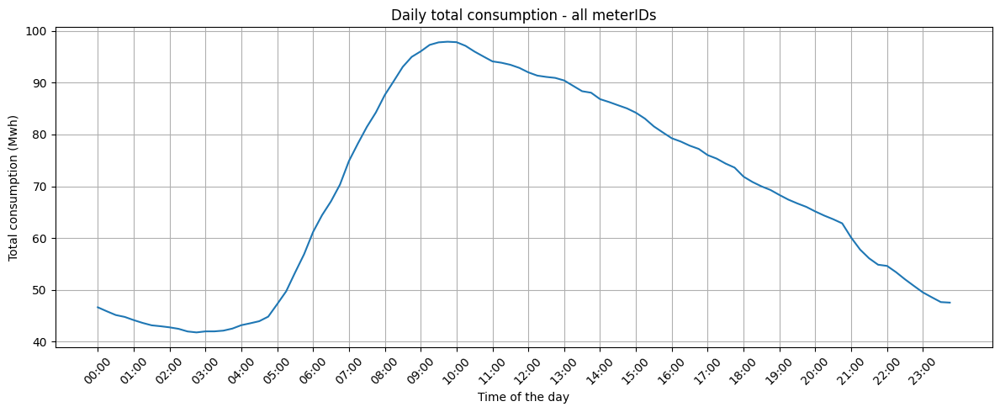

In [153]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Aggrega per giorno → somma tutte le consumption per ogni giorno
daily_profiles = (
    df_filtered
    .groupby('date')['consumption']
    .apply(lambda series_list: np.sum(np.vstack(series_list), axis=0))
)

# Step 2: Media giornaliera per ogni time step (0–95)
mean_daily_profile = np.sum(np.vstack(daily_profiles.values), axis=0)*0.25/1000

# Step 3: Etichette orarie (ogni 4 step → 1 ora)
time_labels = [f"{h:02d}:00" for h in range(24)]
x_ticks = np.arange(0, 96, 4)

# Step 4: Plot
plt.figure(figsize=(12, 5))
plt.plot(mean_daily_profile)
plt.xticks(ticks=x_ticks, labels=time_labels, rotation=45)
plt.title('Daily total consumption - all meterIDs')
plt.xlabel('Time of the day')
plt.ylabel('Total consumption (Mwh)')
plt.grid(True)
plt.tight_layout()
plt.show()

# Data clustering on max consumption

Some functions to introduce specific features to the dataset:

In [81]:
def assign_season(month, day):
    """Assigns a season based on exact start and end dates."""
    if (month == 12 and day >= 21) or (month in [1, 2]) or (month == 3 and day <= 19):
        return 'Winter'
    elif (month == 3 and day >= 20) or (month in [4, 5]) or (month == 6 and day <= 20):
        return 'Spring'
    elif (month == 6 and day >= 21) or (month in [7, 8]) or (month == 9 and day <= 22):
        return 'Summer'
    else:
        return 'Autumn'

def add_season_and_weekday(df):
    # Apply the function to create a new 'season' column
    df['season'] = df.apply(lambda row: assign_season(row['month'], row['day']), axis=1)
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']])
    df['weekday'] = df['date'].dt.day_name()
    return df

def add_zips(df,filtered_zips):
    # If meterID is index in filtered_zips, reset it
    filtered = filtered_zips.reset_index()
    # Merge on 'meterID'
    df_fin = df.merge(filtered[['meterID', 'ZIP']], on='meterID', how='left')
    return df_fin


def separate_weekdays(df):
    # Define fixed-date holidays as (day, month)
    festive_days = {(1, 1), (6, 1), (25, 3), (28, 3), (25, 4), (1, 5),
                    (8, 5), (5, 7), (29, 8), (1, 9), (15, 9),
                    (1, 11), (17, 11), (24, 12), (25, 12), (26, 12)}
    
    # Identify all rows that are weekends OR in the festive days list
    is_weekend = df['weekday'].isin(['Sunday', 'Saturday'])
    is_festive = df[['day', 'month']].apply(tuple, axis=1).isin(festive_days)

    end = df[is_weekend | is_festive].copy()
    week = df[~(is_weekend | is_festive)].copy()
    
    return week, end

In [82]:
# SKIP THIS IF YOU LOAD THE DATASET DF_ULTIMATE ALREADY PRE-PROCESSED
df = add_season_and_weekday(df)
week,end = separate_weekdays(df)

In [2]:
df = pd.read_json("df_ultimate.json", orient="records")

In [3]:
# COMPUTE MAX AND MIN ACROSS ALL YEAR FOR EACH METERID
# Flatten each day's consumption into a single array per meterID
# Compute mean of daily max values per meterID
agg_stats = (
    df.groupby('meterID')['consumption']
    .apply(lambda cons_lists: np.mean([np.max(day) for day in cons_lists]))
    .to_frame(name='mean_daily_max')
)

agg_stats['min_consumption'] = (
    df.groupby('meterID')['consumption']
    .apply(lambda cons_lists: np.min(np.concatenate(cons_lists.values)))
)

# Resulting DataFrame with meterID as index and max/min columns
print(agg_stats.head())


         mean_daily_max  min_consumption
meterID                                 
1              1.633214             0.10
2              3.669615             0.00
3              3.177088             0.00
4              1.917912             0.13
5              0.410887             0.00


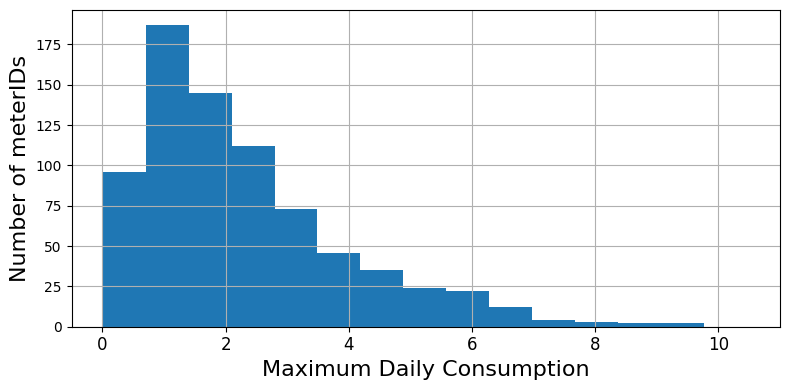

In [4]:
# gruppi poco equilibrati: controllo

plt.figure(figsize=(8, 4))
agg_stats['mean_daily_max'].hist(bins=21)
#plt.title('Distribution of max_val')
plt.xlabel('Maximum Daily Consumption', fontsize=16)
plt.ylabel('Number of meterIDs', fontsize=16)
plt.grid(True)
plt.xlim(-0.5, 11)
plt.xticks(fontsize=12)
plt.tight_layout()
plt.savefig(f"max_val_plot.png", dpi=300)
plt.show()

C:\Users\marco\anaconda3\envs\pandapower_env\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\marco\anaconda3\envs\pandapower_env\lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")
C:\Users\marco\anaconda3\envs\pandapower_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\marco\anaconda3\envs\pandapower_env\lib\site-packages\sklearn\cluster\_kmeans.py:

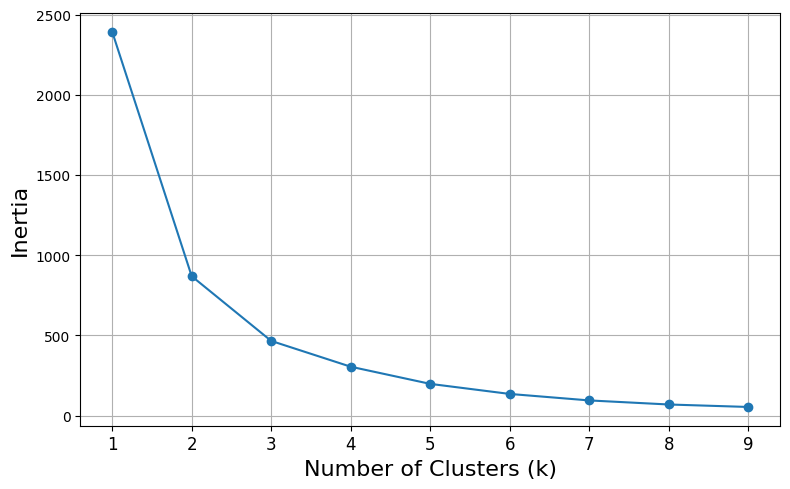

In [5]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

# Your data: assuming you have a column 'max_consumption' in a DataFrame df
X = agg_stats['mean_daily_max'].values.reshape(-1, 1)

# Try different numbers of clusters
k_values = range(1, 10)
inertias = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
    kmeans.fit(X)
    inertias.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(k_values, inertias, marker='o')
plt.xticks(k_values, fontsize=12)
#plt.title("Inertia vs. Number of Clusters (Elbow Method)")
plt.xlabel("Number of Clusters (k)", fontsize=16)
plt.ylabel("Inertia", fontsize=16)
plt.grid(True)
plt.tight_layout()
plt.savefig(f"inertia_plot.png", dpi=300)
plt.show()


In [6]:
from sklearn.cluster import KMeans

k = 3  # or your chosen value
X = agg_stats['mean_daily_max'].values.reshape(-1, 1)

kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
agg_stats['consumption_group'] = kmeans.fit_predict(X)

C:\Users\marco\anaconda3\envs\pandapower_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


In [7]:
agg_stats['consumption_group'].value_counts().sort_index()

consumption_group
0    253
1    437
2     75
Name: count, dtype: int64

In [8]:
# Get the cluster centers and sort them
centers = kmeans.cluster_centers_.flatten()
sorted_indices = np.argsort(centers)

# Create a mapping: {old_label: new_label}
label_map = {old: new for new, old in enumerate(sorted_indices)}

# Apply the mapping
agg_stats['consumption_group'] = agg_stats['consumption_group'].map(label_map)


In [9]:
agg_stats

,mean_daily_max,min_consumption,consumption_group
meterID,,,
1,1.633214,0.10,0
2,3.669615,0.00,1
3,3.177088,0.00,1
4,1.917912,0.13,0
5,0.410887,0.00,0
...,...,...,...
996,2.011978,0.01,0
997,1.066250,0.00,0
998,2.003201,0.00,0


In [10]:
agg_stats['consumption_group'].value_counts().sort_index()

consumption_group
0    437
1    253
2     75
Name: count, dtype: int64

In [11]:
print(np.mean(agg_stats[agg_stats['consumption_group'] == 0]['mean_daily_max'].values))
print(np.mean(agg_stats[agg_stats['consumption_group'] == 1]['mean_daily_max'].values))
print(np.mean(agg_stats[agg_stats['consumption_group'] == 2]['mean_daily_max'].values))

1.1739976179928144
3.122304097994602
6.3042542012258025


# plot by group and seasonality

In [167]:
# SKIP THIS IF YOU LOAD THE DATASET DF_ULTIMATE ALREADY PRE-PROCESSED
df = df.merge(agg_stats['consumption_group'], on='meterID', how='left')

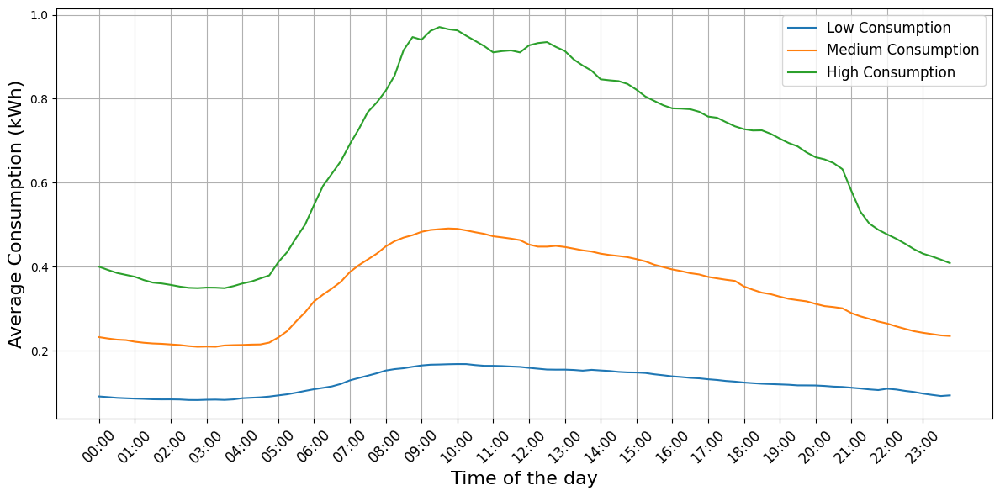

In [12]:
avg_profiles_case_b = {}

group_labels = {
    0: "Low Consumption",
    1: "Medium Consumption",
    2: "High Consumption"
}


for g in sorted(df['consumption_group'].unique()):
    df_group = df[df['consumption_group'] == g]

    # Concatenazione diretta di tutti i profili giornalieri
    all_profiles = np.vstack(df_group['consumption'].values) * 0.25  # consumo in kWh

    # Media globale per ciascun time step
    mean_profile = np.mean(all_profiles, axis=0)
    avg_profiles_case_b[g] = mean_profile

time_labels = [f"{h:02d}:00" for h in range(24)]
x_ticks = np.arange(0, 96, 4)

# === PLOT per Caso B ===
plt.figure(figsize=(12, 6))
for g, profile in avg_profiles_case_b.items():
    plt.plot(profile, label=f"{group_labels[g]}")

#plt.title("Daily Average per Meter")
plt.xlabel("Time of the day", fontsize=16)
plt.ylabel("Average Consumption (kWh)", fontsize=16)
plt.xticks(ticks=x_ticks, labels=time_labels, rotation=45, fontsize=12)
plt.grid(True)
plt.legend(fontsize=12)
plt.tight_layout()
plt.savefig(f"group_profiles.png", dpi=300)

plt.show()


In [15]:
low_profile = avg_profiles_case_b[0]      # "Low Consumption"
medium_profile = avg_profiles_case_b[1]   # "Medium Consumption"
high_profile = avg_profiles_case_b[2]     # "High Consumption"

In [19]:
import numpy as np

# Somma profili medi di tutti i gruppi per ogni time step
total_profile = low_profile + medium_profile + high_profile

# Indici per le tre fasce orarie
fasce = {
    '6-9':     (25, 36),
    '12-15':   (48, 60),
    '19-22':   (76, 88)
}

totali_fasce = {}

for nome, (inizio, fine) in fasce.items():
    consumo = np.sum(total_profile[inizio:fine+1])
    totali_fasce[nome] = consumo
    print(f"{nome}: {consumo:.2f} kWh")

# Trova la fascia col consumo massimo
fascia_max = max(totali_fasce, key=totali_fasce.get)
consumo_max = totali_fasce[fascia_max]
print(f"\nFascia di riferimento: {fascia_max} ({consumo_max:.2f} kWh)\n")

# Calcola k per tutte le fasce
for nome, consumo in totali_fasce.items():
    k = consumo / consumo_max
    print(f"Fascia {nome}: k = {k:.2f}")


6-9: 16.04 kWh
12-15: 19.14 kWh
19-22: 13.31 kWh

Fascia di riferimento: 12-15 (19.14 kWh)

Fascia 6-9: k = 0.84
Fascia 12-15: k = 1.00
Fascia 19-22: k = 0.70


In [21]:
print(len(df[df['consumption_group'] == 0]['meterID'].unique()))
print(len(df[df['consumption_group'] == 1]['meterID'].unique()))
print(len(df[df['consumption_group'] == 2]['meterID'].unique()))

437
253
75


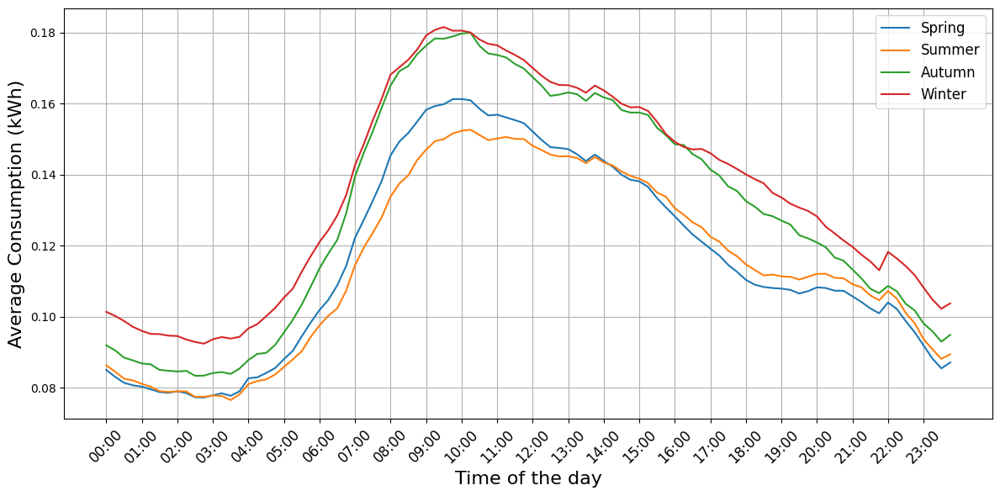

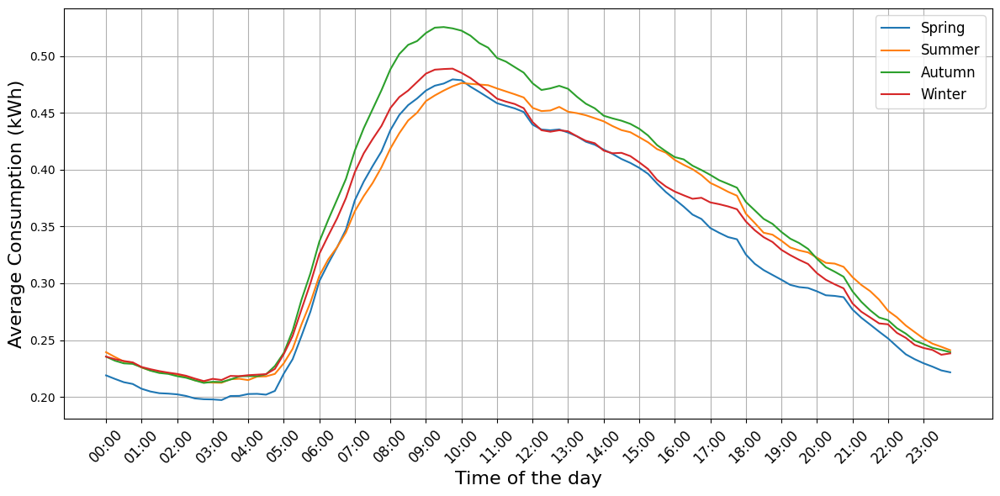

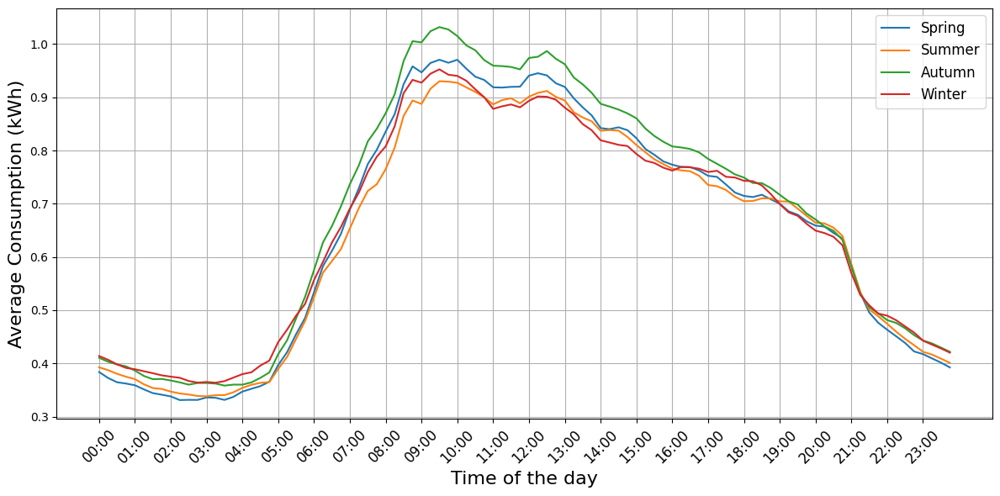

In [171]:
# compare seasons

seasons = ['Spring', 'Summer', 'Autumn', 'Winter']
group_labels = {
    0: "Low Consumption",
    1: "Medium Consumption",
    2: "High Consumption"
}

time_labels = [f"{h:02d}:00" for h in range(24)]
x_ticks = np.arange(0, 96, 4)

# Precompute seasonal profiles per group
seasonal_profiles_by_group = {0: {}, 1: {}, 2: {}}

for season in seasons:
    df_season = df[df['season'] == season]

    for g in sorted(df['consumption_group'].unique()):
        df_group = df_season[df_season['consumption_group'] == g]

        if df_group.empty:
            continue

        all_profiles = np.vstack(df_group['consumption'].values) * 0.25  # kWh
        mean_profile = np.mean(all_profiles, axis=0)
        seasonal_profiles_by_group[g][season] = mean_profile

# Plot one figure per group
for g in sorted(seasonal_profiles_by_group.keys()):
    plt.figure(figsize=(12, 6))
    
    for season in seasons:
        profile = seasonal_profiles_by_group[g].get(season)
        if profile is not None:
            plt.plot(profile, label=season)

    #plt.title(f"{group_labels[g]} – Daily Average per Meter Across Seasons")
    plt.xlabel("Time of the day", fontsize=16)
    plt.ylabel("Average Consumption (kWh)", fontsize=16)
    plt.xticks(ticks=x_ticks, labels=time_labels, rotation=45, fontsize=12)
    plt.grid(True)
    plt.legend(fontsize=12)
    plt.tight_layout()
    plt.savefig(f"group_profiles_{g}.png", dpi=300)
    plt.show()


# weedays and weekends

In [172]:
week,end = separate_weekdays(df)

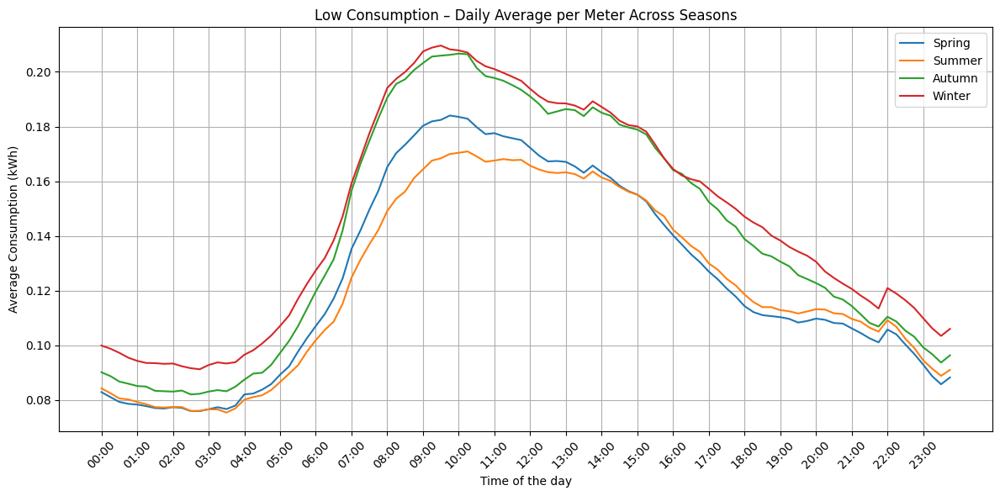

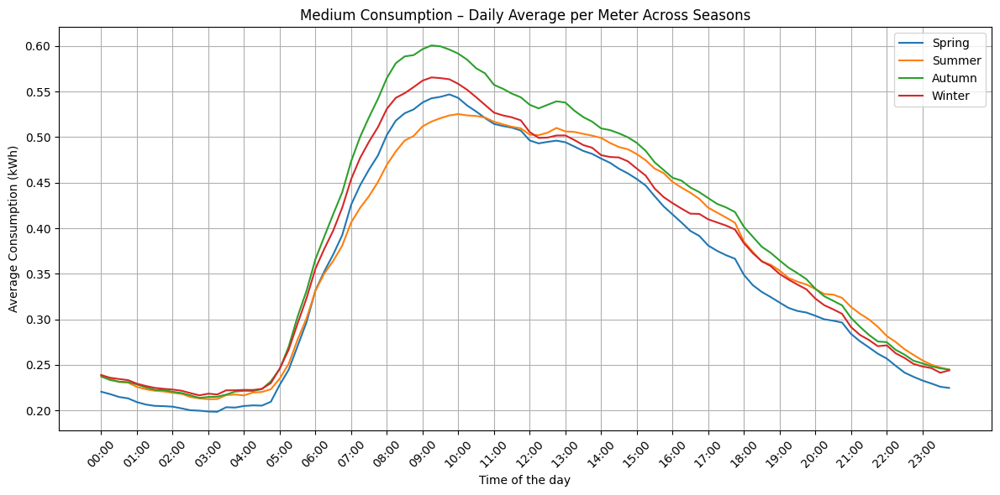

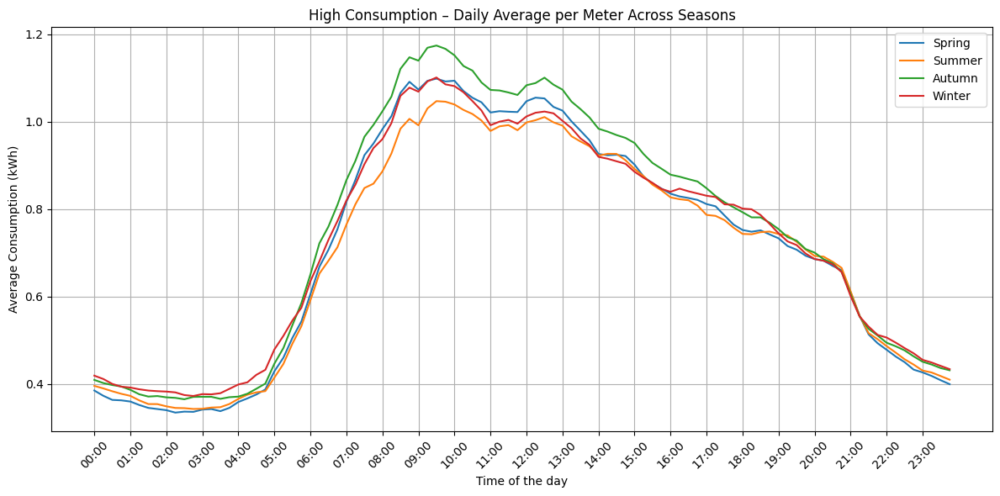

In [173]:
# compare seasons

seasons = ['Spring', 'Summer', 'Autumn', 'Winter']
group_labels = {
    0: "Low Consumption",
    1: "Medium Consumption",
    2: "High Consumption"
}

time_labels = [f"{h:02d}:00" for h in range(24)]
x_ticks = np.arange(0, 96, 4)

# Precompute seasonal profiles per group
seasonal_profiles_by_group = {0: {}, 1: {}, 2: {}}

for season in seasons:
    df_season = week[week['season'] == season]

    for g in sorted(df['consumption_group'].unique()):
        df_group = df_season[df_season['consumption_group'] == g]

        if df_group.empty:
            continue

        all_profiles = np.vstack(df_group['consumption'].values) * 0.25  # kWh
        mean_profile = np.mean(all_profiles, axis=0)
        seasonal_profiles_by_group[g][season] = mean_profile

# Plot one figure per group
for g in sorted(seasonal_profiles_by_group.keys()):
    plt.figure(figsize=(12, 6))
    
    for season in seasons:
        profile = seasonal_profiles_by_group[g].get(season)
        if profile is not None:
            plt.plot(profile, label=season)

    plt.title(f"{group_labels[g]} – Daily Average per Meter Across Seasons")
    plt.xlabel("Time of the day")
    plt.ylabel("Average Consumption (kWh)")
    plt.xticks(ticks=x_ticks, labels=time_labels, rotation=45)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


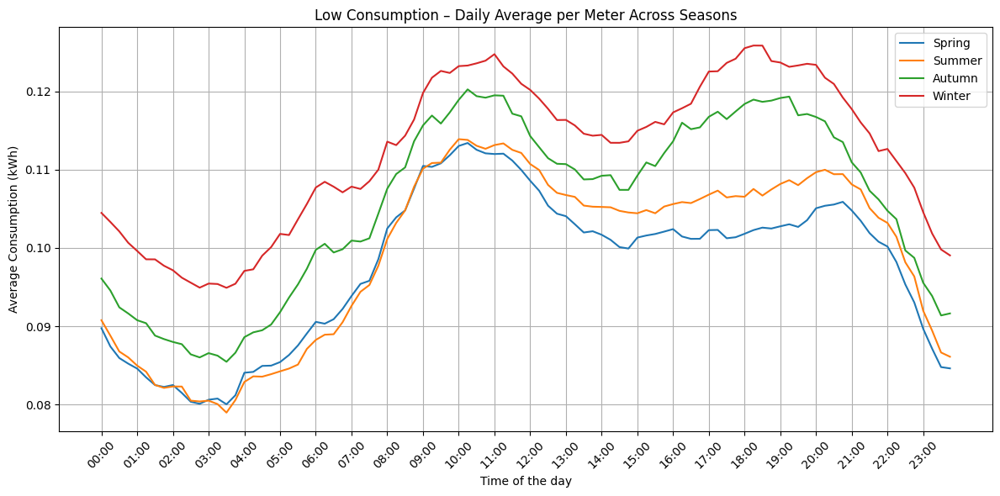

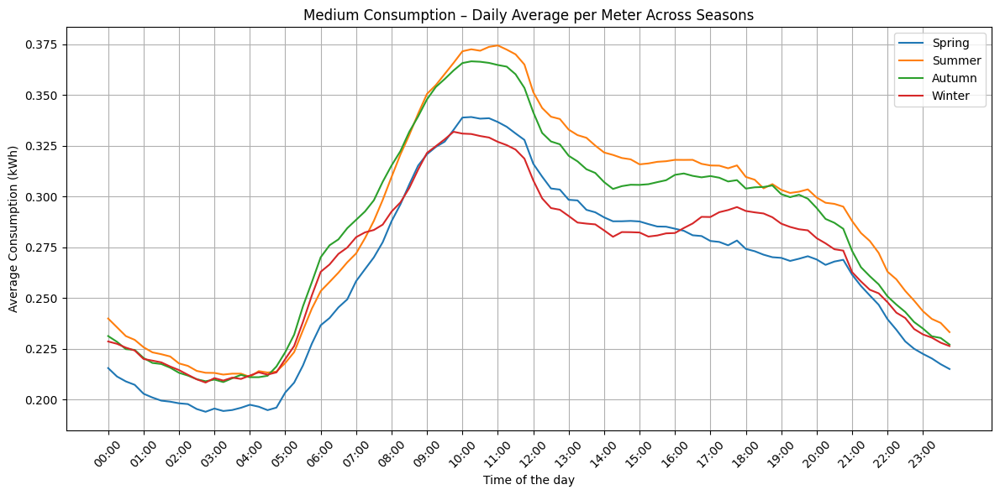

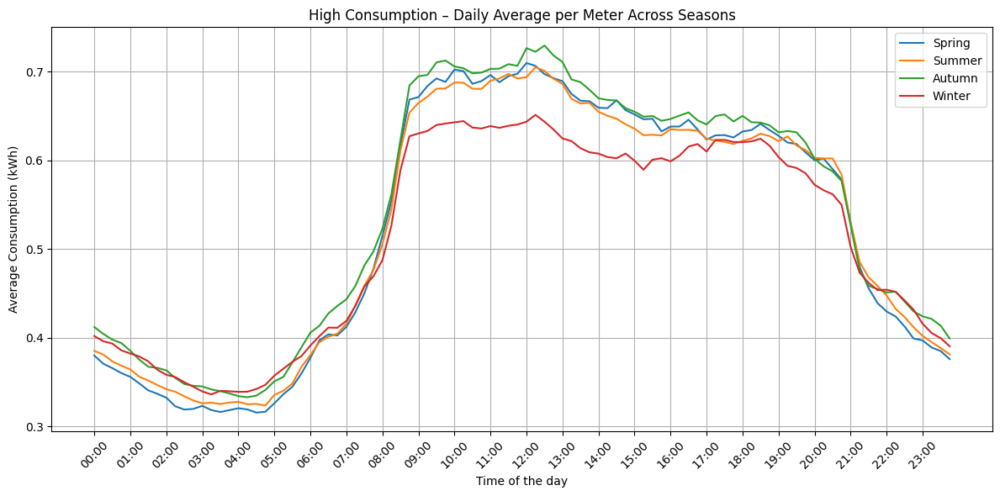

In [174]:
# compare seasons

seasons = ['Spring', 'Summer', 'Autumn', 'Winter']
group_labels = {
    0: "Low Consumption",
    1: "Medium Consumption",
    2: "High Consumption"
}

time_labels = [f"{h:02d}:00" for h in range(24)]
x_ticks = np.arange(0, 96, 4)

# Precompute seasonal profiles per group
seasonal_profiles_by_group = {0: {}, 1: {}, 2: {}}

for season in seasons:
    df_season = end[end['season'] == season]

    for g in sorted(df['consumption_group'].unique()):
        df_group = df_season[df_season['consumption_group'] == g]

        if df_group.empty:
            continue

        all_profiles = np.vstack(df_group['consumption'].values) * 0.25  # kWh
        mean_profile = np.mean(all_profiles, axis=0)
        seasonal_profiles_by_group[g][season] = mean_profile

# Plot one figure per group
for g in sorted(seasonal_profiles_by_group.keys()):
    plt.figure(figsize=(12, 6))
    
    for season in seasons:
        profile = seasonal_profiles_by_group[g].get(season)
        if profile is not None:
            plt.plot(profile, label=season)

    plt.title(f"{group_labels[g]} – Daily Average per Meter Across Seasons")
    plt.xlabel("Time of the day", fontsize = 16)
    plt.yticks(fontsize = 12)
    plt.ylabel("Average Consumption (kWh)", fontsize = 16)
    plt.xticks(ticks=x_ticks, labels=time_labels, rotation=45, fontsize = 12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(fontsize = 12)
    plt.tight_layout()
    plt.show()


# weekday vs weekend

In [ ]:
#PROVA QUESTO SOTTO PER I COLORI ASSOCIATI ALLE STAGIONI

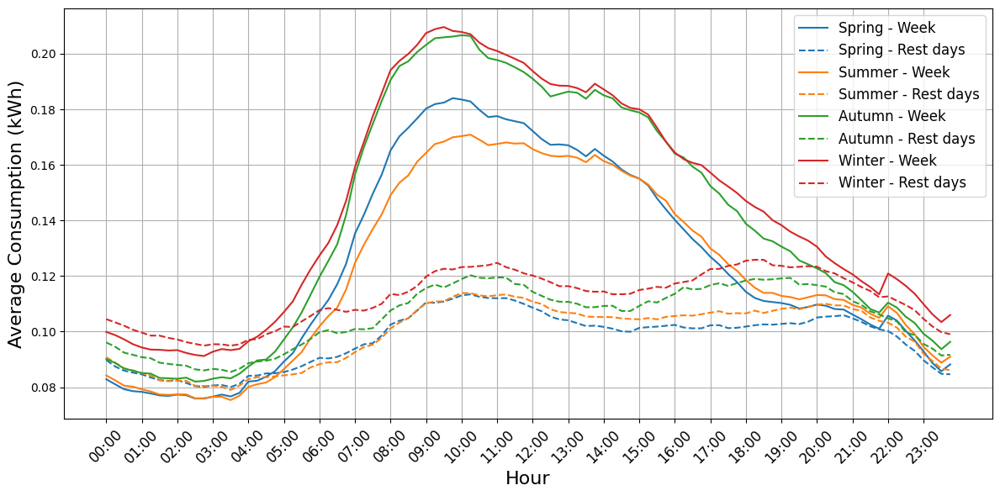

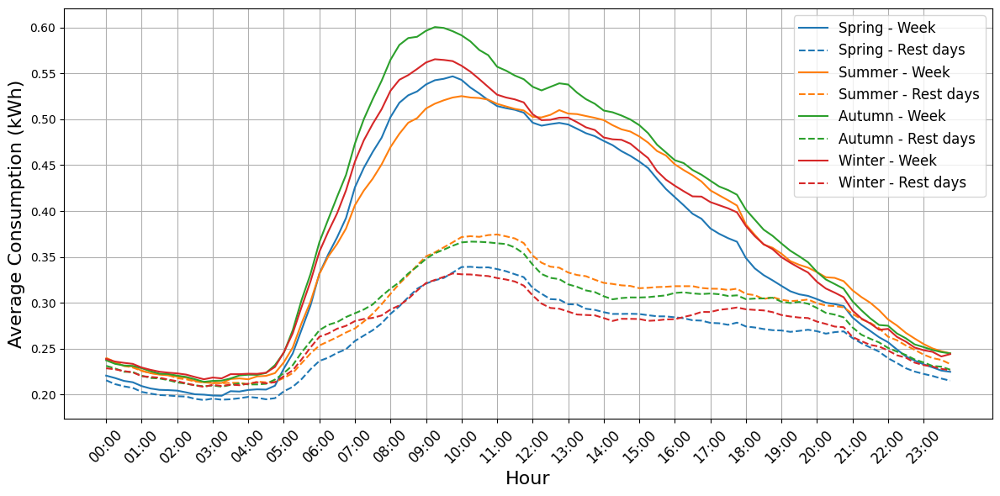

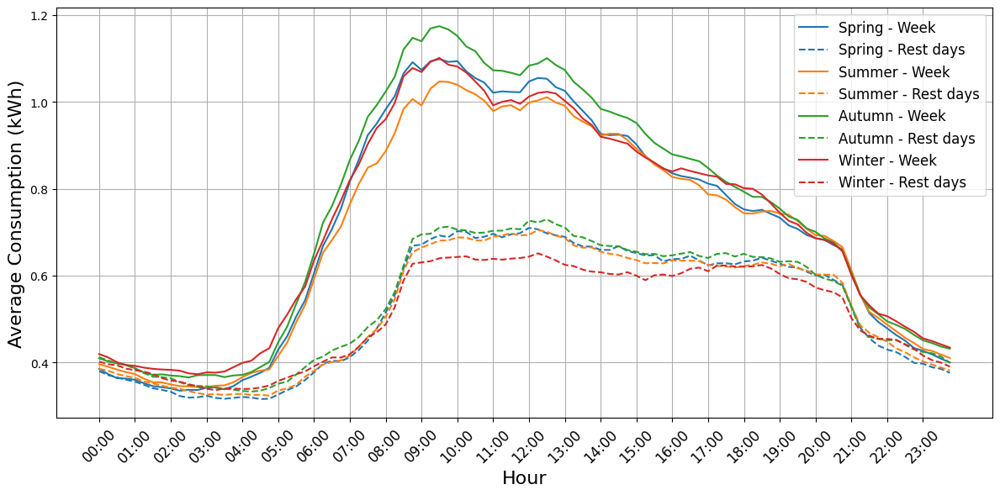

In [175]:
import matplotlib.pyplot as plt
import numpy as np

group_labels = {
    0: "Low Consumption",
    1: "Medium Consumption",
    2: "High Consumption"
}

season_list = ['Spring', 'Summer', 'Autumn', 'Winter']
season_colors = {
    'Spring': 'tab:blue',
    'Summer': 'tab:orange',
    'Autumn': 'tab:green',
    'Winter': 'tab:red'
}

time_labels = [f"{h:02d}:00" for h in range(24)]
x_ticks = np.arange(0, 96, 4)

# Iterate over groups
for group_id in sorted(df['consumption_group'].unique()):
    plt.figure(figsize=(12, 6))

    for season in season_list:
        # Filter week + end for current group and season
        week_subset = week[(week['consumption_group'] == group_id) & (week['season'] == season)]
        end_subset = end[(end['consumption_group'] == group_id) & (end['season'] == season)]

        # Weekday line (solid)
        if not week_subset.empty:
            all_week = np.vstack(week_subset['consumption'].values) * 0.25
            mean_week = np.mean(all_week, axis=0)
            plt.plot(mean_week, label=f"{season} - Week", color=season_colors[season], linestyle='-')

        # Weekend line (dashed)
        if not end_subset.empty:
            all_end = np.vstack(end_subset['consumption'].values) * 0.25
            mean_end = np.mean(all_end, axis=0)
            plt.plot(mean_end, label=f"{season} - Rest days", color=season_colors[season], linestyle='--')

    # Plot formatting
    #plt.title(f"{group_labels[group_id]} – Daily Average per Meter (Week vs End by Season)")
    plt.xlabel("Hour", fontsize=16)
    plt.ylabel("Average Consumption (kWh)", fontsize=16)
    plt.xticks(ticks=x_ticks, labels=time_labels, rotation=45, fontsize=12)
    plt.grid(True)
    plt.legend(fontsize=12)
    plt.tight_layout()
    plt.savefig(f"week_vs_holy_{group_id}.png", dpi=300)
    plt.show()



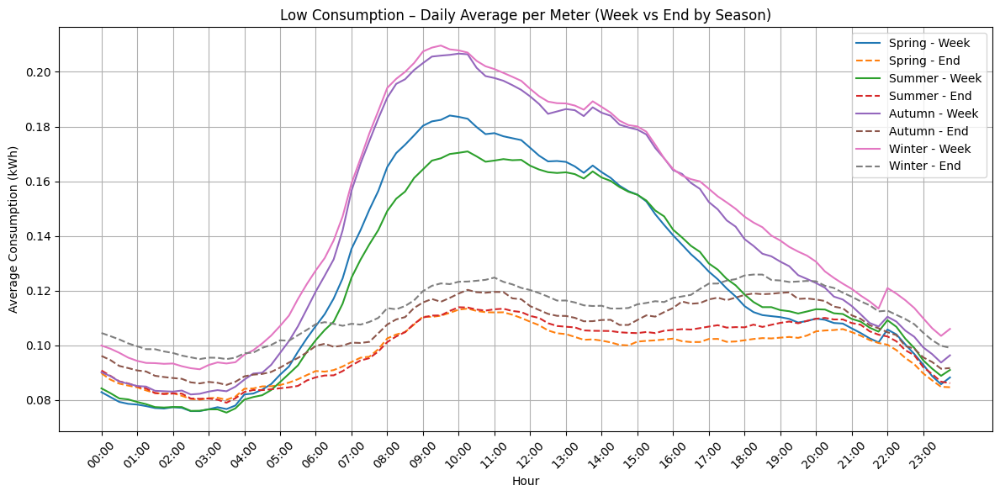

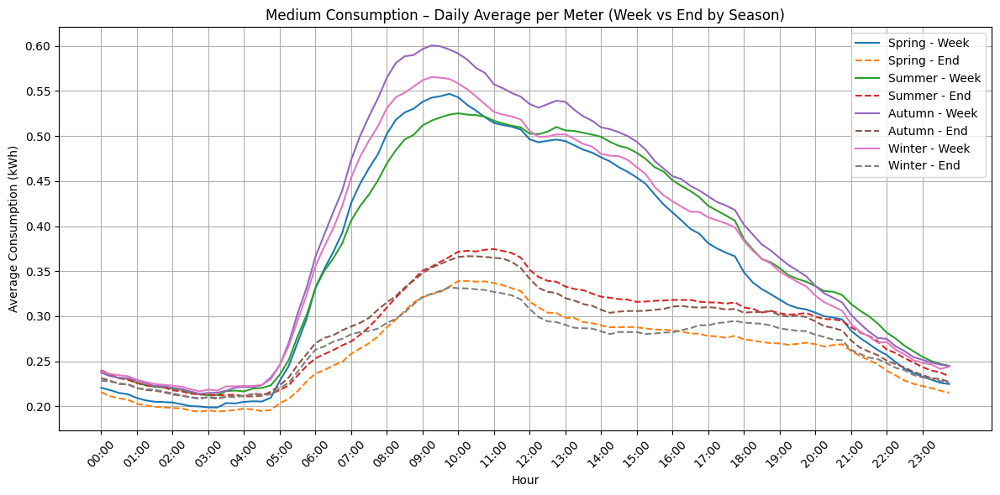

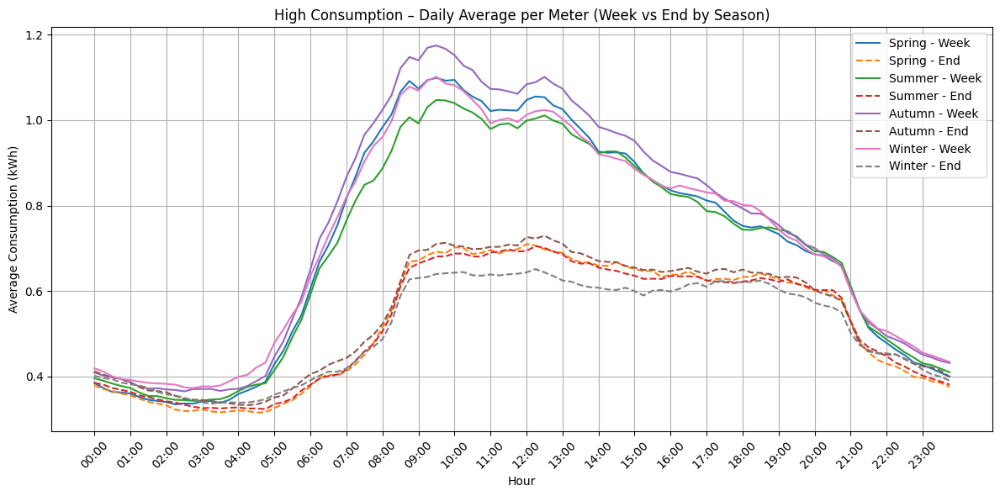

In [176]:
import matplotlib.pyplot as plt
import numpy as np

group_labels = {
    0: "Low Consumption",
    1: "Medium Consumption",
    2: "High Consumption"
}

season_list = ['Spring', 'Summer', 'Autumn', 'Winter']
time_labels = [f"{h:02d}:00" for h in range(24)]
x_ticks = np.arange(0, 96, 4)

# Iterate over groups
for group_id in sorted(df['consumption_group'].unique()):
    plt.figure(figsize=(12, 6))

    for season in season_list:
        # Filter week + end for current group and season
        week_subset = week[(week['consumption_group'] == group_id) & (week['season'] == season)]
        end_subset = end[(end['consumption_group'] == group_id) & (end['season'] == season)]

        # Compute mean profile for week
        if not week_subset.empty:
            all_week = np.vstack(week_subset['consumption'].values) * 0.25
            mean_week = np.mean(all_week, axis=0)
            plt.plot(mean_week, label=f"{season} - Week")

        # Compute mean profile for end
        if not end_subset.empty:
            all_end = np.vstack(end_subset['consumption'].values) * 0.25
            mean_end = np.mean(all_end, axis=0)
            plt.plot(mean_end, label=f"{season} - End", linestyle='--')

    # Plot formatting
    plt.title(f"{group_labels[group_id]} – Daily Average per Meter (Week vs End by Season)")
    plt.xlabel("Hour")
    plt.ylabel("Average Consumption (kWh)")
    plt.xticks(ticks=x_ticks, labels=time_labels, rotation=45)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


# PILOT RUN (same costs, to be repeated for each mor/aft/eve data)

In [7]:
#df = pd.read_json("df_ultimate.json", orient="records")

In [153]:
def sample_consume_joint_real(l, m, h, t, chosen_date):
    # Extract consumption values at time t for all rows from each group on the same day
    group_L = df[(df['date'] == chosen_date) & (df['consumption_group'] == 0)]
    group_M = df[(df['date'] == chosen_date) & (df['consumption_group'] == 1)]
    group_H = df[(df['date'] == chosen_date) & (df['consumption_group'] == 2)]

    # Ensure all groups have data for that day
    if group_L.empty or group_M.empty or group_H.empty:
        raise ValueError(f"Missing group data on {chosen_date} at t={t}")

    # === Sample a single row from each group — this preserves daily correlation ===
    row_L = group_L.sample(n=1).iloc[0]
    row_M = group_M.sample(n=1).iloc[0]
    row_H = group_H.sample(n=1).iloc[0]

    val_L = row_L['consumption'][t]  # in W
    val_M = row_M['consumption'][t]
    val_H = row_H['consumption'][t]

    # Total load scaled by number of users in each group, then converted to MW
    total = (l * val_L + m * val_M + h * val_H) / 1000  # kW → MW
    return total

In [154]:
def sample_loads_joint_MOR(chosen_date, t): # 60-30-10  --> percentages of low-med-high consumptions profiles assumed in the morning
    loads = []
    loads.append(sample_consume_joint_real(120, 60, 20, t, chosen_date))
    loads.append(sample_consume_joint_real(180, 90, 30, t, chosen_date))
    loads.append(sample_consume_joint_real(312,156, 52, t, chosen_date))
    loads.append(sample_consume_joint_real(240,120, 40, t, chosen_date))
    loads.append(sample_consume_joint_real(252,126, 42, t, chosen_date))
    loads.append(sample_consume_joint_real(204, 102, 34, t, chosen_date))
    loads.append(sample_consume_joint_real(144, 72, 24, t, chosen_date))
    loads.append(sample_consume_joint_real(96, 96, 18, t, chosen_date))
    return [l * 0.85 for l in loads]

def sample_loads_joint_AFT(chosen_date, t): # 40-40-20  --> percentages of low-med-high consumptions profiles assumed in the afternoon
    loads = []
    loads.append(sample_consume_joint_real(80, 80, 40, t, chosen_date))
    loads.append(sample_consume_joint_real(120, 120, 60, t, chosen_date))
    loads.append(sample_consume_joint_real(208, 208, 104, t, chosen_date))
    loads.append(sample_consume_joint_real(160, 160, 80, t, chosen_date))
    loads.append(sample_consume_joint_real(168, 168, 84, t, chosen_date))
    loads.append(sample_consume_joint_real(136, 136, 68, t, chosen_date))
    loads.append(sample_consume_joint_real(96, 96, 48, t, chosen_date))
    loads.append(sample_consume_joint_real(64, 64, 32, t, chosen_date))
    return loads

def sample_loads_joint_EVE(chosen_date, t):  # 20-40-40   --> percentages of low-med-high consumptions profiles assumed in the evening
    loads = []
    loads.append(sample_consume_joint_real(40, 40, 80, t, chosen_date))
    loads.append(sample_consume_joint_real(60, 120, 120, t, chosen_date))
    loads.append(sample_consume_joint_real(104, 208, 208, t, chosen_date))
    loads.append(sample_consume_joint_real(80, 160, 160, t, chosen_date))
    loads.append(sample_consume_joint_real(84, 168, 168, t, chosen_date))
    loads.append(sample_consume_joint_real(68, 136, 136, t, chosen_date))
    loads.append(sample_consume_joint_real(48, 96, 96, t, chosen_date))
    loads.append(sample_consume_joint_real(32, 64, 64, t, chosen_date))
    return [l * 0.7 for l in loads]

**Total consumption values for each timeslot have been adjusted based on the coefficients K measured in the section "plot by group and seasonality" before. These are used just to preserve a sort of temporal coherence with the global trend of consumption timeseries.**

In [155]:
net = pn.create_cigre_network_mv(with_der="all")
net.sgen['controllable'] = True  # Imposta tutti i generatori come controllabili
# Constraints
net.sgen['min_p_mw'] = 0.05
net.sgen['max_p_mw'] = 5


net.sgen['min_q_mvar'] = -0.3 * net.sgen['max_p_mw']  # Example reactive power limits (adjust as needed)
net.sgen['max_q_mvar'] = 0.3 * net.sgen['max_p_mw']   # Example reactive power limits (adjust as needed)

net.load['min_q_mvar'] = 0.9 * net.load['q_mvar']
net.load['max_q_mvar'] = 1.1 * net.load['q_mvar']



net.ext_grid['min_p_mw'] = 0
net.ext_grid['max_p_mw'] = 80

net.bus["min_vm_pu"] = 0.9
net.bus["max_vm_pu"] = 1.1

net.trafo["max_loading_percent"] = 95
net.line["max_loading_percent"] = 95

# Cost functions
for idx in net.ext_grid.index:
    pp.create_poly_cost(net, element=idx, et="ext_grid", cp1_eur_per_mw=5, cp2_eur_per_mw2=0.01, cp0_eur=10)

for idx in net.sgen.index:
    pp.create_poly_cost(net, element=idx, et="sgen", cp1_eur_per_mw=5, cp2_eur_per_mw2=0.01, cp0_eur=10)

In [156]:
# Parametri Monte Carlo
from scipy.stats import gaussian_kde
n_iterations = 455 # DEVE ESSERE MULTIPLO DI 13  

total_costs = []
results = []
results_weighted = []
loads_by_window = []
start_time = time.time()
fails = 0

household_indices = [1, 2, 3, 4, 5, 6, 7, 9]  # Indices of household-like loads

# 25-38 per le 6-9 AM
# 49-62 per le 12-15 PM
# 77- 90 per le 19-22 PM
# Esegui il ciclo Monte Carlo
with tqdm(total=n_iterations, desc="Esecuzione Monte Carlo", unit="iter") as pbar:
    for k in range(49,62): # time stamps dalle 6 alle 9 di mattina (LO FISSO)
        for iteration in range(n_iterations//13):  
            try:
    
                random_date = df['date'].sample(n=1).iloc[0]                
                sampled_p = sample_loads_joint_AFT(random_date, k)              
                                
                net.load.loc[household_indices, 'p_mw'] = sampled_p   # assign sampled values of P to households

                
                # Normalize active power to [0, 1]
                sampled_p_array = np.array(sampled_p)
                p_norm = (sampled_p_array - sampled_p_array.min()) / (sampled_p_array.max() - sampled_p_array.min())

                
                # Inverse scaling: high p → lower pf (i.e., more inductive), low p → higher pf
                sampled_pf = 0.98 - 0.03 * p_norm
                q_mvar = sampled_p * np.tan(np.arccos(sampled_pf))
                net.load.loc[household_indices, 'q_mvar'] = q_mvar    # assign sampled values of P to households


                
    
                # Run OPF
                try:
                    pp.runpp(net)
                except Exception as e:
                    print("PF did not converge:", e)
                    
                pp.runopp(net, init = 'pf') #, verbose=True, enforce_q_lims=True
    
                # Save results
                results = save_results_loads(net, results)
    
                # Update progress bar
                pbar.update(1)
    
            except Exception as e:
                fails = fails + 1
                print(f"Errore nell'iterazione {iteration}: {e}")


# Calcola il tempo totale
total_time = time.time() - start_time
minutes = int(total_time // 60)
seconds = int(total_time % 60)
perc = (n_iterations - fails)/n_iterations
print('--------------------------------------------------------------------------------')
print(f"Tempo totale per {n_iterations} iterazioni di Monte Carlo: {minutes} minuti e {seconds} secondi.")
print(f'Percentage of success of MC: {perc}')

Esecuzione Monte Carlo:   9%|████▊                                                  | 40/455 [00:35<05:54,  1.17iter/s]

Errore nell'iterazione 5: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  20%|███████████▏                                           | 93/455 [01:20<04:52,  1.24iter/s]

Errore nell'iterazione 24: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  30%|████████████████                                      | 135/455 [01:55<04:13,  1.26iter/s]

Errore nell'iterazione 32: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  57%|██████████████████████████████▉                       | 261/455 [03:43<02:25,  1.33iter/s]

Errore nell'iterazione 19: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  58%|███████████████████████████████▎                      | 264/455 [03:46<02:47,  1.14iter/s]

Errore nell'iterazione 23: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  96%|███████████████████████████████████████████████████▉  | 438/455 [09:20<00:12,  1.32iter/s]

Errore nell'iterazione 23: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  99%|█████████████████████████████████████████████████████▎| 449/455 [09:29<00:07,  1.27s/iter]

--------------------------------------------------------------------------------
Tempo totale per 455 iterazioni di Monte Carlo: 9 minuti e 30 secondi.
Percentage of success of MC: 0.9868131868131869


In [157]:
results_df_pilot_aft = pd.DataFrame(results)

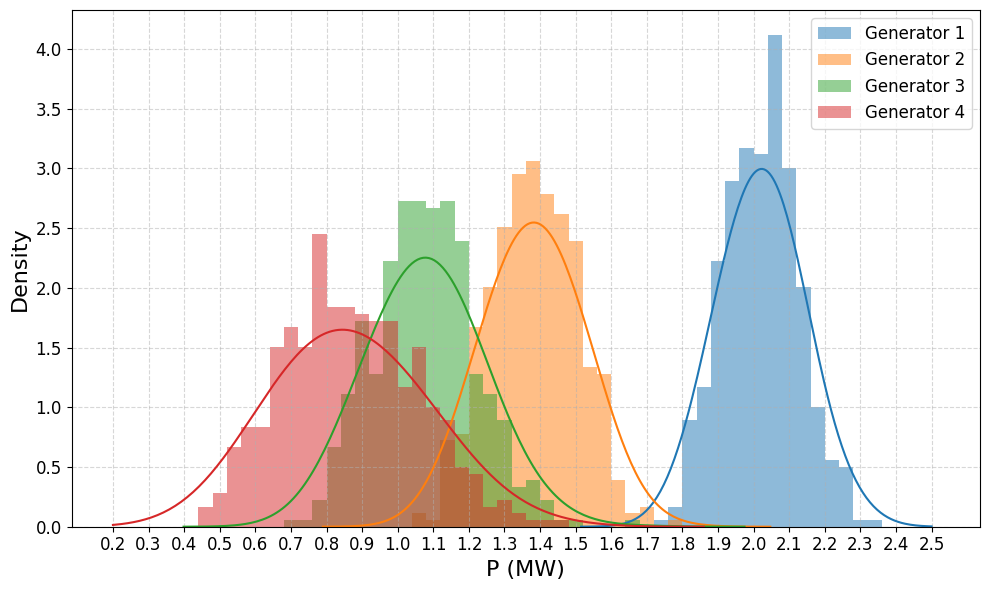

In [158]:
gen_df_pilot_aft = pd.DataFrame({
    f'gen{i+1}_p_mw': results_df_pilot_aft['sgen_p_mw'].apply(lambda x: x[i])
    for i in range(13)
})

plot_and_save_generator_distrib(gen_df_pilot_aft, save = 0)

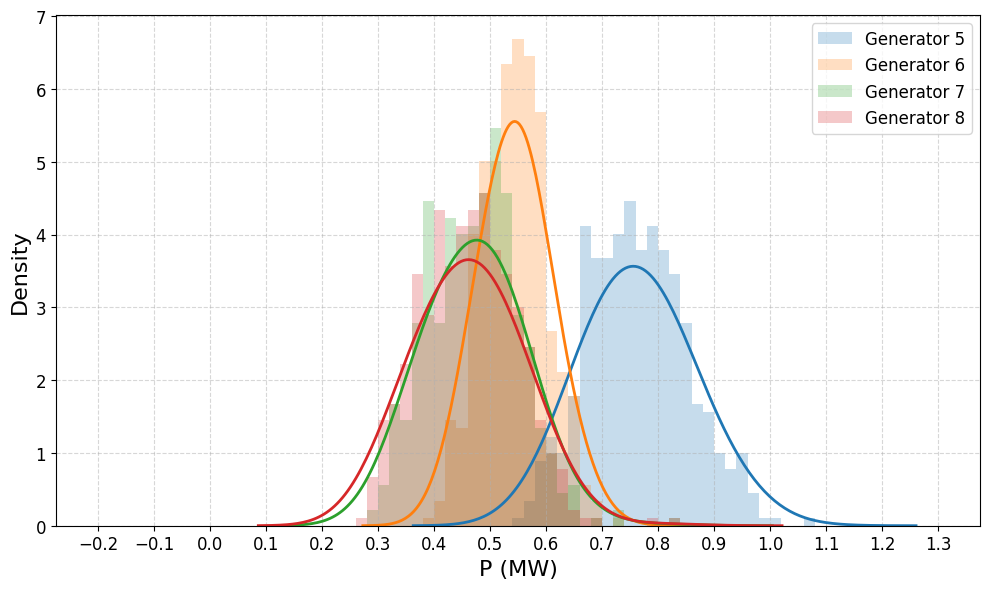

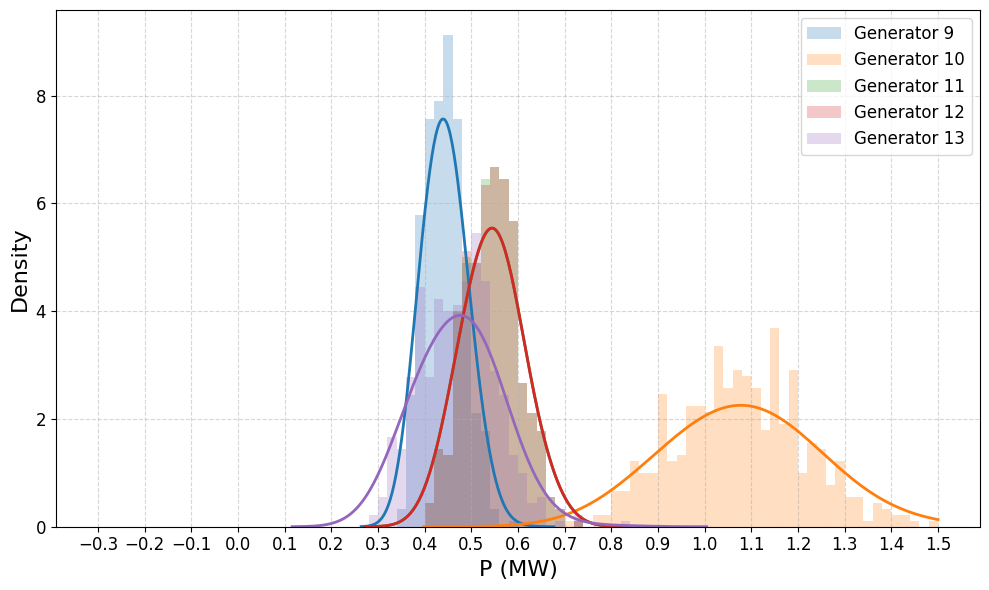

In [159]:
plot_and_save_generator_distrib_other(gen_df_pilot_aft, save = 0)

In [161]:
# Convert the column of lists into a 2D array (one column per generator)
gen_p_array = results_df_pilot_aft["sgen_p_mw"].apply(pd.Series)

# Compute mean and std for each generator (column-wise)
gen_means = gen_p_array.mean()
gen_stds = gen_p_array.std()

# Convert to NumPy arrays
means_array = gen_means.values
stds_array = gen_stds.values

In [275]:
# MORNING LAST
print(means_array)
print('------------------------------------------------------------------------')
print(stds_array)

[1.87449378 1.21347408 0.90307013 0.67092428 0.65353979 0.46769082
 0.37479833 0.35926917 0.39267894 0.90307006 0.46765258 0.46767026
 0.37479491]
------------------------------------------------------------------------
[0.07688661 0.08984813 0.10163045 0.13416646 0.06436741 0.04312919
 0.05819604 0.06370215 0.0308027  0.10163038 0.04304346 0.04307345
 0.05820632]


In [162]:
# AFTERNOON last
print(means_array)
print('------------------------------------------------------------------------')
print(stds_array)

[2.0203149  1.38207638 1.07858783 0.8672702  0.76328588 0.54422791
 0.47120897 0.46152491 0.44255166 1.07858783 0.5442478  0.54424229
 0.47120847]
------------------------------------------------------------------------
[0.10533083 0.12239961 0.14201356 0.18975157 0.08892284 0.05742054
 0.08007384 0.08590903 0.04143776 0.14201359 0.05751899 0.05747985
 0.0800693 ]


In [98]:
# EVENING last
print(means_array)
print('------------------------------------------------------------------------')
print(stds_array)

[1.88160904 1.22971615 0.92215273 0.69116499 0.66661729 0.47767954
 0.38819577 0.37337201 0.39942283 0.92215262 0.47753437 0.47759276
 0.38820104]
------------------------------------------------------------------------
[0.06763304 0.08578045 0.1057672  0.14089372 0.06923335 0.04357772
 0.05907277 0.06285725 0.03232187 0.10576716 0.04353429 0.04354854
 0.05907846]


# OPF BENCHMARK (different cost functions, to be repeated for each mor/aft/eve data)

In [2]:
df = pd.read_json("df_ultimate.json", orient="records")

In [163]:
def sample_consume_joint_real(l, m, h, t, chosen_date):
    # Extract consumption values at time t for all rows from each group on the same day
    group_L = df[(df['date'] == chosen_date) & (df['consumption_group'] == 0)]
    group_M = df[(df['date'] == chosen_date) & (df['consumption_group'] == 1)]
    group_H = df[(df['date'] == chosen_date) & (df['consumption_group'] == 2)]

    # Ensure all groups have data for that day
    if group_L.empty or group_M.empty or group_H.empty:
        raise ValueError(f"Missing group data on {chosen_date} at t={t}")

    # === Sample a single row from each group — this preserves daily correlation ===
    row_L = group_L.sample(n=1).iloc[0]
    row_M = group_M.sample(n=1).iloc[0]
    row_H = group_H.sample(n=1).iloc[0]

    val_L = row_L['consumption'][t]  # in W
    val_M = row_M['consumption'][t]
    val_H = row_H['consumption'][t]

    # Total load scaled by number of users in each group, then converted to MW
    total = (l * val_L + m * val_M + h * val_H) / 1000  # kW → MW
    return total

In [164]:
def sample_loads_joint_MOR(chosen_date, t): # 60-30-10
    loads = []
    loads.append(sample_consume_joint_real(120, 60, 20, t, chosen_date))
    loads.append(sample_consume_joint_real(180, 90, 30, t, chosen_date))
    loads.append(sample_consume_joint_real(312,156, 52, t, chosen_date))
    loads.append(sample_consume_joint_real(240,120, 40, t, chosen_date))
    loads.append(sample_consume_joint_real(252,126, 42, t, chosen_date))
    loads.append(sample_consume_joint_real(204, 102, 34, t, chosen_date))
    loads.append(sample_consume_joint_real(144, 72, 24, t, chosen_date))
    loads.append(sample_consume_joint_real(96, 96, 18, t, chosen_date))
    return [l * 0.85 for l in loads] #1.22

def sample_loads_joint_AFT(chosen_date, t): # 40-40-20
    loads = []
    loads.append(sample_consume_joint_real(80, 80, 40, t, chosen_date))
    loads.append(sample_consume_joint_real(120, 120, 60, t, chosen_date))
    loads.append(sample_consume_joint_real(208, 208, 104, t, chosen_date))
    loads.append(sample_consume_joint_real(160, 160, 80, t, chosen_date))
    loads.append(sample_consume_joint_real(168, 168, 84, t, chosen_date))
    loads.append(sample_consume_joint_real(136, 136, 68, t, chosen_date))
    loads.append(sample_consume_joint_real(96, 96, 48, t, chosen_date))
    loads.append(sample_consume_joint_real(64, 64, 32, t, chosen_date))
    return [l  for l in loads]  #1.44

def sample_loads_joint_EVE(chosen_date, t):  # 20-40-40
    loads = []
    loads.append(sample_consume_joint_real(40, 40, 80, t, chosen_date))
    loads.append(sample_consume_joint_real(60, 120, 120, t, chosen_date))
    loads.append(sample_consume_joint_real(104, 208, 208, t, chosen_date))
    loads.append(sample_consume_joint_real(80, 160, 160, t, chosen_date))
    loads.append(sample_consume_joint_real(84, 168, 168, t, chosen_date))
    loads.append(sample_consume_joint_real(68, 136, 136, t, chosen_date))
    loads.append(sample_consume_joint_real(48, 96, 96, t, chosen_date))
    loads.append(sample_consume_joint_real(32, 64, 64, t, chosen_date))
    return [l * 0.7  for l in loads]  # 1

In [187]:
net = pn.create_cigre_network_mv(with_der="all")
net.sgen['controllable'] = True  # Imposta tutti i generatori come controllabili
# Constraints
width_factor = 6 # try 1.0 first, then tighten
net.sgen['min_p_mw'] = means_array - width_factor * stds_array
net.sgen['max_p_mw'] = means_array + width_factor * stds_array


net.sgen['min_q_mvar'] = -0.5 * net.sgen['max_p_mw']  # Example reactive power limits (adjust as needed)
net.sgen['max_q_mvar'] = 0.5 * net.sgen['max_p_mw']   # Example reactive power limits (adjust as needed)

net.load['min_q_mvar'] = 0.9 * net.load['q_mvar']
net.load['max_q_mvar'] = 1.1 * net.load['q_mvar']


net.ext_grid['min_p_mw'] = 0
net.ext_grid['max_p_mw'] = 80

net.bus["min_vm_pu"] = 0.95
net.bus["max_vm_pu"] = 1.05

net.trafo["max_loading_percent"] = 95
net.line["max_loading_percent"] = 95

# EXT GRID CON VALORI VERI DI MERCATO
cp2_ext = 0.01  # o un valore molto piccolo, es: 0.001

for idx in net.ext_grid.index:
    pp.create_poly_cost(net, element=idx, et="ext_grid",
                        cp1_eur_per_mw=80,     # prezzo medio di mercato €/MWh
                        cp2_eur_per_mw2=cp2_ext,
                        cp0_eur=0)

# SGEN CON COST FUNCTION SOLO PER OTTIMIZZARE
cp2_min =  1
cp2_max =  3
std_min = stds_array.min()
std_max = stds_array.max()

# Linear scaling: std_min → cp2_min, std_max → cp2_max
#cp2_sgen_array = cp2_min + (cp2_max - cp2_min) * (stds_array - std_min) / (std_max - std_min)  #  HIGH STD --> HIGH PENALTY
cp2_sgen_array = cp2_max - (cp2_max - cp2_min) * (stds_array - std_min) / (std_max - std_min)    #inverted: HIGH STD --> LOWER PENALTY



for i, idx in enumerate(net.sgen.index):
    mean_val = means_array[i]
    pp.create_poly_cost(net, element=idx, et="sgen",
                        cp1_eur_per_mw=-2 * cp2_sgen_array[i] * mean_val,     # makes min at mean
                        cp2_eur_per_mw2=cp2_sgen_array[i],
                        cp0_eur=cp2_sgen_array[i] * mean_val**2)

In [283]:
net.sgen

,name,bus,p_mw,q_mvar,sn_mva,scaling,in_service,type,current_source,controllable,min_p_mw,max_p_mw,min_q_mvar,max_q_mvar
0,PV 3,3,0.020,0.0,0.020,1.0,True,PV,True,True,1.797607,1.951380,-0.585414,0.585414
1,PV 4,4,0.020,0.0,0.020,1.0,True,PV,True,True,1.123626,1.303322,-0.390997,0.390997
2,PV 5,5,0.030,0.0,0.030,1.0,True,PV,True,True,0.801440,1.004701,-0.301410,0.301410
3,PV 6,6,0.030,0.0,0.030,1.0,True,PV,True,True,0.536758,0.805091,-0.241527,0.241527
4,PV 8,8,0.030,0.0,0.030,1.0,True,PV,True,True,0.589172,0.717907,-0.215372,0.215372
5,PV 9,9,0.030,0.0,0.030,1.0,True,PV,True,True,0.424562,0.510820,-0.153246,0.153246
6,PV 10,10,0.040,0.0,0.040,1.0,True,PV,True,True,0.316602,0.432994,-0.129898,0.129898
7,PV 11,11,0.010,0.0,0.010,1.0,True,PV,True,True,0.295567,0.422971,-0.126891,0.126891
8,WKA 7,7,1.500,0.0,1.500,1.0,True,WP,True,True,0.361876,0.423482,-0.127044,0.127044
9,Residential fuel cell 1,5,0.033,0.0,0.033,1.0,True,Residential fuel cell,True,True,0.801440,1.004700,-0.301410,0.301410


In [188]:
# Parametri Monte Carlo
from scipy.stats import gaussian_kde
n_iterations = 1300 # DEVE ESSERE MULTIPLO DI 13  

total_costs = []
results = []
results_weighted = []
start_time = time.time()
fails = 0

household_indices = [1, 2, 3, 4, 5, 6, 7, 9]  # Indices of household-like loads

# 25-38 per le 6-9 AM
# 45-58 per le 11-14 PM
# 49-62 PER 12-15 PM
# 77- 90 per le 19-22 PM
# Esegui il ciclo Monte Carlo
with tqdm(total=n_iterations, desc="Esecuzione Monte Carlo", unit="iter") as pbar:
    for k in range(49,62): # time stamps dalle 6 alle 9 di mattina (LO FISSO)
        for iteration in range(n_iterations//13):  
            try:
    
                random_date = df['date'].sample(n=1).iloc[0] 
       

                
                sampled_p = sample_loads_joint_AFT(random_date, k)  # CAMBIA MOR CON real
                sampled_pf = np.random.uniform(0.92, 0.98, size=len(household_indices))   #VECC
                
                # Update network loads
                net.load.loc[household_indices, 'p_mw'] = sampled_p
                #net.load.loc[household_indices,'q_mvar'] = sampled_p * np.tan(np.arccos(sampled_pf)) # VECC



                # Normalize active power to [0, 1]
                sampled_p_array = np.array(sampled_p)
                p_norm = (sampled_p_array - sampled_p_array.min()) / (sampled_p_array.max() - sampled_p_array.min())

                
                # Inverse scaling: high p → lower pf (i.e., more inductive), low p → higher pf
                sampled_pf = 0.98 - 0.05 * p_norm
                q_mvar = sampled_p * np.tan(np.arccos(sampled_pf))
                net.load.loc[household_indices, 'q_mvar'] = q_mvar




                
    
    
                # Run OPF
                pp.runopp(net, init = 'pf') #, verbose=True, enforce_q_lims=True
    
                # Save results
                results = save_results_loads(net, results)
    
                # Update progress bar
                pbar.update(1)
    
            except Exception as e:
                fails = fails + 1
                print(f"Errore nell'iterazione {iteration}: {e}")


# Calcola il tempo totale
total_time = time.time() - start_time
minutes = int(total_time // 60)
seconds = int(total_time % 60)
perc = (n_iterations - fails)/n_iterations
print('--------------------------------------------------------------------------------')
print(f"Tempo totale per {n_iterations} iterazioni di Monte Carlo: {minutes} minuti e {seconds} secondi.")
print(f'Percentage of success of MC: {perc}')

Esecuzione Monte Carlo:   1%|▍                                                     | 12/1300 [00:12<21:53,  1.02s/iter]

Errore nell'iterazione 12: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  11%|██████                                               | 148/1300 [02:28<21:04,  1.10s/iter]

Errore nell'iterazione 49: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  14%|███████▎                                             | 179/1300 [03:07<22:31,  1.21s/iter]

Errore nell'iterazione 81: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  18%|█████████▋                                           | 238/1300 [04:20<15:51,  1.12iter/s]

Errore nell'iterazione 41: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  22%|███████████▋                                         | 286/1300 [05:12<16:42,  1.01iter/s]

Errore nell'iterazione 90: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  25%|█████████████▎                                       | 326/1300 [05:48<16:20,  1.01s/iter]

Errore nell'iterazione 31: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  34%|█████████████████▊                                   | 438/1300 [07:37<14:02,  1.02iter/s]

Errore nell'iterazione 44: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  51%|███████████████████████████                          | 663/1300 [11:24<10:13,  1.04iter/s]

Errore nell'iterazione 70: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  63%|█████████████████████████████████▏                   | 813/1300 [13:48<07:46,  1.04iter/s]

Errore nell'iterazione 21: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  80%|█████████████████████████████████████████▊          | 1044/1300 [18:07<03:47,  1.13iter/s]

Errore nell'iterazione 53: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  81%|█████████████████████████████████████████▉          | 1048/1300 [18:12<04:21,  1.04s/iter]

Errore nell'iterazione 58: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  99%|███████████████████████████████████████████████████▌| 1289/1300 [22:04<00:11,  1.03s/iter]

--------------------------------------------------------------------------------
Tempo totale per 1300 iterazioni di Monte Carlo: 22 minuti e 4 secondi.
Percentage of success of MC: 0.9915384615384616


In [189]:
results_df_aft = pd.DataFrame(results)

In [192]:
results_df_aft.to_json('bench_afternoon.json', orient='records', lines=True)

In [273]:
means_array

array([1.87449378, 1.21347408, 0.90307013, 0.67092428, 0.65353979,
       0.46769082, 0.37479833, 0.35926917, 0.39267894, 0.90307006,
       0.46765258, 0.46767026, 0.37479491])

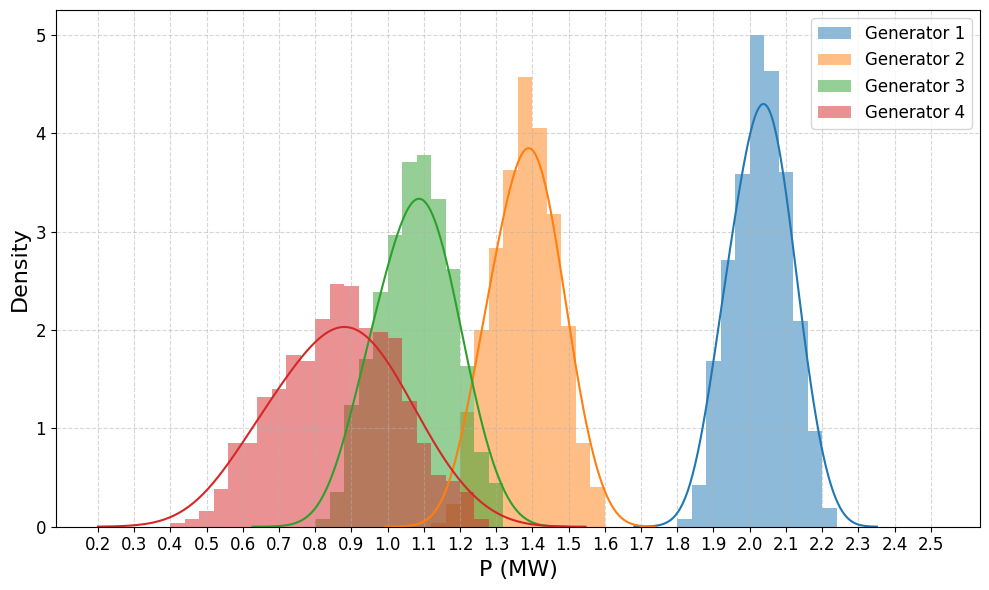

In [193]:
gen_df_aft = pd.DataFrame({
    f'gen{i+1}_p_mw': results_df_aft['sgen_p_mw'].apply(lambda x: x[i])
    for i in range(13)
})
plot_and_save_generator_distrib(gen_df_aft, 1)

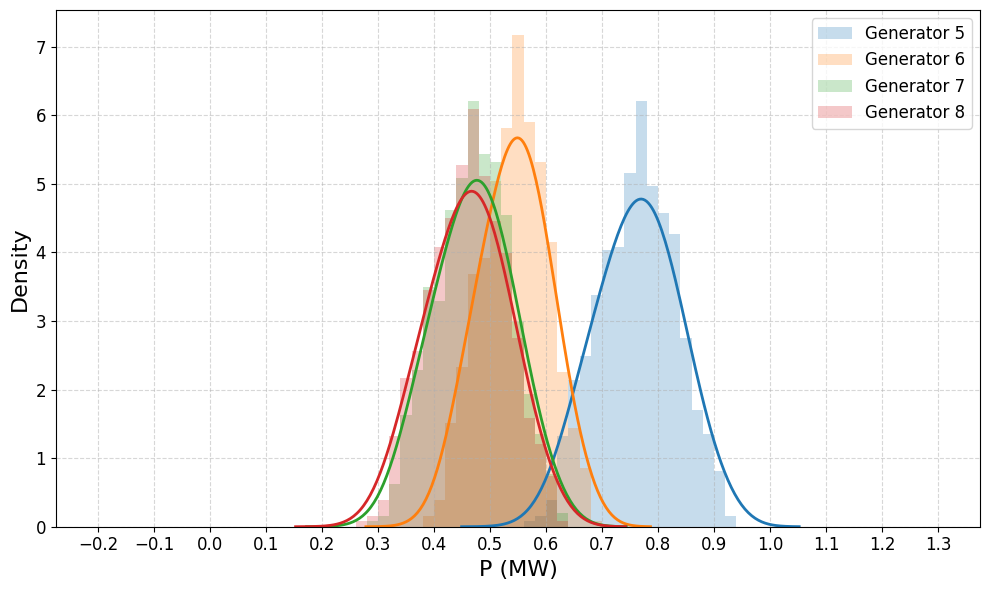

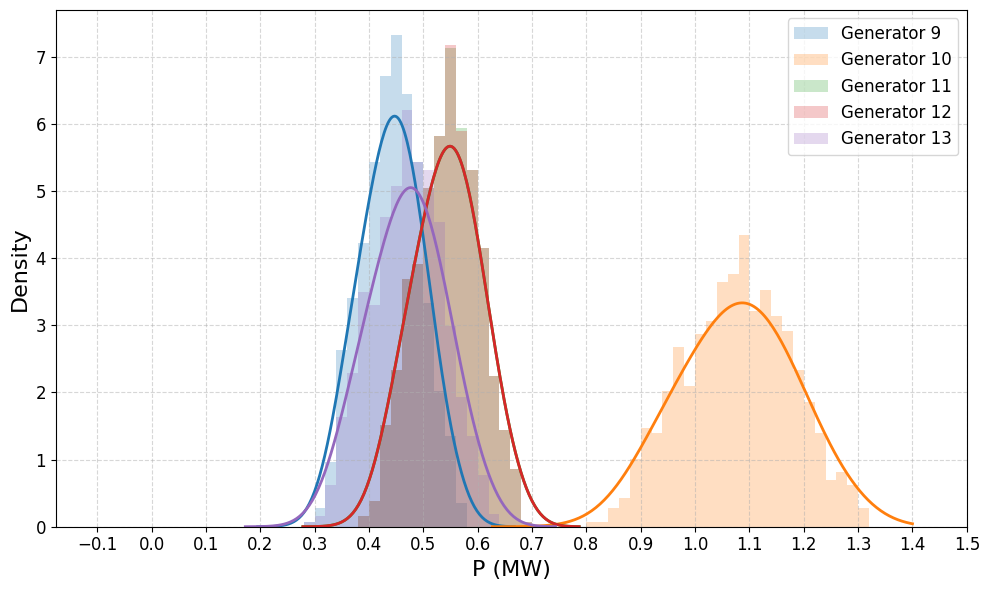

In [194]:
plot_and_save_generator_distrib_other(gen_df_aft, 1)

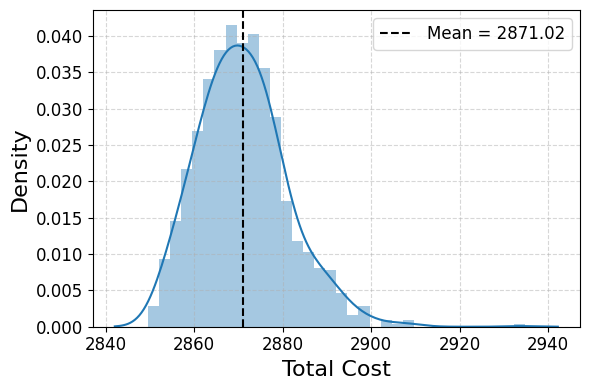

In [195]:
plot_cost_mc(results_df_aft, save = 1)

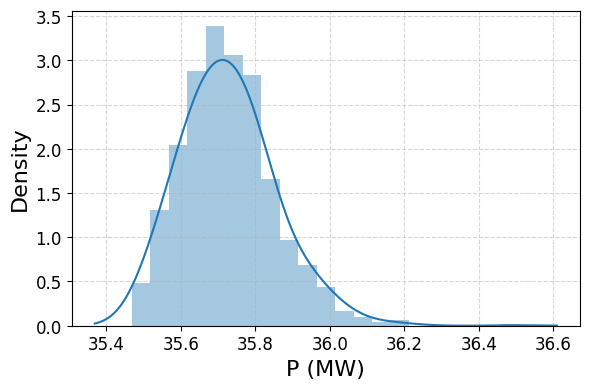

In [196]:
plot_ext_grid(results_df_aft, save = 1)

# Synthetic data (functions)

In [2]:
from sklearn.decomposition import PCA
from sklearn.neighbors import KernelDensity
import numpy as np
import matplotlib.pyplot as plt

def get_synt_pca(X3, n_comp, bw, n_samples):
    # === Step 1: Convert to log-space ===
    X3_log = np.log1p(X3)
    pca = PCA(n_components=n_comp)
    X3_pca = pca.fit_transform(X3_log)

    # === Step 2: Fit KDE and sample ===
    kde = KernelDensity(kernel='gaussian', bandwidth=bw).fit(X3_pca)
    synthetic_pca = kde.sample(n_samples)
    synthetic_log = pca.inverse_transform(synthetic_pca)
    synthetic3 = np.expm1(synthetic_log)  # inverse log1p

    # === Step 3: Clip to avoid negative values, convert to kWh ===
    synthetic3 = np.clip(synthetic3, 1e-3, None) * 0.25
    X3_kwh = X3 * 0.25  # real data also in kWh

    # === Step 4: Compare statistics ===
    print("Real mean (avg over all time):", X3_kwh.mean())
    print("Synthetic mean:", synthetic3.mean())
    print("Real std (avg over time):", X3_kwh.std())
    print("Synthetic std:", synthetic3.std())

    # === Step 5: Plot comparison ===
    plt.figure(figsize=(8, 4))
    idx_real = np.random.choice(len(X3_kwh), size=10, replace=False)
    idx_synth = np.random.choice(len(synthetic3), size=10, replace=False)
    
    for i_r, i_s in zip(idx_real, idx_synth):
        plt.plot(X3_kwh[i_r], color='blue', alpha=0.5, label='Real' if i_r == idx_real[0] else "")
        plt.plot(synthetic3[i_s], color='red', alpha=0.5, label='Synthetic' if i_s == idx_synth[0] else "")



    plt.title("Example Daily Load Profiles")
    plt.xlabel("Time of the day")
    plt.ylabel("Consumption (kWh)")
    plt.legend()
    
    time_labels = [f"{h:02d}:00" for h in range(24)]
    x_ticks = np.arange(0, 96, 4)
    plt.xticks(ticks=x_ticks, labels=time_labels, rotation=45)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    return synthetic3


In [3]:
def plot_sum_comparison(og,sy, N):
    # Choose 40 random indices
    random_real_idx = np.random.choice(len(og), size=N, replace=False)
    random_synth_idx = np.random.choice(len(sy), size=N, replace=False)
    
    # Compute the sum of those profiles
    sum_real = np.sum(og[random_real_idx], axis=0)
    sum_synthetic = np.sum(sy[random_synth_idx], axis=0)
    
    # Plot
    plt.figure(figsize=(8, 4))
    plt.plot(sum_real, color='blue', label='Real Sum')
    plt.plot(sum_synthetic, color='red', label='Synthetic Sum')

    time_labels = [f"{h:02d}:00" for h in range(24)]
    x_ticks = np.arange(0, 96, 4)

    plt.xticks(ticks=x_ticks, labels=time_labels, rotation=45, fontsize=12)
    #plt.title(f"Sum of {N} Random Daily Load Profiles")
    plt.xlabel("Time of the day", fontsize=16)
    plt.ylabel("Total Consumption (kWh)", fontsize=16)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.savefig(f"sum_comparison.png", dpi=300)
    plt.show()
    return

In [4]:
from scipy.ndimage import gaussian_filter1d
import numpy as np
import matplotlib.pyplot as plt

def summary_plot(real, synthetic, title="Real vs Synthetic Summary"):
    #time = np.linspace(0, 1, real.shape[1])
    time = np.arange(real.shape[1])  # e.g., 0 to 95
    real = real *0.25
  
    # Real stats
    real_mean = np.mean(real, axis=0)
    real_p10 = np.percentile(real, 10, axis=0)
    real_p90 = np.percentile(real, 90, axis=0)

    # Synthetic stats
    synth_mean = np.mean(synthetic, axis=0)
    synth_p10 = np.percentile(synthetic, 10, axis=0)
    synth_p90 = np.percentile(synthetic, 90, axis=0)

    # Smooth
    smooth = lambda arr: gaussian_filter1d(arr, sigma=1)

    plt.figure(figsize=(8, 4))
    plt.fill_between(time, smooth(real_p10), smooth(real_p90), alpha=0.2, label="Real 10–90%", color='blue')
    plt.plot(time, smooth(real_mean), color='blue', label="Real Mean")

    plt.fill_between(time, smooth(synth_p10), smooth(synth_p90), alpha=0.2, label="Synthetic 10–90%", color='red')
    plt.plot(time, smooth(synth_mean), color='red', label="Synthetic Mean")

    time_labels = [f"{h:02d}:00" for h in range(24)]
    x_ticks = np.arange(0, 96, 4)

    plt.xticks(ticks=x_ticks, labels=time_labels, rotation=45 , fontsize=12)
    #plt.title(title)
    plt.xlabel("Time of the day", fontsize=16)
    plt.ylabel("Consumption (kWh)", fontsize=16)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.savefig(f"summary_plot_low_week.png", dpi=300)
    plt.show()

In [5]:
from sklearn.decomposition import PCA
def plot_pca_proj(og, sy, n_comp):
    pca_vis = PCA(n_components=n_comp)
    all_data = np.vstack([og, sy])
    proj = pca_vis.fit_transform(all_data)
    split = len(og)
    
    plt.figure(figsize=(8, 6))
    plt.scatter(proj[:split, 0], proj[:split, 1], alpha=0.4, label='Real', s=10)
    plt.scatter(proj[split:, 0], proj[split:, 1], alpha=0.4, label='Synthetic', s=10)
    plt.title("Real vs Synthetic in PCA Projection")
    plt.xlabel("PCA 1")
    plt.ylabel("PCA 2")
    plt.legend()
    plt.grid(True)
    #plt.savefig(f"pca_proj.png", dpi=300)
    plt.show()
    return

In [6]:
def plot_density_at_fixed_t(og,sy):
    for t in range(0, og.shape[1], 24):  # every 24 steps (e.g., 6-hour intervals)
        plt.figure()
        plt.hist(og[:, t], bins=30, alpha=0.5, label='Real', density=True)
        plt.hist(sy[:, t], bins=30, alpha=0.5, label='Synthetic', density=True)
        plt.title(f"Time Step {t}")
        plt.xlabel("Consumption")
        plt.ylabel("Density")
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.4)
        #plt.savefig(f"density_fixed_t_comparison_{t}.png", dpi=300)
        plt.show()
    return

# Add weekend/workday split x group

## low - week

In [255]:
data = df.copy()

In [256]:
grouped_0 = data[data['consumption_group'] == 0]

In [257]:
# Weekday names
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

# Festive dates (day, month)
festive_days = {
    (1, 1), (6, 1), (25, 3), (28, 3), (25, 4), (1, 5),
    (8, 5), (5, 7), (29, 8), (1, 9), (15, 9),
    (1, 11), (17, 11), (24, 12), (25, 12), (26, 12)
}

# Identify rows
is_weekday_name = grouped_0['weekday'].isin(weekdays)
is_festive = grouped_0[['day', 'month']].apply(tuple, axis=1).isin(festive_days)
is_weekend = grouped_0['weekday'].isin(['Saturday', 'Sunday'])

# Final logic:
g0_week = grouped_0[is_weekday_name & ~is_festive].copy()
g0_end = grouped_0[~(is_weekday_name & ~is_festive)].copy()


Real mean (avg over all time): 0.13306300722963096
Synthetic mean: 0.12958460986746984
Real std (avg over time): 0.14085173240234397
Synthetic std: 0.1261398588279561


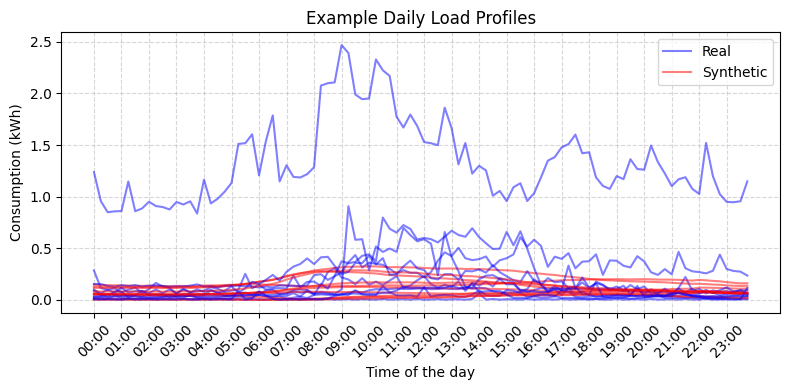

In [259]:
from sklearn.decomposition import PCA
from sklearn.neighbors import KernelDensity

X_g0_week = np.vstack(g0_week['consumption'].values)
n_samples = 5000
synt_g0_week = get_synt_pca(X_g0_week, 3, 0.3,n_samples)

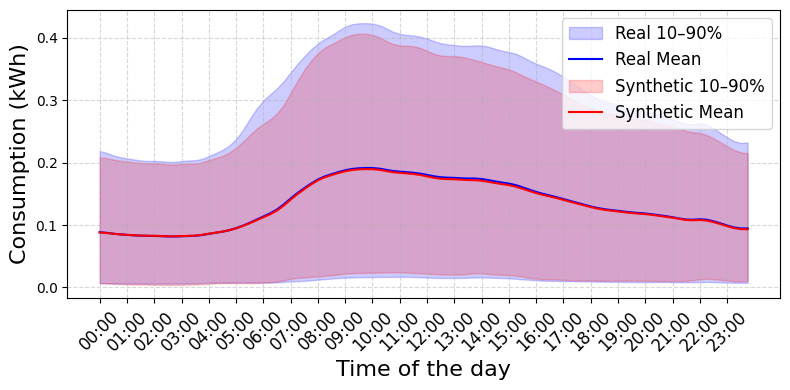

In [165]:
summary_plot(X_g0_week, synt_g0_week)

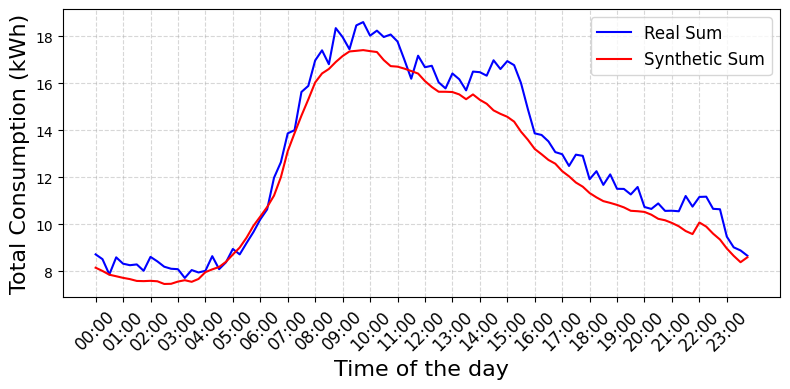

In [142]:
N = 100
plot_sum_comparison(X_g0_week*0.25,synt_g0_week, N)

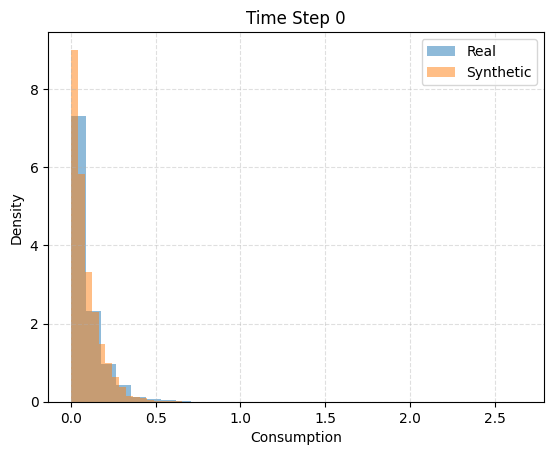

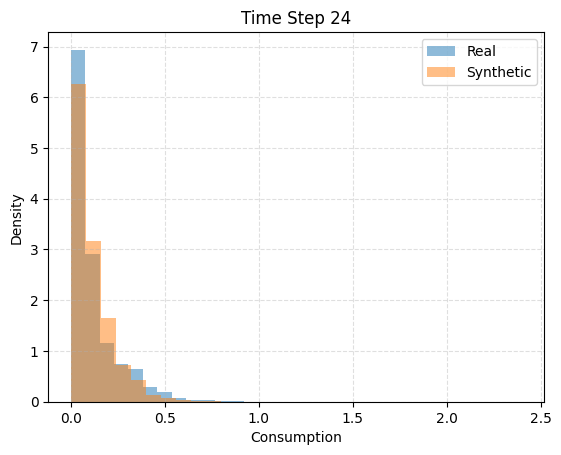

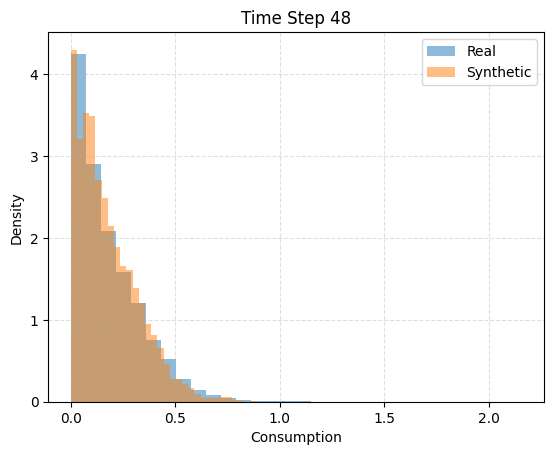

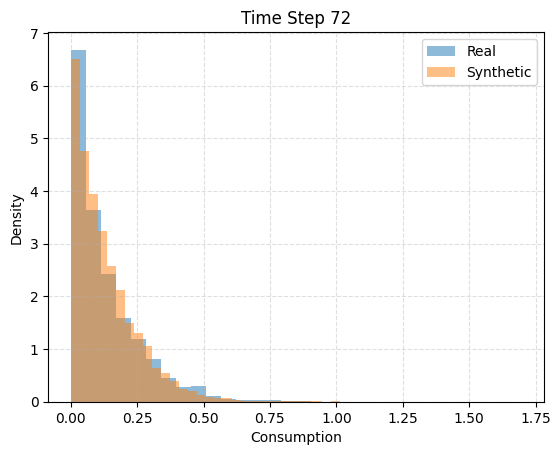

In [278]:
plot_density_at_fixed_t(X_g0_week*0.25,synt_g0_week)

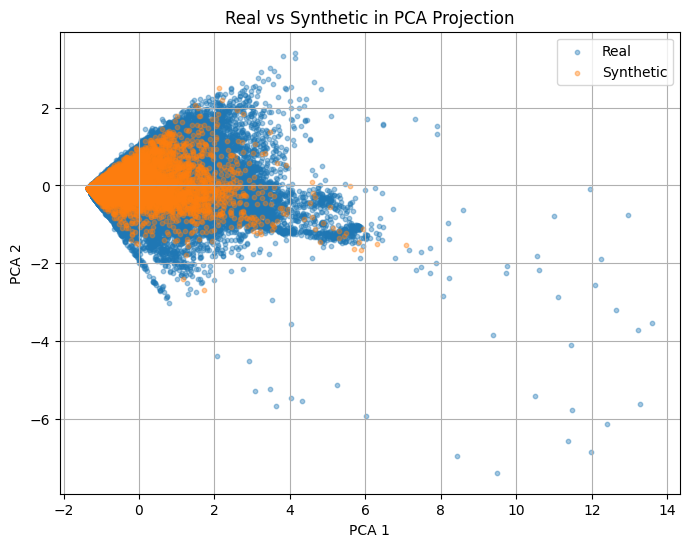

In [279]:
n_comp = 2
plot_pca_proj(X_g0_week*0.25, synt_g0_week, n_comp)

## low - end

Real mean (avg over all time): 0.1036146329798888
Synthetic mean: 0.10196961931057205
Real std (avg over time): 0.12179344963957525
Synthetic std: 0.1096631194911404


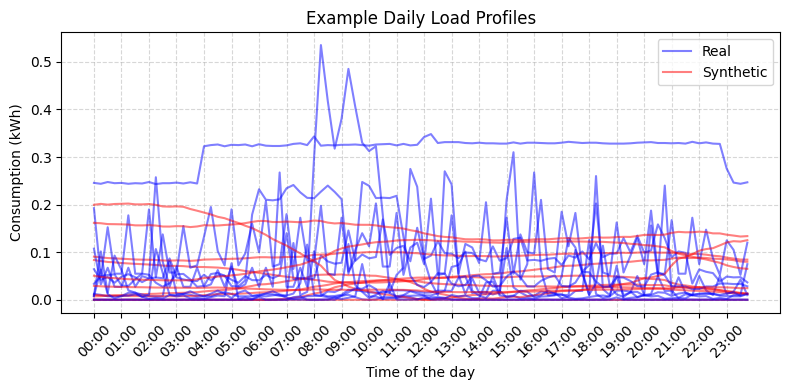

In [260]:
X_g0_end = np.vstack(g0_end['consumption'].values)
n_samples = 5000
synt_g0_end = get_synt_pca(X_g0_end, 3, 0.3,n_samples)

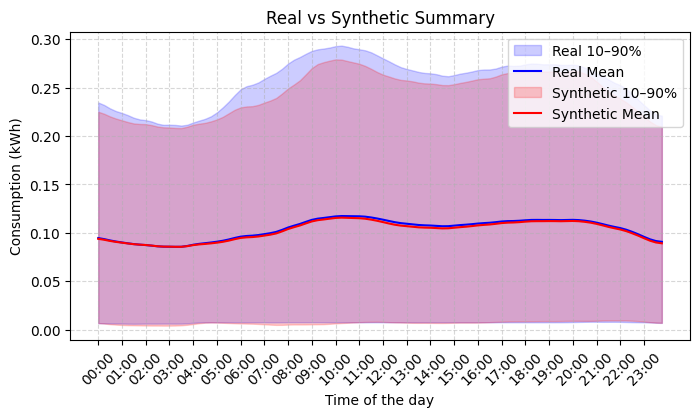

In [283]:
summary_plot(X_g0_end, synt_g0_end)

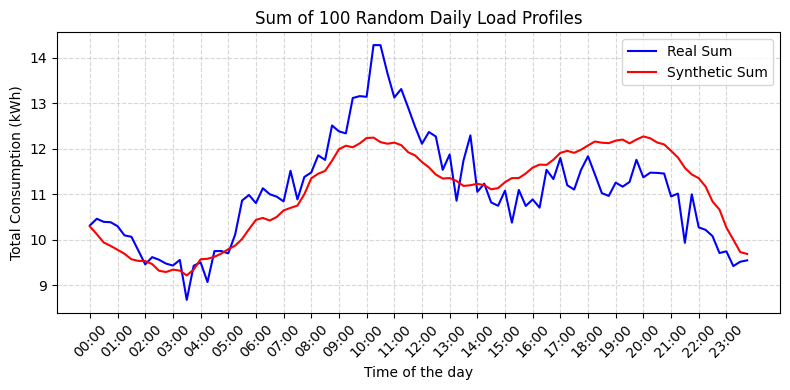

In [288]:
N = 100
plot_sum_comparison(X_g0_end*0.25,synt_g0_end, N)

## medium - week

In [261]:
grouped_1 = data[data['consumption_group'] == 1]

In [262]:
# Separate different kind of days
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

# Identify rows
is_weekday_name = grouped_1['weekday'].isin(weekdays)
is_festive = grouped_1[['day', 'month']].apply(tuple, axis=1).isin(festive_days)
is_weekend = grouped_1['weekday'].isin(['Saturday', 'Sunday'])

# Final logic:
g1_week = grouped_1[is_weekday_name & ~is_festive].copy()
g1_end = grouped_1[~(is_weekday_name & ~is_festive)].copy()

Real mean (avg over all time): 0.37383280049102924
Synthetic mean: 0.3665307205053052
Real std (avg over time): 0.3142180282317306
Synthetic std: 0.2832197447275472


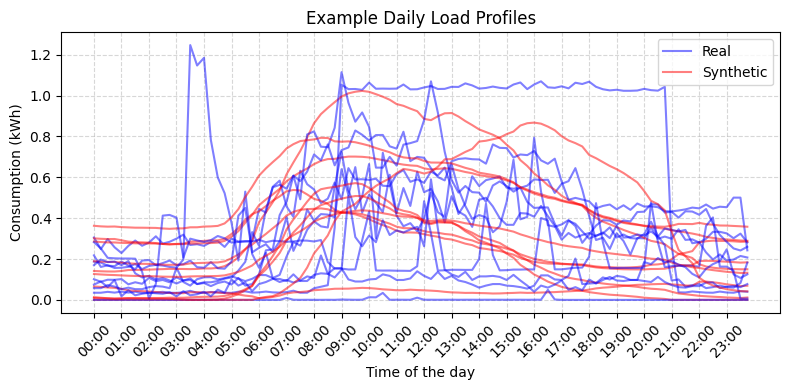

In [263]:
X_g1_week = np.vstack(g1_week['consumption'].values)
n_samples = 5000
synt_g1_week = get_synt_pca(X_g1_week, 3, 0.3,n_samples)

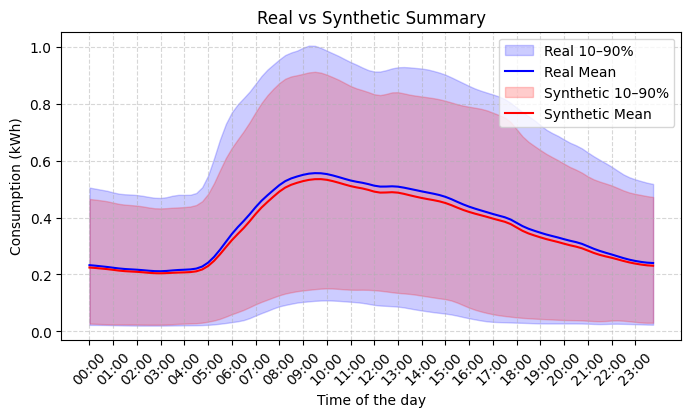

In [292]:
summary_plot(X_g1_week, synt_g1_week)

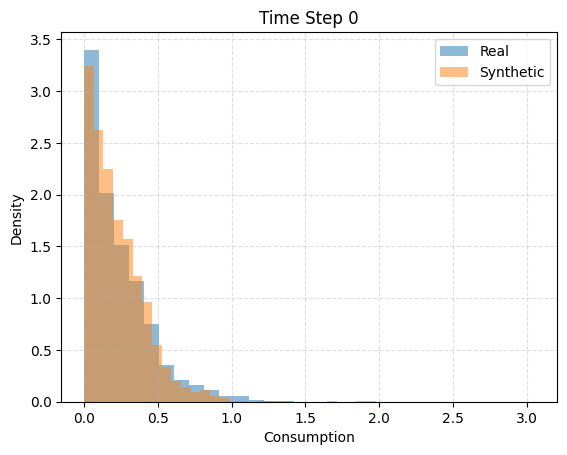

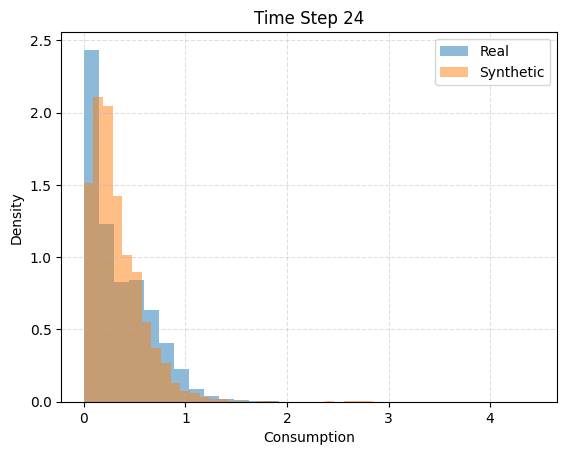

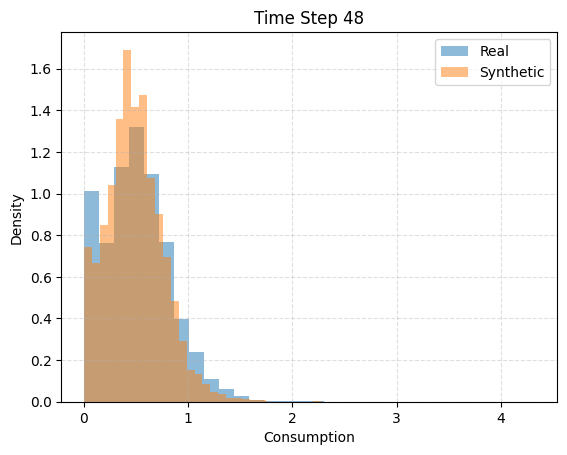

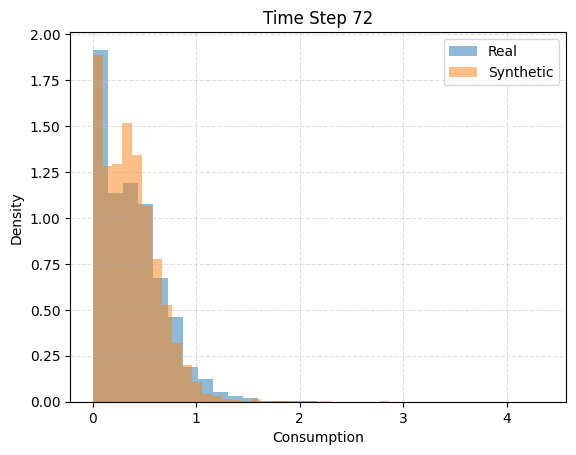

In [293]:
plot_density_at_fixed_t(X_g1_week*0.25,synt_g1_week)

## medium- end

Real mean (avg over all time): 0.27570304352778663
Synthetic mean: 0.26836352036343936
Real std (avg over time): 0.26241668167061794
Synthetic std: 0.23848247050984067


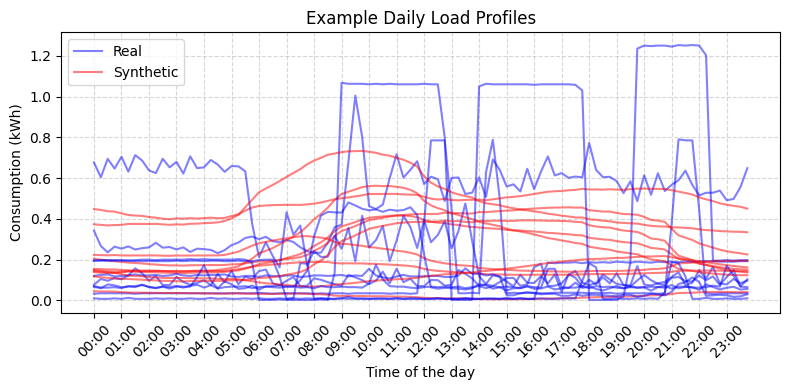

In [264]:
X_g1_end = np.vstack(g1_end['consumption'].values)
n_samples = 5000
synt_g1_end = get_synt_pca(X_g1_end, 3, 0.3,n_samples)

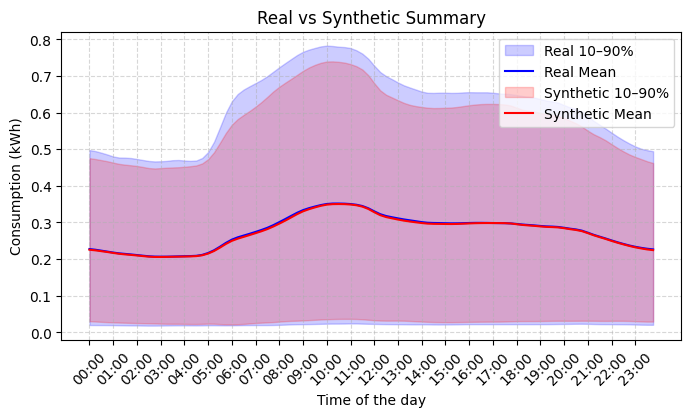

In [295]:
summary_plot(X_g1_end, synt_g1_end)

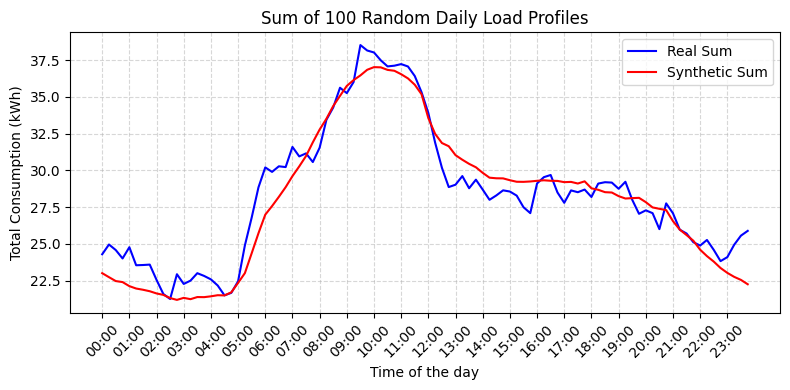

In [250]:
N = 100
plot_sum_comparison(X_g1_end*0.25,synt_g1_end, N)

## high - week

In [265]:
grouped_2 = data[data['consumption_group'] == 2]

In [266]:
# Separate different kind of days
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

# Identify rows
is_weekday_name = grouped_2['weekday'].isin(weekdays)
is_festive = grouped_2[['day', 'month']].apply(tuple, axis=1).isin(festive_days)
is_weekend = grouped_2['weekday'].isin(['Saturday', 'Sunday'])

# Final logic:
g2_week = grouped_2[is_weekday_name & ~is_festive].copy()
g2_end = grouped_2[~(is_weekday_name & ~is_festive)].copy()

Real mean (avg over all time): 0.7184282110892108
Synthetic mean: 0.6958264344793714
Real std (avg over time): 0.5984003623077737
Synthetic std: 0.5468157512424248


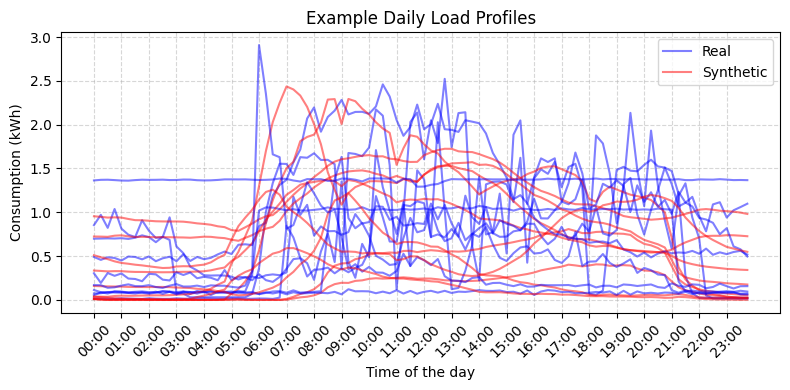

In [267]:
X_g2_week = np.vstack(g2_week['consumption'].values)
n_samples = 5000
synt_g2_week = get_synt_pca(X_g2_week, 4, 0.3,n_samples)

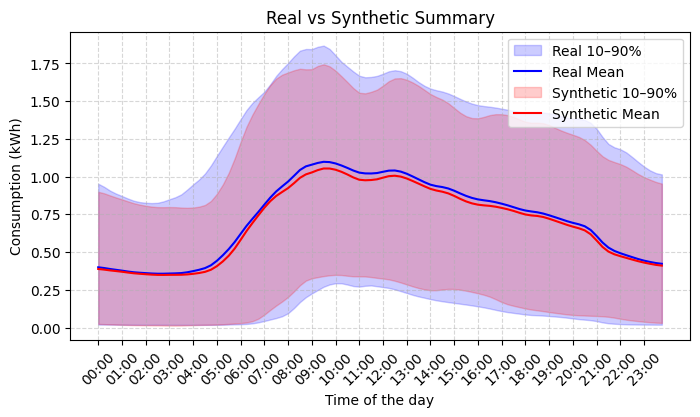

In [202]:
summary_plot(X_g2_week, synt_g2_week)

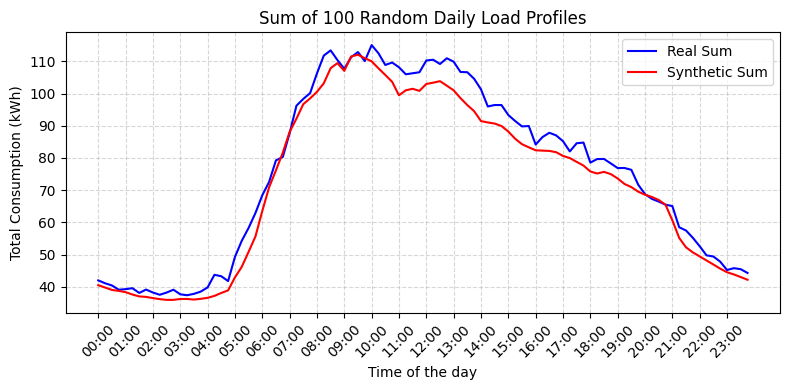

In [257]:
N = 100
plot_sum_comparison(X_g2_week*0.25,synt_g2_week, N)

## high - end

Real mean (avg over all time): 0.5255684186768954
Synthetic mean: 0.504536751298876
Real std (avg over time): 0.48008596020645783
Synthetic std: 0.4310971186628615


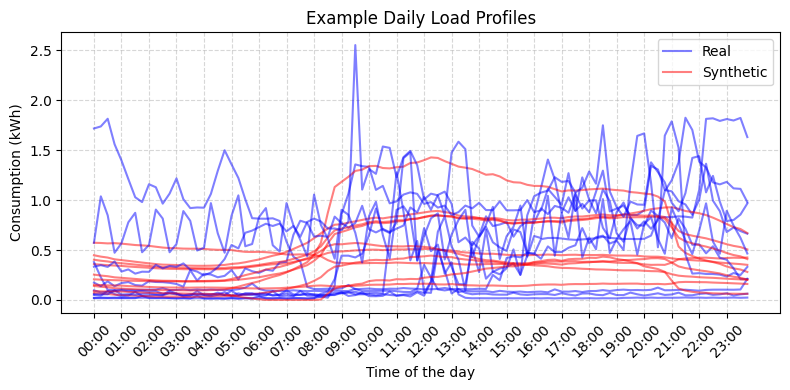

In [268]:
X_g2_end = np.vstack(g2_end['consumption'].values)
n_samples = 5000
synt_g2_end = get_synt_pca(X_g2_end, 4, 0.3,n_samples)

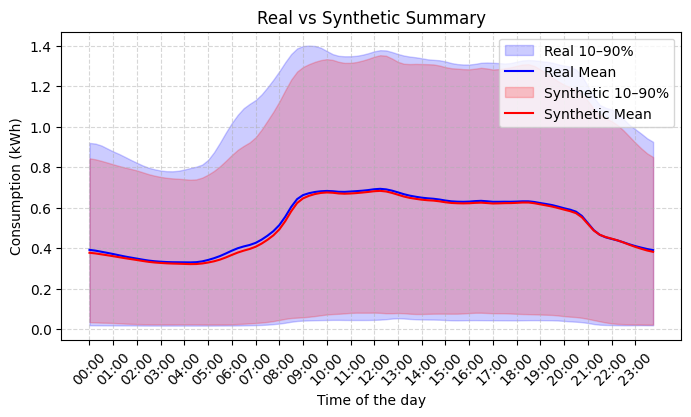

In [259]:
summary_plot(X_g2_end, synt_g2_end)

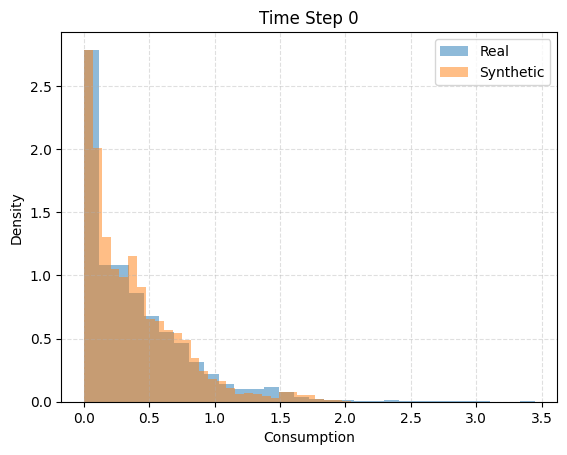

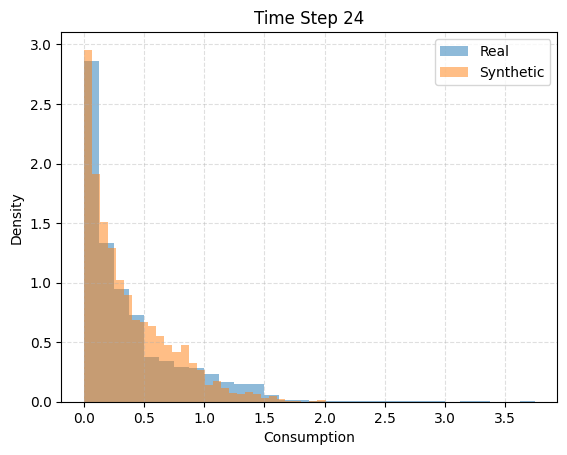

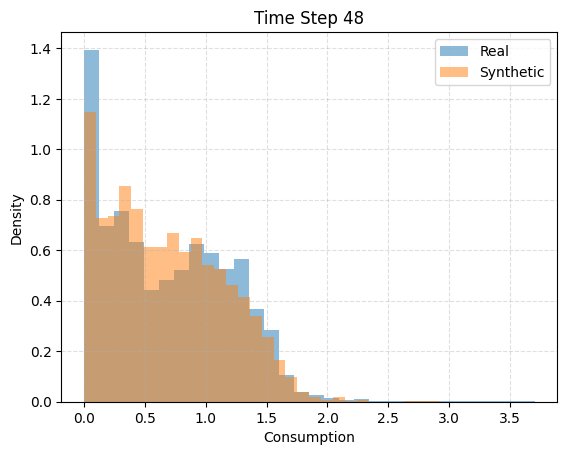

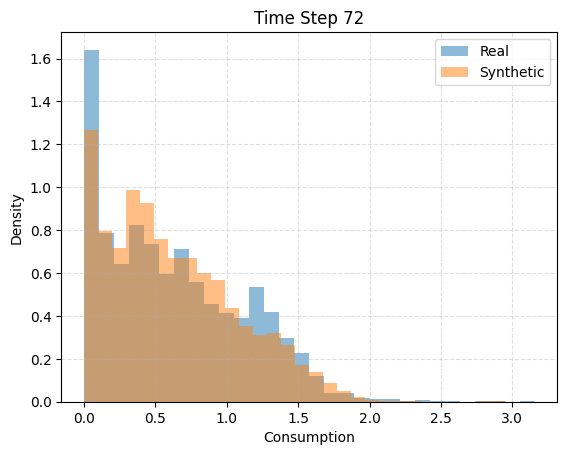

In [260]:
plot_density_at_fixed_t(X_g2_end*0.25,synt_g2_end)

# OPF SYNTHETIC KDE (not useful in term of results, copula will be the method used) --> can be skipped

## Preparation and functions

In [178]:
#df = pd.read_json("df_ultimate.json", orient="records")

In [253]:
def get_synt_noplot(X3, n_comp, bw, n_samples):
    # === Step 1: Convert to log-space ===
    X3_log = np.log1p(X3)
    pca = PCA(n_components=n_comp)
    X3_pca = pca.fit_transform(X3_log)

    # === Step 2: Fit KDE and sample ===
    kde = KernelDensity(kernel='gaussian', bandwidth=bw).fit(X3_pca)
    synthetic_pca = kde.sample(n_samples)
    synthetic_log = pca.inverse_transform(synthetic_pca)
    synthetic3 = np.expm1(synthetic_log)  # inverse log1p

    # === Step 3: Clip to avoid negative values ===
    synthetic3 = np.clip(synthetic3, 1e-3, None)
    X3_kwh = X3  # real data THIS TIME NOT in kWh


    return synthetic3

In [254]:
def is_weekday(random_date):
    # Extract day of week and date parts
    weekday_name = random_date.strftime('%A')  # e.g. 'Monday'
    day = random_date.day
    month = random_date.month
    
    # Check conditions
    is_weekend = weekday_name in ['Saturday', 'Sunday']
    is_festive = (day, month) in festive_days
    is_weekday = not is_festive and not is_weekend

    return is_weekday

In [155]:
# Suppose you want N synthetic load profiles per case (e.g. 10,000)
N_SYNTHETIC = 10000

# For each scenario (weekday/weekend), for each group
synthetic_profiles = {
    'weekday': {
        'low': get_synt_noplot(X_g0_week, 4, 0.5, N_SYNTHETIC),
        'med': get_synt_noplot(X_g1_week, 4, 0.5, N_SYNTHETIC),
        'high': get_synt_noplot(X_g2_week, 4, 0.5, N_SYNTHETIC),
    },
    'weekend': {
        'low': get_synt_noplot(X_g0_end, 4, 0.5, N_SYNTHETIC),
        'med': get_synt_noplot(X_g1_end, 4, 0.5, N_SYNTHETIC),
        'high': get_synt_noplot(X_g2_end, 4, 0.5, N_SYNTHETIC),
    }
}


In [156]:
rng = np.random.default_rng(seed=42)  # set a seed if you want reproducibility

def sample_consume_joint_fast(l, m, h, t, chosen_date, synthetic_profiles, rng):
    # Select scenario
    if is_weekday(chosen_date):
        group = synthetic_profiles['weekday']
    else:
        group = synthetic_profiles['weekend']
    
    # Sample a single profile from each group (correlated across all users if desired)
    idx_L = rng.integers(0, group['low'].shape[0])
    idx_M = rng.integers(0, group['med'].shape[0])
    idx_H = rng.integers(0, group['high'].shape[0])

    val_L = group['low'][idx_L, t]  # unit: whatever original (W or kW)
    val_M = group['med'][idx_M, t]
    val_H = group['high'][idx_H, t]

    # Scale by number of users and convert to MW (if data is in W)
    total = (l * val_L + m * val_M + h * val_H) / 1000  # If input is W: /1000 → kW
    return total


In [157]:
def sample_loads_fast(chosen_date, t, synthetic_profiles, rng):
    loads = []
    loads.append(sample_consume_joint_fast(120, 60, 20, t, chosen_date, synthetic_profiles, rng))
    loads.append(sample_consume_joint_fast(180, 90, 30, t, chosen_date, synthetic_profiles, rng))
    loads.append(sample_consume_joint_fast(312,156, 52, t, chosen_date, synthetic_profiles, rng))
    loads.append(sample_consume_joint_fast(240,120, 40, t, chosen_date, synthetic_profiles, rng))
    loads.append(sample_consume_joint_fast(252,126, 42, t, chosen_date, synthetic_profiles, rng))
    loads.append(sample_consume_joint_fast(204, 102, 34, t, chosen_date, synthetic_profiles, rng))
    loads.append(sample_consume_joint_fast(144, 72, 24, t, chosen_date, synthetic_profiles, rng))
    loads.append(sample_consume_joint_fast(96, 96, 18, t, chosen_date, synthetic_profiles, rng))
    return [l * 1.22 for l in loads]


## MC Cycle

In [158]:
net = pn.create_cigre_network_mv(with_der="all")
net.sgen['controllable'] = True  # Imposta tutti i generatori come controllabili
# Constraints
width_factor = 2  # try 1.0 first, then tighten
net.sgen['min_p_mw'] = means_array - width_factor * stds_array
net.sgen['max_p_mw'] = means_array + width_factor * stds_array

net.sgen['min_q_mvar'] = -40  # Example reactive power limits (adjust as needed)
net.sgen['max_q_mvar'] = 40   # Example reactive power limits (adjust as needed)

net.ext_grid['min_p_mw'] = 0
net.ext_grid['max_p_mw'] = 60

net.bus["min_vm_pu"] = 0.95
net.bus["max_vm_pu"] = 1.05

net.trafo["max_loading_percent"] = 95
net.line["max_loading_percent"] = 95

# EXT GRID CON VALORI VERI DI MERCATO
cp2_ext = 0.01  # o un valore molto piccolo, es: 0.001

for idx in net.ext_grid.index:
    pp.create_poly_cost(net, element=idx, et="ext_grid",
                        cp1_eur_per_mw=80,     # prezzo medio di mercato €/MWh
                        cp2_eur_per_mw2=cp2_ext,
                        cp0_eur=0)

# SGEN CON COST FUNCTION SOLO PER OTTIMIZZARE
cp2_min = 1
cp2_max = 3
std_min = stds_array.min()
std_max = stds_array.max()

# Linear scaling: std_min → cp2_min, std_max → cp2_max
cp2_sgen_array = cp2_min + (cp2_max - cp2_min) * (stds_array - std_min) / (std_max - std_min)


for i, idx in enumerate(net.sgen.index):
    mean_val = means_array[i]
    pp.create_poly_cost(net, element=idx, et="sgen",
                        cp1_eur_per_mw=-2 * cp2_sgen_array[i] * mean_val,     # makes min at mean
                        cp2_eur_per_mw2=cp2_sgen_array[i],
                        cp0_eur=cp2_sgen_array[i] * mean_val**2)

In [159]:
# Parametri Monte Carlo
from scipy.stats import gaussian_kde
n_iterations = 650 # DEVE ESSERE MULTIPLO DI 13  

total_costs = []
results = []
results_weighted = []
start_time = time.time()

household_indices = [1, 2, 3, 4, 5, 6, 7, 9]  # Indices of household-like loads

# 25-38 per le 6-9 AM
# 45-58 per le 11-14 PM
# 77- 90 per le 19-22 PM
# Esegui il ciclo Monte Carlo
with tqdm(total=n_iterations, desc="Esecuzione Monte Carlo", unit="iter") as pbar:
    for k in range(25,38): # time stamps dalle 6 alle 9 di mattina (LO FISSO)
        for iteration in range(n_iterations//13):  
            try:
    
                random_date = df['date'].sample(n=1).iloc[0]
                #sampled_p = sample_loads(random_date,k)
                sampled_p = sample_loads_fast(random_date, k, synthetic_profiles, rng)
                #print(sampled_p)
                
                # Update network loads
                net.load.loc[household_indices, 'p_mw'] = sampled_p
    
    
                # Run OPF
                pp.runopp(net, init = 'pf') #, verbose=True, enforce_q_lims=True
    
                # Save results
                results = save_results_loads(net, results)
    
                # Update progress bar
                pbar.update(1)
    
            except Exception as e:
                print(f"Errore nell'iterazione {iteration}: {e}")


# Calcola il tempo totale
total_time = time.time() - start_time
minutes = int(total_time // 60)
seconds = int(total_time % 60)
print(f"Tempo totale per {n_iterations} iterazioni di Monte Carlo: {minutes} minuti e {seconds} secondi.")

Esecuzione Monte Carlo:   8%|████▍                                                  | 53/650 [00:35<06:01,  1.65iter/s]

Errore nell'iterazione 3: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  47%|█████████████████████████▎                            | 305/650 [03:29<04:13,  1.36iter/s]

Errore nell'iterazione 6: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  91%|█████████████████████████████████████████████████     | 591/650 [06:55<00:41,  1.42iter/s]

Errore nell'iterazione 43: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  94%|██████████████████████████████████████████████████▊   | 612/650 [07:10<00:25,  1.50iter/s]

Errore nell'iterazione 15: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  99%|█████████████████████████████████████████████████████▋| 646/650 [07:34<00:02,  1.42iter/s]

Tempo totale per 650 iterazioni di Monte Carlo: 7 minuti e 34 secondi.


In [160]:
results_df_synt = pd.DataFrame(results)

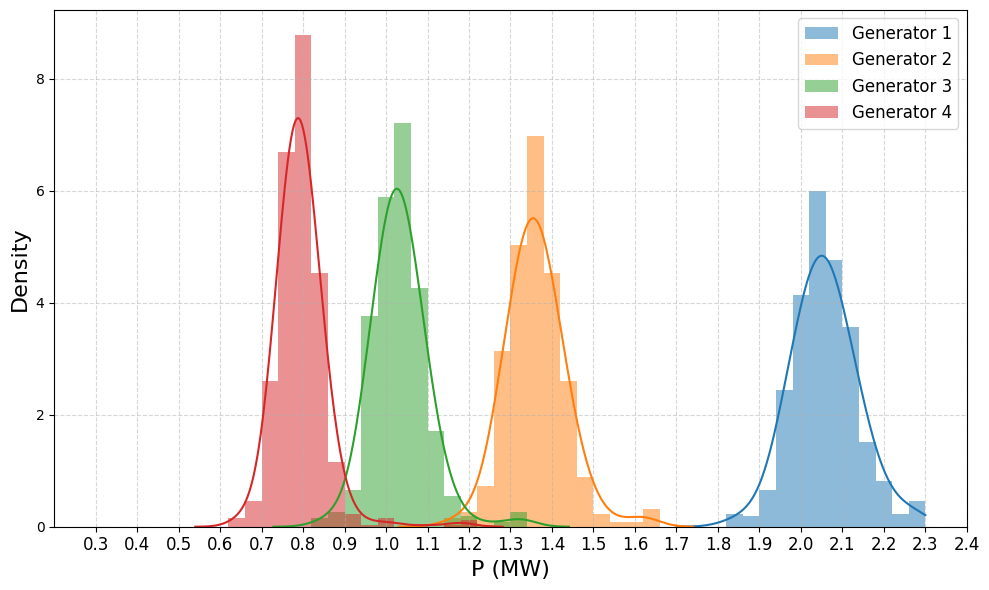

In [161]:
results_df_synt = pd.DataFrame(results)
gen_df_synt = pd.DataFrame({
    f'gen{i+1}_p_mw': results_df_synt['sgen_p_mw'].apply(lambda x: x[i])
    for i in range(13)
})
plot_and_save_generator_distrib(gen_df_synt, 0)

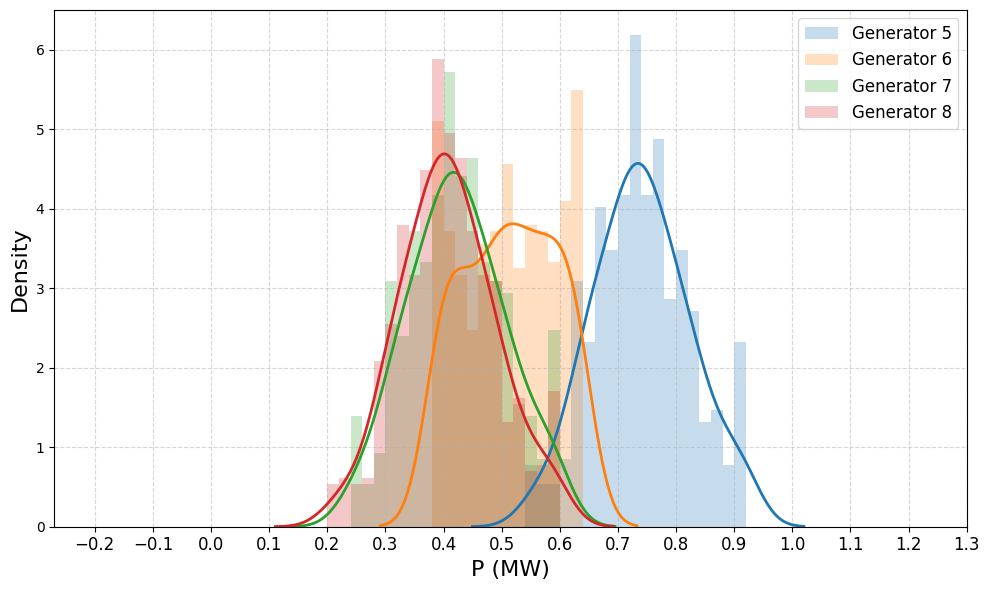

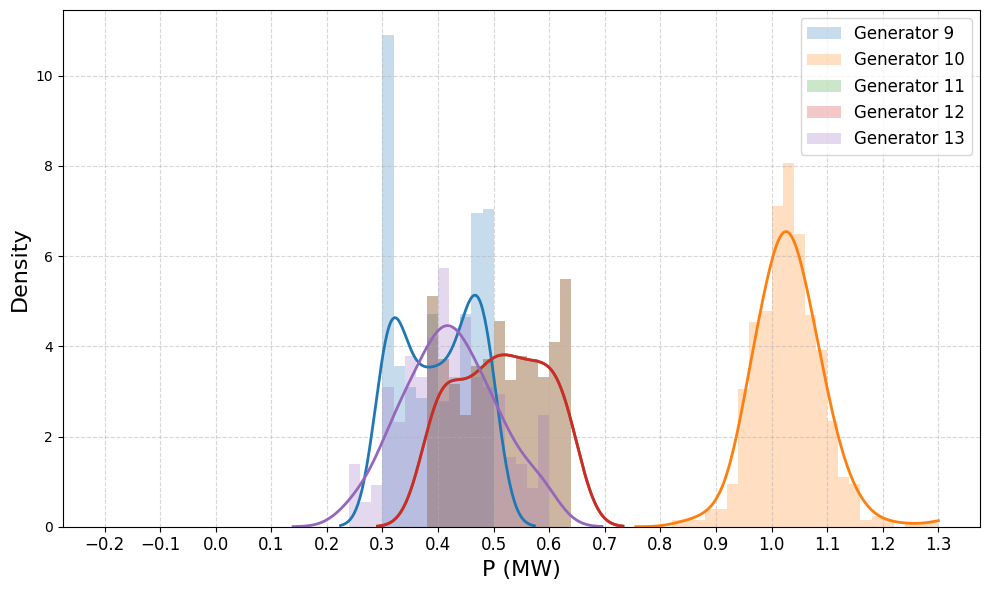

In [162]:
plot_and_save_generator_distrib_other(gen_df_synt, 0)

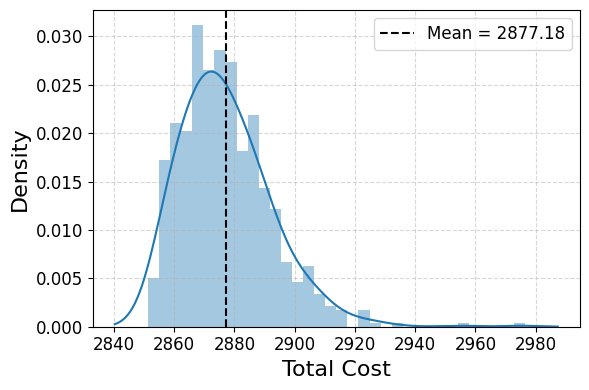

In [163]:
plot_cost_mc(results_df_synt, save = 0)

# Add hot/cold split and visualize with plots (for pure data preparation (i.e. to avoid all plots) just run the next section instead)

## low- hot/cold

In [204]:
data = df.copy()

In [269]:
grouped_0 = data[data['consumption_group'] == 0]

In [270]:
# Weekday names
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

# Festive dates (day, month)
festive_days = {
    (1, 1), (6, 1), (25, 3), (28, 3), (25, 4), (1, 5),
    (8, 5), (5, 7), (29, 8), (1, 9), (15, 9),
    (1, 11), (17, 11), (24, 12), (25, 12), (26, 12)
}

# Identify rows
is_weekday_name = grouped_0['weekday'].isin(weekdays)
is_festive = grouped_0[['day', 'month']].apply(tuple, axis=1).isin(festive_days)
is_weekend = grouped_0['weekday'].isin(['Saturday', 'Sunday'])

# Final logic:
g0_week = grouped_0[is_weekday_name & ~is_festive].copy()
g0_end = grouped_0[~(is_weekday_name & ~is_festive)].copy()

g0_week_hot = g0_week[(g0_week['season'] == 'Spring') | (g0_week['season'] == 'Summer')]
g0_week_cold = g0_week[(g0_week['season'] == 'Autumn') | (g0_week['season'] == 'Winter')]

g0_end_hot = g0_end[(g0_end['season'] == 'Spring') | (g0_end['season'] == 'Summer')]
g0_end_cold = g0_end[(g0_end['season'] == 'Autumn') | (g0_end['season'] == 'Winter')]

Real mean (avg over all time): 0.12330158083465455
Synthetic mean: 0.1238587963098038
Real std (avg over time): 0.1350013571011328
Synthetic std: 0.12930203855973682


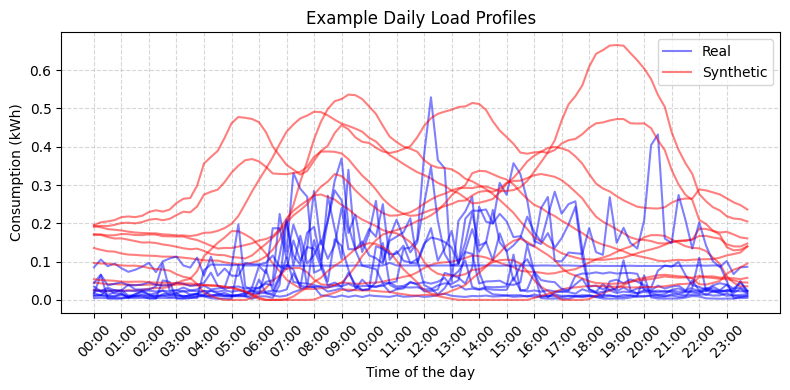

In [271]:
from sklearn.decomposition import PCA
from sklearn.neighbors import KernelDensity

X_g0_week_hot = np.vstack(g0_week_hot['consumption'].values)
n_samples = 5000
synt_g0_week_hot = get_synt_pca(X_g0_week_hot, 10, 0.3,n_samples)

Real mean (avg over all time): 0.14325263248460637
Synthetic mean: 0.14554926160481477
Real std (avg over time): 0.1460155966008688
Synthetic std: 0.14724014796058227


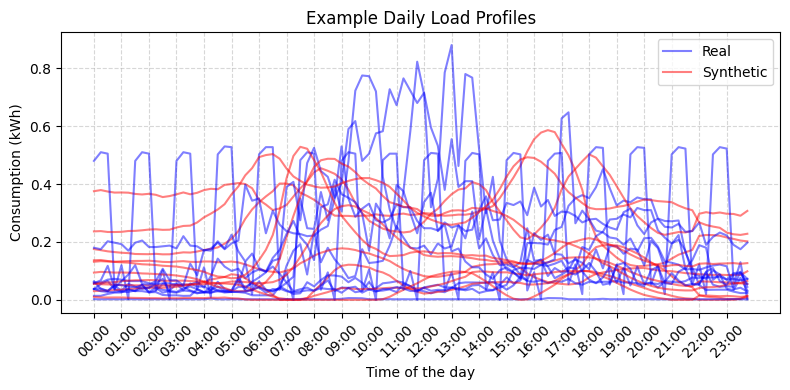

In [272]:
X_g0_week_cold = np.vstack(g0_week_cold['consumption'].values)
n_samples = 5000
synt_g0_week_cold = get_synt_pca(X_g0_week_cold, 10, 0.3,n_samples)

Real mean (avg over all time): 0.09848061223102621
Synthetic mean: 0.10090551019308334
Real std (avg over time): 0.11981228108744744
Synthetic std: 0.12038506738326246


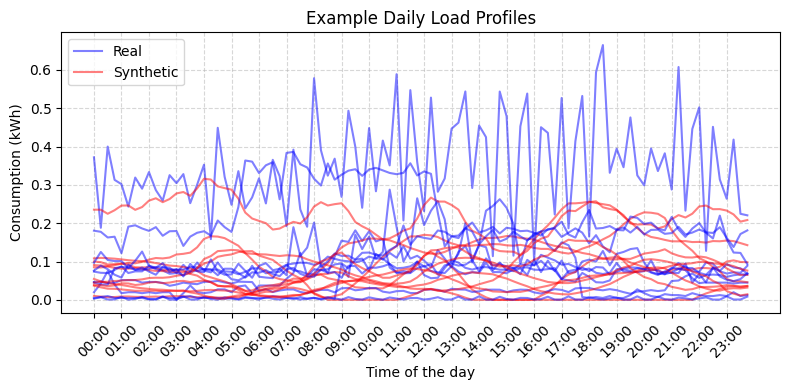

In [273]:
X_g0_end_hot = np.vstack(g0_end_hot['consumption'].values)
n_samples = 5000
synt_g0_end_hot = get_synt_pca(X_g0_end_hot, 10, 0.3,n_samples)

Real mean (avg over all time): 0.10903964829695081
Synthetic mean: 0.11134689598198454
Real std (avg over time): 0.12362100752353763
Synthetic std: 0.12010157715815618


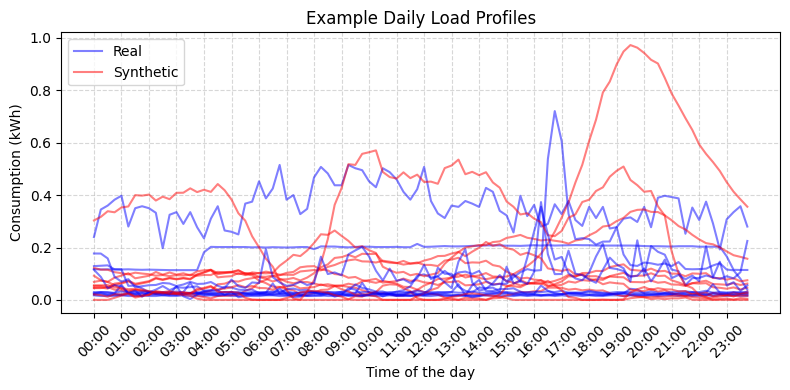

In [274]:
X_g0_end_cold = np.vstack(g0_end_cold['consumption'].values)
n_samples = 5000
synt_g0_end_cold = get_synt_pca(X_g0_end_cold, 10, 0.3,n_samples)

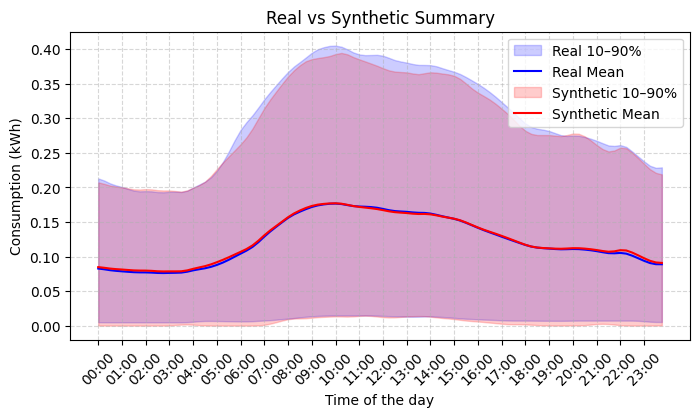

In [637]:
summary_plot(X_g0_week_hot, synt_g0_week_hot)

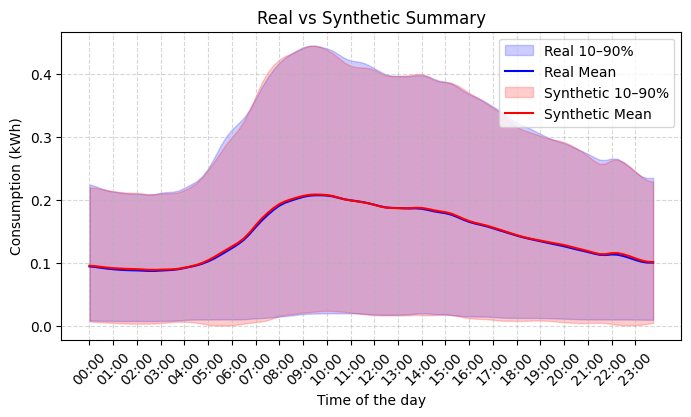

In [636]:
summary_plot(X_g0_week_cold, synt_g0_week_cold)

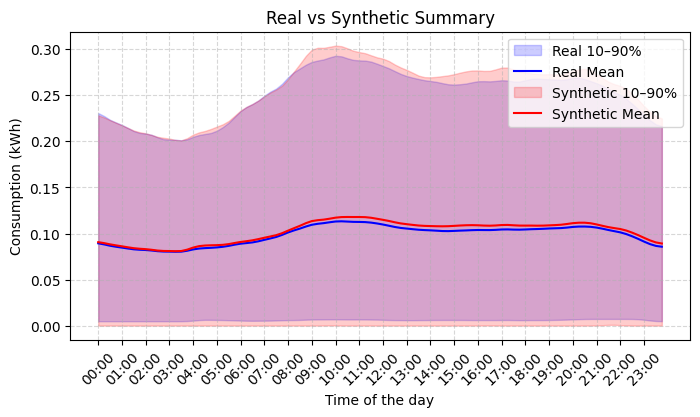

In [49]:
summary_plot(X_g0_end_hot, synt_g0_end_hot)

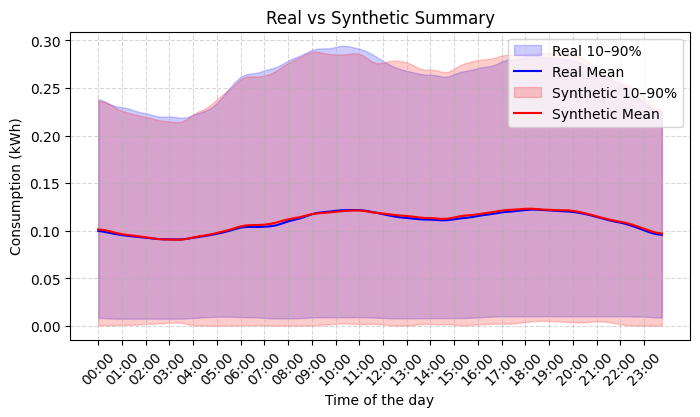

In [50]:
summary_plot(X_g0_end_cold, synt_g0_end_cold)

## med- hot/cold

In [275]:
grouped_1 = data[data['consumption_group'] == 1]

# Identify rows
is_weekday_name = grouped_1['weekday'].isin(weekdays)
is_festive = grouped_1[['day', 'month']].apply(tuple, axis=1).isin(festive_days)
is_weekend = grouped_1['weekday'].isin(['Saturday', 'Sunday'])

# Final logic:
g1_week = grouped_1[is_weekday_name & ~is_festive].copy()
g1_end = grouped_1[~(is_weekday_name & ~is_festive)].copy()

g1_week_hot = g1_week[(g1_week['season'] == 'Spring') | (g1_week['season'] == 'Summer')]
g1_week_cold = g1_week[(g1_week['season'] == 'Autumn') | (g1_week['season'] == 'Winter')]

g1_end_hot = g1_end[(g1_end['season'] == 'Spring') | (g1_end['season'] == 'Summer')]
g1_end_cold = g1_end[(g1_end['season'] == 'Autumn') | (g1_end['season'] == 'Winter')]

Real mean (avg over all time): 0.3640767996215956
Synthetic mean: 0.3594157848933595
Real std (avg over time): 0.3076902756817272
Synthetic std: 0.29671965737836803


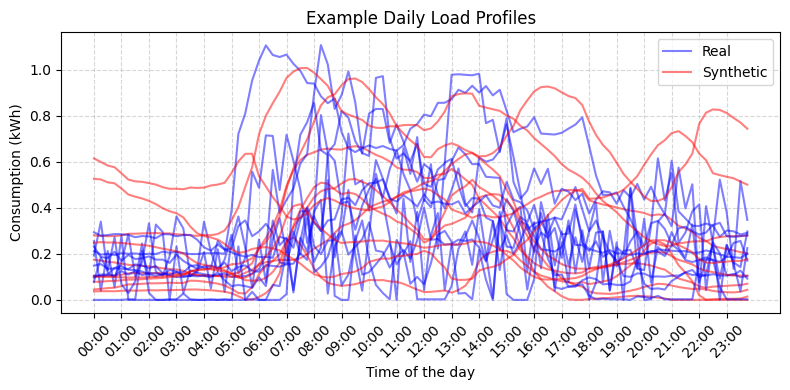

In [276]:
X_g1_week_hot = np.vstack(g1_week_hot['consumption'].values)
n_samples = 5000
synt_g1_week_hot = get_synt_pca(X_g1_week_hot, 10, 0.3,n_samples)

Real mean (avg over all time): 0.3840178634124374
Synthetic mean: 0.38190121300042273
Real std (avg over time): 0.32057459808510375
Synthetic std: 0.31003383183451977


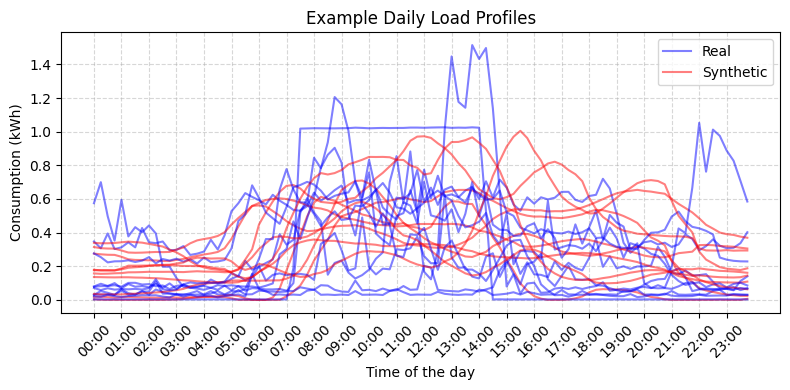

In [277]:
X_g1_week_cold = np.vstack(g1_week_cold['consumption'].values)
n_samples = 5000
synt_g1_week_cold = get_synt_pca(X_g1_week_cold, 10, 0.3,n_samples)

Real mean (avg over all time): 0.2752132287461886
Synthetic mean: 0.27950465413375813
Real std (avg over time): 0.25986175820068697
Synthetic std: 0.2573508479382828


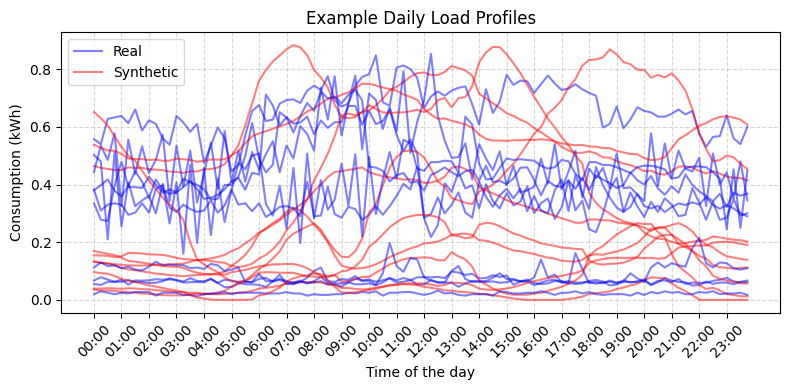

In [278]:
X_g1_end_hot = np.vstack(g1_end_hot['consumption'].values)
n_samples = 5000
synt_g1_end_hot = get_synt_pca(X_g1_end_hot, 10, 0.3,n_samples)

Real mean (avg over all time): 0.2762206223566675
Synthetic mean: 0.27500410602990916
Real std (avg over time): 0.26508868565614313
Synthetic std: 0.2488771458577781


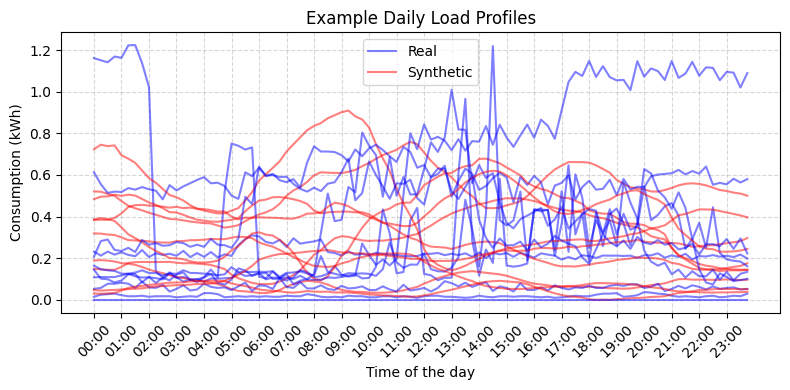

In [279]:
X_g1_end_cold = np.vstack(g1_end_cold['consumption'].values)
n_samples = 5000
synt_g1_end_cold = get_synt_pca(X_g1_end_cold, 10, 0.3,n_samples)

## high- hot/cold

In [280]:
grouped_2 = data[data['consumption_group'] == 2]

# Identify rows
is_weekday_name = grouped_2['weekday'].isin(weekdays)
is_festive = grouped_2[['day', 'month']].apply(tuple, axis=1).isin(festive_days)
is_weekend = grouped_2['weekday'].isin(['Saturday', 'Sunday'])

# Final logic:
g2_week = grouped_2[is_weekday_name & ~is_festive].copy()
g2_end = grouped_2[~(is_weekday_name & ~is_festive)].copy()

g2_week_hot = g2_week[(g2_week['season'] == 'Spring') | (g2_week['season'] == 'Summer')]
g2_week_cold = g2_week[(g2_week['season'] == 'Autumn') | (g2_week['season'] == 'Winter')]

g2_end_hot = g2_end[(g2_end['season'] == 'Spring') | (g2_end['season'] == 'Summer')]
g2_end_cold = g2_end[(g2_end['season'] == 'Autumn') | (g2_end['season'] == 'Winter')]

Real mean (avg over all time): 0.7030908442590936
Synthetic mean: 0.6957225268104585
Real std (avg over time): 0.5834435054222322
Synthetic std: 0.5668297554993634


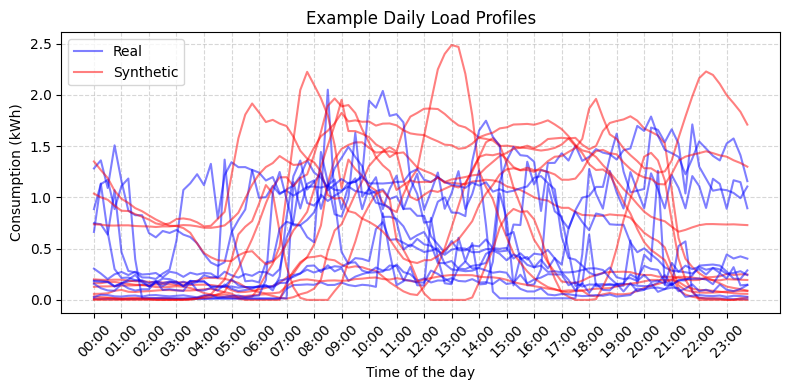

In [281]:
X_g2_week_hot = np.vstack(g2_week_hot['consumption'].values)
n_samples = 5000
synt_g2_week_hot = get_synt_pca(X_g2_week_hot, 10, 0.3,n_samples)

Real mean (avg over all time): 0.7344366720264516
Synthetic mean: 0.7316561167508051
Real std (avg over time): 0.6132139236867264
Synthetic std: 0.6043808483680602


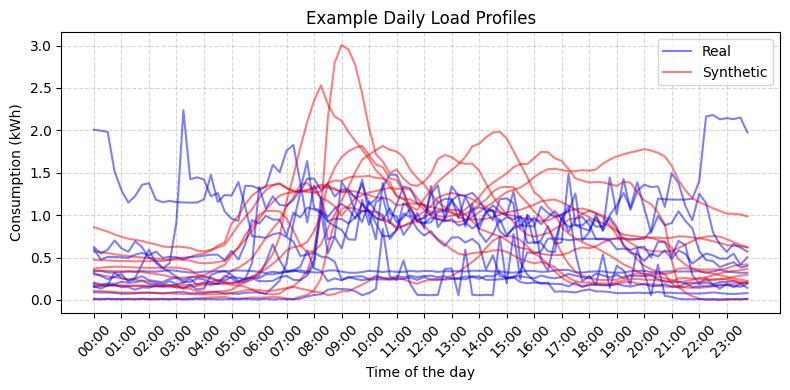

In [282]:
X_g2_week_cold = np.vstack(g2_week_cold['consumption'].values)
n_samples = 5000
synt_g2_week_cold = get_synt_pca(X_g2_week_cold, 10, 0.3,n_samples)

Real mean (avg over all time): 0.5247675629647347
Synthetic mean: 0.5223972413265103
Real std (avg over time): 0.48524271825477994
Synthetic std: 0.4782383318460878


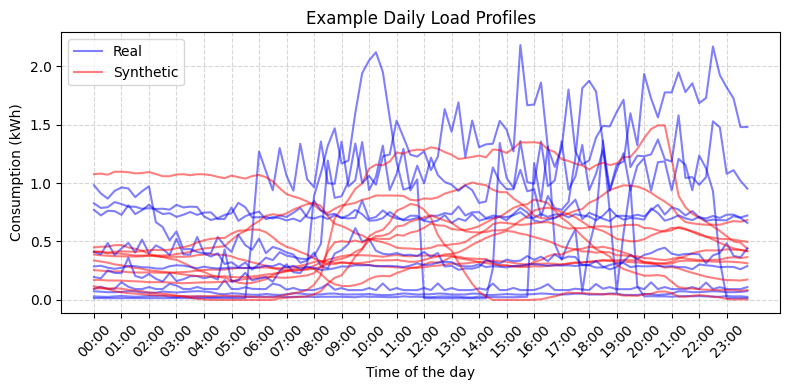

In [283]:
X_g2_end_hot = np.vstack(g2_end_hot['consumption'].values)
n_samples = 5000
synt_g2_end_hot = get_synt_pca(X_g2_end_hot, 10, 0.3,n_samples)

Real mean (avg over all time): 0.52641435249501
Synthetic mean: 0.5101880617733754
Real std (avg over time): 0.474576624758885
Synthetic std: 0.43696482417473503


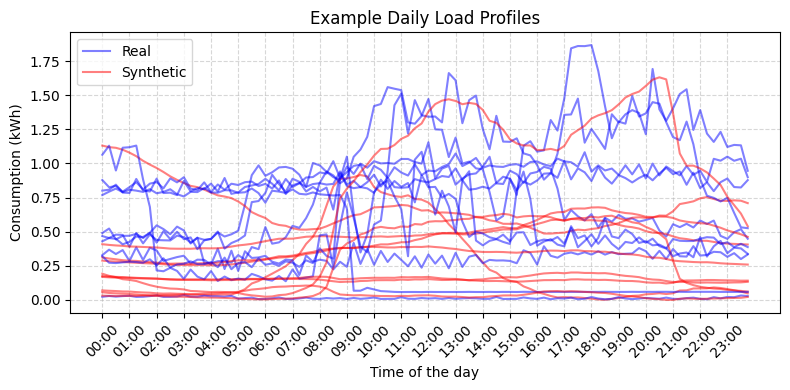

In [284]:
X_g2_end_cold = np.vstack(g2_end_cold['consumption'].values)
n_samples = 5000
synt_g2_end_cold = get_synt_pca(X_g2_end_cold, 5, 0.3,n_samples)

# Data preparation for copulas (not necessary if the previous section has been run)

In [9]:
df = pd.read_json("df_ultimate.json", orient="records")

In [33]:
data = df.copy()

In [34]:
# Weekday names
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

# Festive dates (day, month)
festive_days = {
    (1, 1), (6, 1), (25, 3), (28, 3), (25, 4), (1, 5),
    (8, 5), (5, 7), (29, 8), (1, 9), (15, 9),
    (1, 11), (17, 11), (24, 12), (25, 12), (26, 12)
}

In [35]:
grouped_0 = data[data['consumption_group'] == 0]

# Identify rows
is_weekday_name = grouped_0['weekday'].isin(weekdays)
is_festive = grouped_0[['day', 'month']].apply(tuple, axis=1).isin(festive_days)
is_weekend = grouped_0['weekday'].isin(['Saturday', 'Sunday'])

# Final logic:
g0_week = grouped_0[is_weekday_name & ~is_festive].copy()
g0_end = grouped_0[~(is_weekday_name & ~is_festive)].copy()

g0_week_hot = g0_week[(g0_week['season'] == 'Spring') | (g0_week['season'] == 'Summer')]
g0_week_cold = g0_week[(g0_week['season'] == 'Autumn') | (g0_week['season'] == 'Winter')]

g0_end_hot = g0_end[(g0_end['season'] == 'Spring') | (g0_end['season'] == 'Summer')]
g0_end_cold = g0_end[(g0_end['season'] == 'Autumn') | (g0_end['season'] == 'Winter')]


X_g0_week_hot = np.vstack(g0_week_hot['consumption'].values)
X_g0_week_cold = np.vstack(g0_week_cold['consumption'].values)
X_g0_end_hot = np.vstack(g0_end_hot['consumption'].values)
X_g0_end_cold = np.vstack(g0_end_cold['consumption'].values)

In [36]:
grouped_1 = data[data['consumption_group'] == 1]

# Identify rows
is_weekday_name = grouped_1['weekday'].isin(weekdays)
is_festive = grouped_1[['day', 'month']].apply(tuple, axis=1).isin(festive_days)
is_weekend = grouped_1['weekday'].isin(['Saturday', 'Sunday'])

# Final logic:
g1_week = grouped_1[is_weekday_name & ~is_festive].copy()
g1_end = grouped_1[~(is_weekday_name & ~is_festive)].copy()

g1_week_hot = g1_week[(g1_week['season'] == 'Spring') | (g1_week['season'] == 'Summer')]
g1_week_cold = g1_week[(g1_week['season'] == 'Autumn') | (g1_week['season'] == 'Winter')]

g1_end_hot = g1_end[(g1_end['season'] == 'Spring') | (g1_end['season'] == 'Summer')]
g1_end_cold = g1_end[(g1_end['season'] == 'Autumn') | (g1_end['season'] == 'Winter')]


X_g1_week_hot = np.vstack(g1_week_hot['consumption'].values)
X_g1_week_cold = np.vstack(g1_week_cold['consumption'].values)
X_g1_end_hot = np.vstack(g1_end_hot['consumption'].values)
X_g1_end_cold = np.vstack(g1_end_cold['consumption'].values)

In [37]:
grouped_2 = data[data['consumption_group'] == 2]

# Identify rows
is_weekday_name = grouped_2['weekday'].isin(weekdays)
is_festive = grouped_2[['day', 'month']].apply(tuple, axis=1).isin(festive_days)
is_weekend = grouped_2['weekday'].isin(['Saturday', 'Sunday'])

# Final logic:
g2_week = grouped_2[is_weekday_name & ~is_festive].copy()
g2_end = grouped_2[~(is_weekday_name & ~is_festive)].copy()

g2_week_hot = g2_week[(g2_week['season'] == 'Spring') | (g2_week['season'] == 'Summer')]
g2_week_cold = g2_week[(g2_week['season'] == 'Autumn') | (g2_week['season'] == 'Winter')]

g2_end_hot = g2_end[(g2_end['season'] == 'Spring') | (g2_end['season'] == 'Summer')]
g2_end_cold = g2_end[(g2_end['season'] == 'Autumn') | (g2_end['season'] == 'Winter')]


X_g2_week_hot = np.vstack(g2_week_hot['consumption'].values)
X_g2_week_cold = np.vstack(g2_week_cold['consumption'].values)
X_g2_end_hot = np.vstack(g2_end_hot['consumption'].values)
X_g2_end_cold = np.vstack(g2_end_cold['consumption'].values)

# ☆ copula 6-9 ☆

In [38]:
from statsmodels.distributions.empirical_distribution import ECDF
import pyvinecopulib as pv
import numpy as np

def build_copulas_by_scenario(time_range, groups_by_scenario, n_samples=10000, replace=True):
    """
    Costruisce una copula 3D (low, med, high) per ogni (stagione, tipo giorno, time-step t)
    
    Parameters:
        time_range: iterable di time-step t (es. range(25, 39))
        groups_by_scenario: dict con chiavi (season, daytype) e valori = (X_low, X_med, X_high)
        n_samples: numero di sample da usare per stimare la copula
        replace: se usare sampling con rimpiazzo

    Returns:
        copulas_by_scenario: dict con chiavi (season, daytype, t) e valore = copula stimata
        ecdfs_by_scenario: stesso schema, contiene le ECDF dei margini per inversione
    """
    copulas_by_scenario = {}
    ecdfs_by_scenario = {}

    for (season, daytype), (X_low, X_med, X_high) in groups_by_scenario.items():
        for t in time_range:
            # Sampling allineato
            idx_low = np.random.choice(len(X_low), size=n_samples, replace=replace)
            idx_med = np.random.choice(len(X_med), size=n_samples, replace=replace)
            idx_high = np.random.choice(len(X_high), size=n_samples, replace=replace)

            L = X_low[idx_low, t]
            M = X_med[idx_med, t]
            H = X_high[idx_high, t]

            # Calcola ECDF per margini uniformi
            ecdf_L = ECDF(L)
            ecdf_M = ECDF(M)
            ecdf_H = ECDF(H)

            U = np.column_stack([
                ecdf_L(L),
                ecdf_M(M),
                ecdf_H(H)
            ])

            # Stima copula
            copula = pv.Vinecop(d=U.shape[1])
            copula.select(U)

            copulas_by_scenario[(season, daytype, t)] = copula
            ecdfs_by_scenario[(season, daytype, t)] = (ecdf_L, ecdf_M, ecdf_H)

    return copulas_by_scenario, ecdfs_by_scenario, U


In [39]:
groups_by_scenario = {
    ('hot', 'week'): (X_g0_week_hot, X_g1_week_hot, X_g2_week_hot),
    ('hot', 'end'):  (X_g0_end_hot,  X_g1_end_hot,  X_g2_end_hot),
    ('cold', 'week'): (X_g0_week_cold, X_g1_week_cold, X_g2_week_cold),
    ('cold', 'end'):  (X_g0_end_cold,  X_g1_end_cold,  X_g2_end_cold),
}

# Costruisci tutte le copule per la fascia oraria 6:15 - 9:00 AM (time steps 25–38)
copulas_by_scenario, ecdfs_by_scenario, U = build_copulas_by_scenario(
    time_range=range(25, 38), # 6-9 AM
    groups_by_scenario=groups_by_scenario,
    n_samples=5000
)


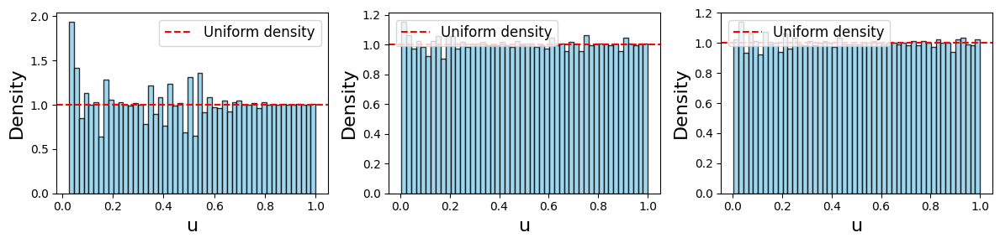

In [40]:
plt.figure(figsize=(12, 3))
for i, label in enumerate(['Low', 'Med', 'High']):
    plt.subplot(1, 3, i+1)
    plt.hist(U[:, i], bins=50, density=True, alpha=0.8, color='skyblue', edgecolor='k')
    plt.axhline(1, color='red', linestyle='--', label='Uniform density')
    #plt.title(f"{label} – Marginal ECDF")
    plt.xlabel("u",fontsize = 16)
    plt.ylabel("Density", fontsize = 16)
    plt.legend(fontsize = 12)
plt.tight_layout()
#plt.savefig(f"ECDF_MOR.png", dpi=300)
plt.show()


In [41]:
def is_weekday(random_date):
    # Extract day of week and date parts
    weekday_name = random_date.strftime('%A')  # e.g. 'Monday'
    day = random_date.day
    month = random_date.month
    
    # Check conditions
    is_weekend = weekday_name in ['Saturday', 'Sunday']
    is_festive = (day, month) in festive_days
    is_weekday = not is_festive and not is_weekend

    return is_weekday


def is_hot_season(random_date):
    month = random_date.month

    # Define hot and cold months
    hot_months = [3, 4, 5, 6, 7, 8]     # Spring + Summer
    cold_months = [9, 10, 11, 12, 1, 2] # Autumn + Winter

    return month in hot_months  # Returns True if hot, False if cold

In [131]:
def sample_loads_MOR(chosen_date, t): # 60-30-10
    loads = []
    loads.append(sample_consume(120, 60, 20, t, chosen_date))
    loads.append(sample_consume(180, 90, 30, t, chosen_date))
    loads.append(sample_consume(312,156, 52, t, chosen_date))
    loads.append(sample_consume(240,120, 40, t, chosen_date))
    loads.append(sample_consume(252,126, 42, t, chosen_date))
    loads.append(sample_consume(204, 102, 34, t, chosen_date))
    loads.append(sample_consume(144, 72, 24, t, chosen_date))
    loads.append(sample_consume(96, 96, 18, t, chosen_date))
    return [l * 0.85 for l in loads]

def sample_loads_AFT(chosen_date, t): # 40-40-20
    loads = []
    loads.append(sample_consume(80, 80, 40, t, chosen_date))
    loads.append(sample_consume(120, 120, 60, t, chosen_date))
    loads.append(sample_consume(208, 208, 104, t, chosen_date))
    loads.append(sample_consume(160, 160, 80, t, chosen_date))
    loads.append(sample_consume(168, 168, 84, t, chosen_date))
    loads.append(sample_consume(136, 136, 68, t, chosen_date))
    loads.append(sample_consume(96, 96, 48, t, chosen_date))
    loads.append(sample_consume(64, 64, 32, t, chosen_date))
    return loads

def sample_loads_EVE(chosen_date, t):  # 20-40-40
    loads = []
    loads.append(sample_consume(40, 40, 80, t, chosen_date))
    loads.append(sample_consume(60, 120, 120, t, chosen_date))
    loads.append(sample_consume(104, 208, 208, t, chosen_date))
    loads.append(sample_consume(80, 160, 160, t, chosen_date))
    loads.append(sample_consume(84, 168, 168, t, chosen_date))
    loads.append(sample_consume(68, 136, 136, t, chosen_date))
    loads.append(sample_consume(48, 96, 96, t, chosen_date))
    loads.append(sample_consume(32, 64, 64, t, chosen_date))
    return [l * 0.7 for l in loads]

In [44]:
def sample_consume(l, m, h, t, chosen_date):
    scale=0.985
    # Determine scenario
    season = 'hot' if is_hot_season(chosen_date) else 'cold'
    daytype = 'week' if is_weekday(chosen_date) else 'end'

    # Get copula and ECDFs
    copula = copulas_by_scenario[(season, daytype, t)]
    ecdf_L, ecdf_M, ecdf_H = ecdfs_by_scenario[(season, daytype, t)]

    # Simulate one point from copula
    U = copula.simulate(1).flatten()

    # Inverse ECDFs
    def inverse_ecdf(u, ecdf_vals, x_vals):
        return x_vals[np.searchsorted(ecdf_vals, u, side="right")]

    x_L, F_L = ecdf_L.x, ecdf_L.y
    x_M, F_M = ecdf_M.x, ecdf_M.y
    x_H, F_H = ecdf_H.x, ecdf_H.y

    val_L = inverse_ecdf(U[0], F_L, x_L)
    val_M = inverse_ecdf(U[1], F_M, x_M)
    val_H = inverse_ecdf(U[2], F_H, x_H)

    # Slightly scale total load to match real case
    total = scale * (val_L * l + val_M * m + val_H * h) / 1000  # kW → MW
    return total

In [22]:
# GET THESE FROM THE PILOR RUN
means_array = np.array([1.87449378, 1.21347408, 0.90307013, 0.67092428 ,0.65353979 ,0.46769082,
 0.37479833, 0.35926917, 0.39267894 ,0.90307006, 0.46765258 ,0.46767026,
 0.37479491])

stds_array = np.array([0.07688661, 0.08984813, 0.10163045 ,0.13416646, 0.06436741, 0.04312919,
 0.05819604, 0.06370215 ,0.0308027 , 0.10163038, 0.04304346 ,0.04307345,
 0.05820632])

In [46]:
net = pn.create_cigre_network_mv(with_der="all")
net.sgen['controllable'] = True  # Imposta tutti i generatori come controllabili
# Constraints
width_factor = 2 # try 1.0 first, then tighten
net.sgen['min_p_mw'] = means_array - width_factor * stds_array
net.sgen['max_p_mw'] = means_array + width_factor * stds_array

#net.sgen['min_q_mvar'] = -40  # Example reactive power limits (adjust as needed)
#net.sgen['max_q_mvar'] = 40   # Example reactive power limits (adjust as needed)



net.sgen['min_q_mvar'] = -0.3 * net.sgen['max_p_mw']  # Example reactive power limits (adjust as needed)
net.sgen['max_q_mvar'] = 0.3 * net.sgen['max_p_mw']   # Example reactive power limits (adjust as needed)

net.load['min_q_mvar'] = 0.9 * net.load['q_mvar']
net.load['max_q_mvar'] = 1.1 * net.load['q_mvar']




net.ext_grid['min_p_mw'] = 0
net.ext_grid['max_p_mw'] = 80

net.bus["min_vm_pu"] = 0.95
net.bus["max_vm_pu"] = 1.05

net.trafo["max_loading_percent"] = 95
net.line["max_loading_percent"] = 95

# EXT GRID CON VALORI VERI DI MERCATO
cp2_ext = 0.01  # o un valore molto piccolo, es: 0.001

for idx in net.ext_grid.index:
    pp.create_poly_cost(net, element=idx, et="ext_grid",
                        cp1_eur_per_mw=80,     # prezzo medio di mercato €/MWh
                        cp2_eur_per_mw2=cp2_ext,
                        cp0_eur=0)

# SGEN CON COST FUNCTION SOLO PER OTTIMIZZARE
cp2_min = 3
cp2_max = 5
std_min = stds_array.min()
std_max = stds_array.max()

# Linear scaling: std_min → cp2_min, std_max → cp2_max
#cp2_sgen_array = cp2_min + (cp2_max - cp2_min) * (stds_array - std_min) / (std_max - std_min)  #  HIGH STD --> HIGH PENALTY
cp2_sgen_array = cp2_max - (cp2_max - cp2_min) * (stds_array - std_min) / (std_max - std_min)    #inverted: HIGH STD --> LOWER PENALTY



for i, idx in enumerate(net.sgen.index):
    mean_val = means_array[i]
    pp.create_poly_cost(net, element=idx, et="sgen",
                        cp1_eur_per_mw=-2 * cp2_sgen_array[i] * mean_val,     # makes min at mean
                        cp2_eur_per_mw2=cp2_sgen_array[i],
                        cp0_eur=cp2_sgen_array[i] * mean_val**2)

In [47]:
# Parametri Monte Carlo
from scipy.stats import gaussian_kde
n_iterations = 1300 # DEVE ESSERE MULTIPLO DI 13  

total_costs = []
results = []
results_weighted = []
input_loads = []
start_time = time.time()

household_indices = [1, 2, 3, 4, 5, 6, 7, 9]  # Indices of household-like loads

# 25-38 per le 6-9 AM
# 45-58 per le 11-14 PM
# 77- 90 per le 19-22 PM
# Esegui il ciclo Monte Carlo
with tqdm(total=n_iterations, desc="Esecuzione Monte Carlo", unit="iter") as pbar:
    for k in range(25,38): # time stamps dalle 6 alle 9 di mattina (LO FISSO)
        for iteration in range(n_iterations//13):  
            try:
    
                random_date = df['date'].sample(n=1).iloc[0]
                sampled_p = sample_loads_MOR(random_date,k)
                #print(sampled_p)
                
                # Update network loads
                net.load.loc[household_indices, 'p_mw'] = sampled_p


                
                # Normalize active power to [0, 1]
                sampled_p_array = np.array(sampled_p)
                p_norm = (sampled_p_array - sampled_p_array.min()) / (sampled_p_array.max() - sampled_p_array.min())
                
                # Inverse scaling: high p → lower pf (i.e., more inductive), low p → higher pf
                sampled_pf = 0.99 - 0.03 * p_norm
                q_mvar = sampled_p * np.tan(np.arccos(sampled_pf))
                net.load.loc[household_indices, 'q_mvar'] = q_mvar
    

                
                # Run OPF
                pp.runopp(net, init = 'pf') #, verbose=True, enforce_q_lims=True
    
                # Save results
                results = save_results_loads(net, results)
    
                # Update progress bar
                pbar.update(1)
    
            except Exception as e:
                print(f"Errore nell'iterazione {iteration}: {e}")


# Calcola il tempo totale
total_time = time.time() - start_time
minutes = int(total_time // 60)
seconds = int(total_time % 60)
print(f"Tempo totale per {n_iterations} iterazioni di Monte Carlo: {minutes} minuti e {seconds} secondi.")

Esecuzione Monte Carlo:  28%|██████████████▏                                    | 361/1300 [06:02<4:34:52, 17.56s/iter]

Errore nell'iterazione 61: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  33%|█████████████████▋                                   | 433/1300 [07:05<12:53,  1.12iter/s]

Errore nell'iterazione 34: Optimal Power Flow did not converge!


Esecuzione Monte Carlo: 100%|███████████████████████████████████████████████████▉| 1298/1300 [18:22<00:01,  1.18iter/s]

Tempo totale per 1300 iterazioni di Monte Carlo: 18 minuti e 22 secondi.


In [48]:
results_df_mor_cop = pd.DataFrame(results)

In [49]:
results_df_mor_cop.to_json('copula_morning.json', orient='records', lines=True)

In [108]:
net.sgen

,name,bus,p_mw,q_mvar,sn_mva,scaling,in_service,type,current_source,controllable,min_p_mw,max_p_mw,min_q_mvar,max_q_mvar
0,PV 3,3,0.020,0.0,0.020,1.0,True,PV,True,True,1.832435,2.268534,-0.680560,0.680560
1,PV 4,4,0.020,0.0,0.020,1.0,True,PV,True,True,1.104390,1.625532,-0.487660,0.487660
2,PV 5,5,0.030,0.0,0.030,1.0,True,PV,True,True,0.743367,1.341010,-0.402303,0.402303
3,PV 6,6,0.030,0.0,0.030,1.0,True,PV,True,True,0.406567,1.237697,-0.371309,0.371309
4,PV 8,8,0.030,0.0,0.030,1.0,True,PV,True,True,0.556300,0.917222,-0.275167,0.275167
5,PV 9,9,0.030,0.0,0.030,1.0,True,PV,True,True,0.392337,0.635766,-0.190730,0.190730
6,PV 10,10,0.040,0.0,0.040,1.0,True,PV,True,True,0.247760,0.594074,-0.178222,0.178222
7,PV 11,11,0.010,0.0,0.010,1.0,True,PV,True,True,0.220388,0.588837,-0.176651,0.176651
8,WKA 7,7,1.500,0.0,1.500,1.0,True,WP,True,True,0.316048,0.492975,-0.147893,0.147893
9,Residential fuel cell 1,5,0.033,0.0,0.033,1.0,True,Residential fuel cell,True,True,0.743367,1.341010,-0.402303,0.402303


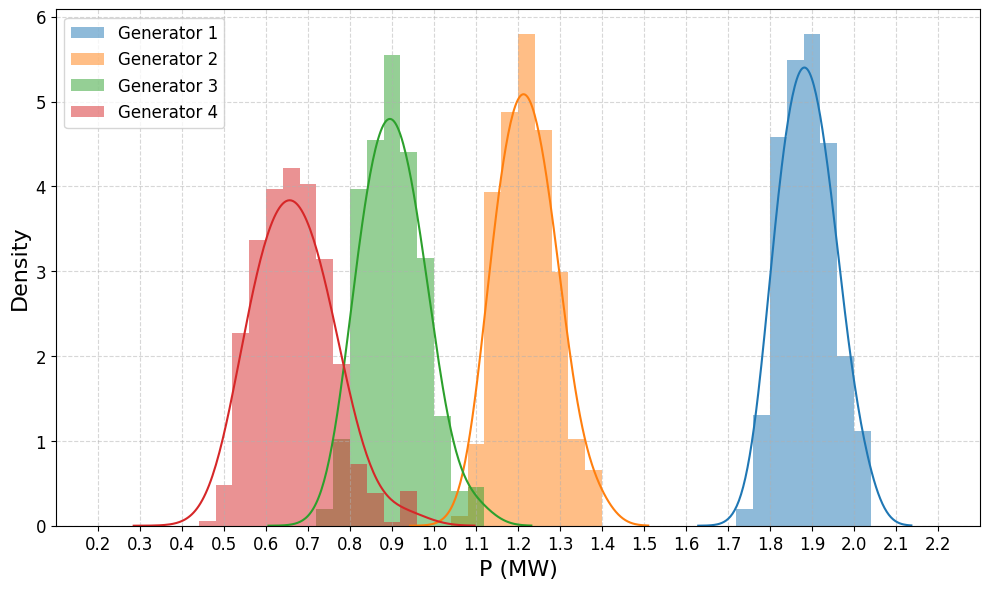

In [60]:
gen_df_mor_cop = pd.DataFrame({
    f'gen{i+1}_p_mw': results_df_mor_cop['sgen_p_mw'].apply(lambda x: x[i])
    for i in range(13)
})

plot_and_save_generator_distrib(gen_df_mor_cop, save = 0)

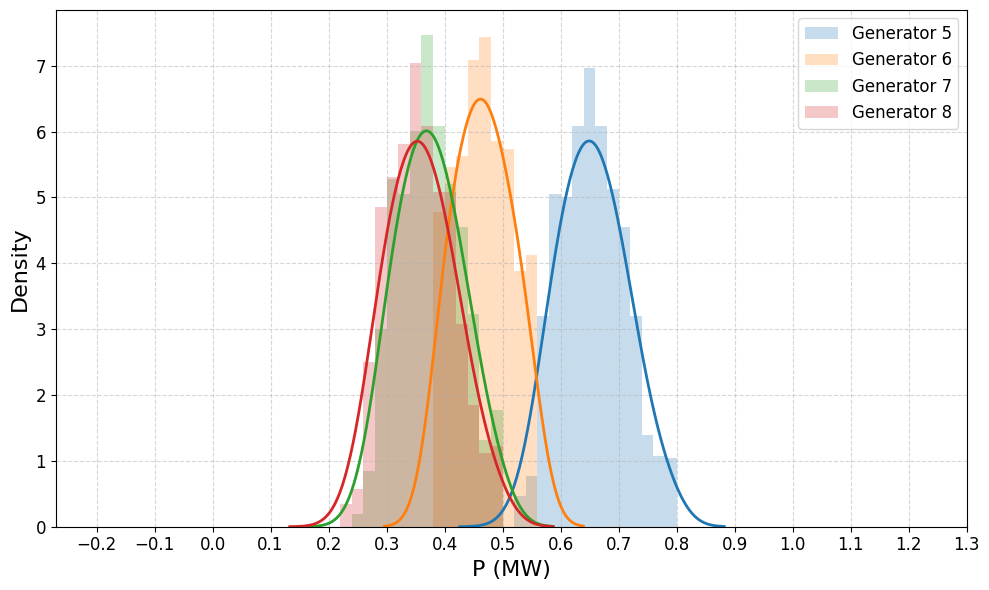

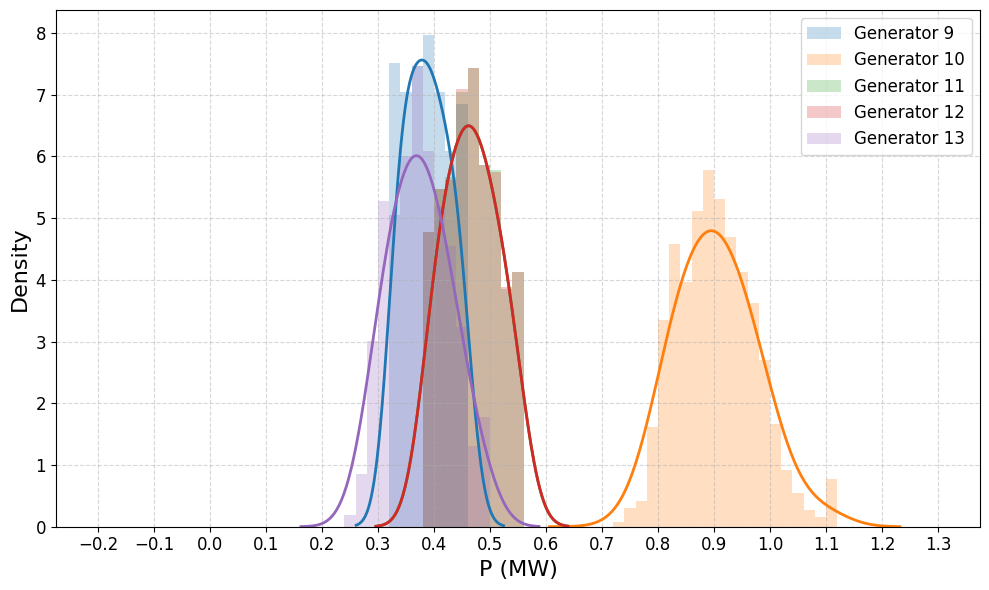

In [51]:
plot_and_save_generator_distrib_other(gen_df_mor_cop, save = 0)

In [187]:
means_array

array([2.05048449, 1.36496103, 1.04218846, 0.82213189, 0.73676131,
       0.51405143, 0.42091686, 0.40461246, 0.40451185, 1.04218865,
       0.514214  , 0.5141551 , 0.42089465])

In [188]:
stds_array

array([0.10902474, 0.13028532, 0.14941071, 0.20778264, 0.09023058,
       0.06085707, 0.08657846, 0.09211213, 0.04423175, 0.14941071,
       0.06077281, 0.06080204, 0.08659221])

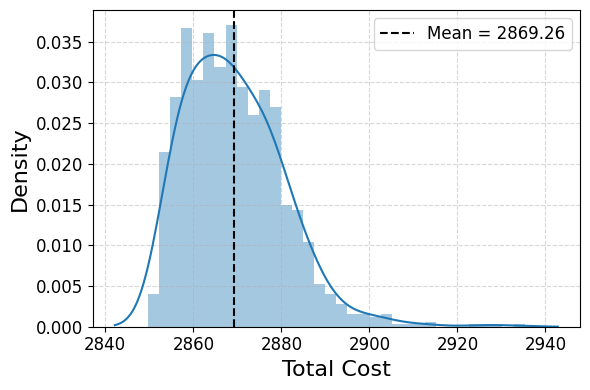

In [52]:
plot_cost_mc(results_df_mor_cop, save = 0)

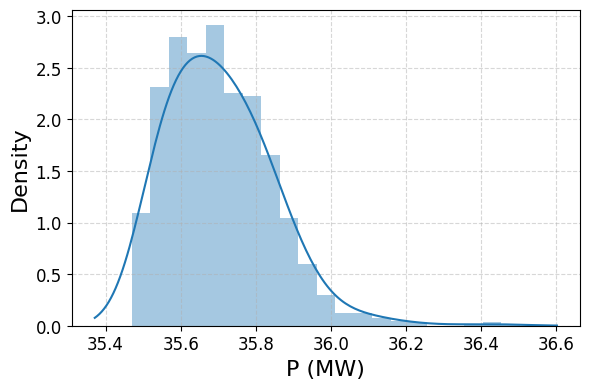

In [53]:
plot_ext_grid(results_df_mor_cop, save = 0)

In [303]:
results_df_og = pd.read_json('DATA_FINAL\\BENCH\\MOR_BENCH.json', orient='records', lines=True)

# ☆ copula 12-15 ☆

In [198]:
groups_by_scenario = {
    ('hot', 'week'): (X_g0_week_hot, X_g1_week_hot, X_g2_week_hot),
    ('hot', 'end'):  (X_g0_end_hot,  X_g1_end_hot,  X_g2_end_hot),
    ('cold', 'week'): (X_g0_week_cold, X_g1_week_cold, X_g2_week_cold),
    ('cold', 'end'):  (X_g0_end_cold,  X_g1_end_cold,  X_g2_end_cold),
}

# Costruisci tutte le copule per la fascia oraria 6:15 - 9:00 AM (time steps 25–38)
copulas_by_scenario, ecdfs_by_scenario, U = build_copulas_by_scenario(
    time_range=range(49, 62), 
    groups_by_scenario=groups_by_scenario,
    n_samples=5000
)

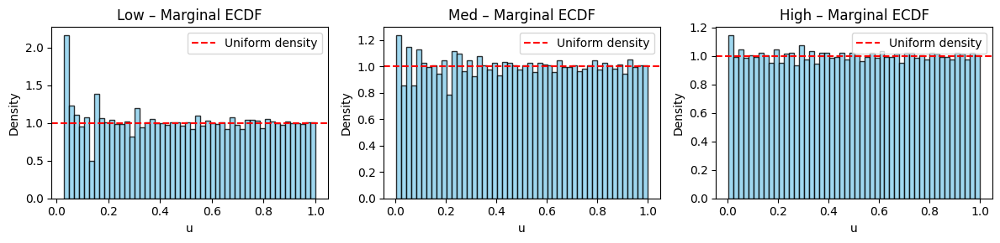

In [199]:
plt.figure(figsize=(12, 3))
for i, label in enumerate(['Low', 'Med', 'High']):
    plt.subplot(1, 3, i+1)
    plt.hist(U[:, i], bins=50, density=True, alpha=0.8, color='skyblue', edgecolor='k')
    plt.axhline(1, color='red', linestyle='--', label='Uniform density')
    plt.title(f"{label} – Marginal ECDF")
    plt.xlabel("u")
    plt.ylabel("Density")
    plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# GET THESE FROM THE PILOR RUN
means_array = np.array([......])

stds_array = np.array([.....])

In [200]:
net = pn.create_cigre_network_mv(with_der="all")
net.sgen['controllable'] = True  # Imposta tutti i generatori come controllabili
# Constraints
width_factor = 6 # try 1.0 first, then tighten
net.sgen['min_p_mw'] = means_array - width_factor * stds_array
net.sgen['max_p_mw'] = means_array + width_factor * stds_array


net.sgen['min_q_mvar'] = -0.5 * net.sgen['max_p_mw']  # Example reactive power limits (adjust as needed)
net.sgen['max_q_mvar'] = 0.5 * net.sgen['max_p_mw']   # Example reactive power limits (adjust as needed)

net.load['min_q_mvar'] = 0.9 * net.load['q_mvar']
net.load['max_q_mvar'] = 1.1 * net.load['q_mvar']


net.ext_grid['min_p_mw'] = 0
net.ext_grid['max_p_mw'] = 80

net.bus["min_vm_pu"] = 0.95
net.bus["max_vm_pu"] = 1.05

net.trafo["max_loading_percent"] = 95
net.line["max_loading_percent"] = 95

# EXT GRID CON VALORI VERI DI MERCATO
cp2_ext = 0.01  # o un valore molto piccolo, es: 0.001

for idx in net.ext_grid.index:
    pp.create_poly_cost(net, element=idx, et="ext_grid",
                        cp1_eur_per_mw=80,     # prezzo medio di mercato €/MWh
                        cp2_eur_per_mw2=cp2_ext,
                        cp0_eur=0)

# SGEN CON COST FUNCTION SOLO PER OTTIMIZZARE
cp2_min =  1
cp2_max =  3
std_min = stds_array.min()
std_max = stds_array.max()

# Linear scaling: std_min → cp2_min, std_max → cp2_max
#cp2_sgen_array = cp2_min + (cp2_max - cp2_min) * (stds_array - std_min) / (std_max - std_min)  #  HIGH STD --> HIGH PENALTY
cp2_sgen_array = cp2_max - (cp2_max - cp2_min) * (stds_array - std_min) / (std_max - std_min)    #inverted: HIGH STD --> LOWER PENALTY



for i, idx in enumerate(net.sgen.index):
    mean_val = means_array[i]
    pp.create_poly_cost(net, element=idx, et="sgen",
                        cp1_eur_per_mw=-2 * cp2_sgen_array[i] * mean_val,     # makes min at mean
                        cp2_eur_per_mw2=cp2_sgen_array[i],
                        cp0_eur=cp2_sgen_array[i] * mean_val**2)

In [201]:
# Parametri Monte Carlo
from scipy.stats import gaussian_kde
n_iterations = 1300 # DEVE ESSERE MULTIPLO DI 13  

total_costs = []
results = []
results_weighted = []
start_time = time.time()

household_indices = [1, 2, 3, 4, 5, 6, 7, 9]  # Indices of household-like loads

# 25-38 per le 6-9 AM
# 45-58 per le 11-14 PM
# 77- 90 per le 19-22 PM
# Esegui il ciclo Monte Carlo
with tqdm(total=n_iterations, desc="Esecuzione Monte Carlo", unit="iter") as pbar:
    for k in range(49,62): # time stamps dalle 6 alle 9 di mattina (LO FISSO)
        for iteration in range(n_iterations//13):  
            try:
    
                random_date = df['date'].sample(n=1).iloc[0]
                sampled_p = sample_loads_AFT(random_date,k)
                #print(sampled_p)
                
                # Update network loads
                net.load.loc[household_indices, 'p_mw'] = sampled_p


                # Normalize active power to [0, 1]
                sampled_p_array = np.array(sampled_p)
                p_norm = (sampled_p_array - sampled_p_array.min()) / (sampled_p_array.max() - sampled_p_array.min())

                
                # Inverse scaling: high p → lower pf (i.e., more inductive), low p → higher pf
                sampled_pf = 0.98 - 0.05 * p_norm
                q_mvar = sampled_p * np.tan(np.arccos(sampled_pf))
                net.load.loc[household_indices, 'q_mvar'] = q_mvar
    
    
                # Run OPF
                pp.runopp(net, init = 'pf') #, verbose=True, enforce_q_lims=True
    
                # Save results
                results = save_results_loads(net, results)
    
                # Update progress bar
                pbar.update(1)
    
            except Exception as e:
                print(f"Errore nell'iterazione {iteration}: {e}")


# Calcola il tempo totale
total_time = time.time() - start_time
minutes = int(total_time // 60)
seconds = int(total_time % 60)
print(f"Tempo totale per {n_iterations} iterazioni di Monte Carlo: {minutes} minuti e {seconds} secondi.")

Esecuzione Monte Carlo:   3%|█▊                                                    | 44/1300 [00:38<18:16,  1.15iter/s]

Errore nell'iterazione 44: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  25%|█████████████▎                                       | 326/1300 [04:58<20:09,  1.24s/iter]

Errore nell'iterazione 27: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  26%|█████████████▋                                       | 337/1300 [05:11<15:04,  1.06iter/s]

Errore nell'iterazione 39: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  44%|███████████████████████                              | 567/1300 [10:37<09:44,  1.25iter/s]

Errore nell'iterazione 70: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  63%|█████████████████████████████████▌                   | 822/1300 [14:33<07:28,  1.07iter/s]

Errore nell'iterazione 26: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  66%|██████████████████████████████████▊                  | 854/1300 [15:06<07:46,  1.04s/iter]

Errore nell'iterazione 59: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  83%|███████████████████████████████████████████▏        | 1080/1300 [21:44<02:55,  1.25iter/s]

Errore nell'iterazione 86: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  99%|███████████████████████████████████████████████████▋| 1293/1300 [24:37<00:08,  1.14s/iter]

Tempo totale per 1300 iterazioni di Monte Carlo: 24 minuti e 37 secondi.


In [202]:
results_df_aft_cop = pd.DataFrame(results)

In [203]:
results_df_aft_cop.to_json('copula_afternoon.json', orient='records', lines=True)

In [261]:
#results_df_aft = pd.read_json("DATA_FINAL\\MC_synt_6-9_LAST.json", lines=True)

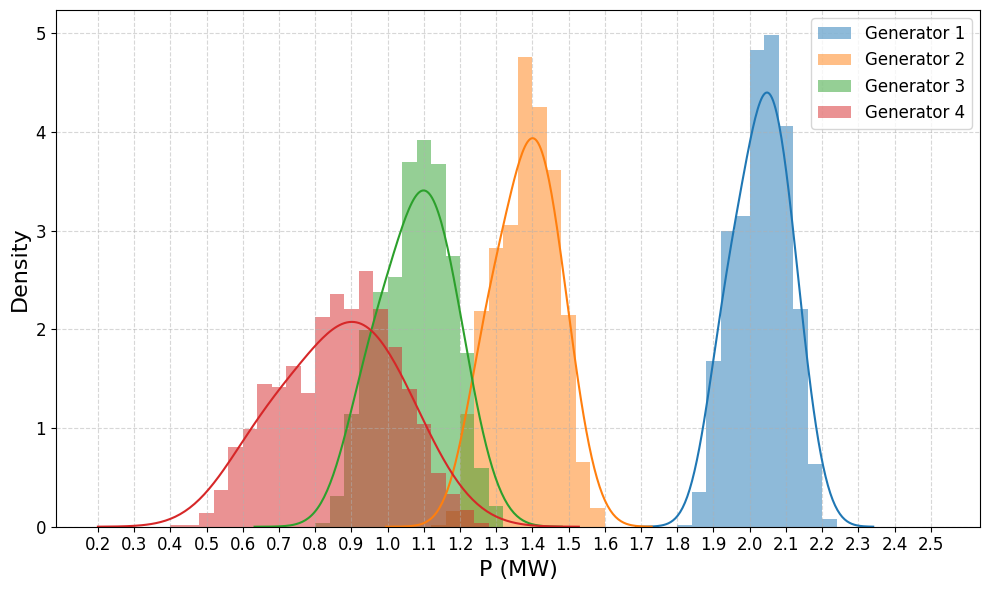

In [204]:
gen_df_aft_cop = pd.DataFrame({
    f'gen{i+1}_p_mw': results_df_aft_cop['sgen_p_mw'].apply(lambda x: x[i])
    for i in range(13)
})
plot_and_save_generator_distrib(gen_df_aft_cop, 1)

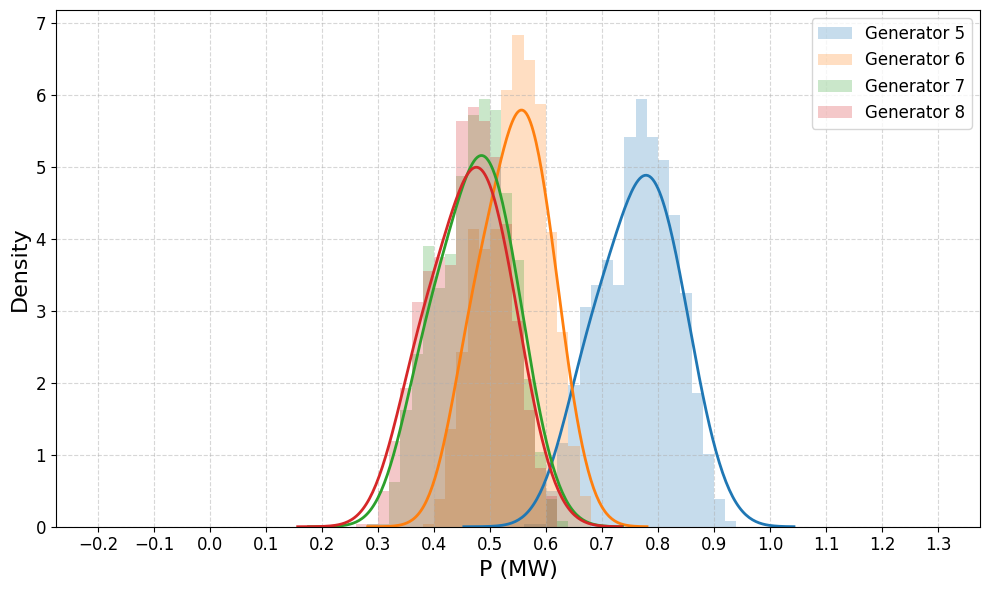

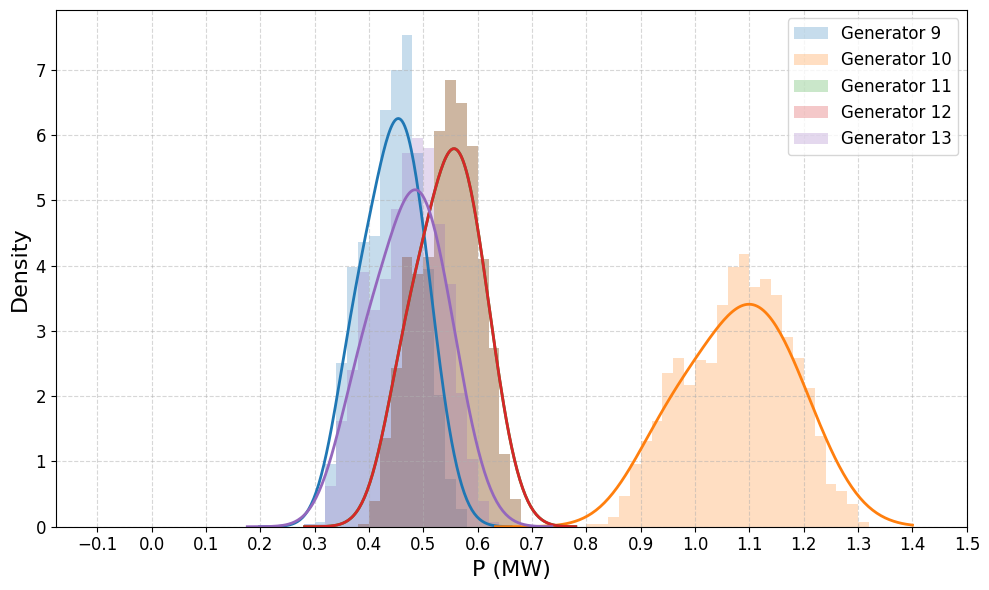

In [205]:
plot_and_save_generator_distrib_other(gen_df_aft_cop,1)

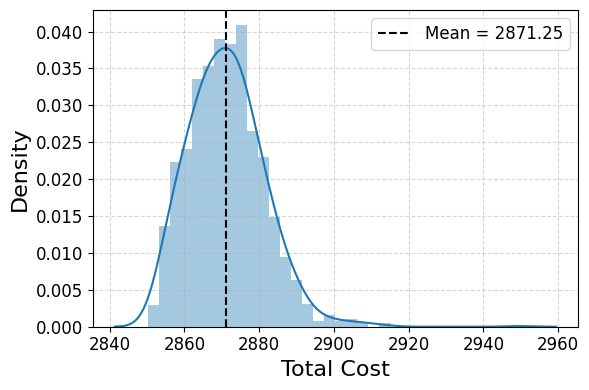

In [206]:
plot_cost_mc(results_df_aft_cop, save = 1)

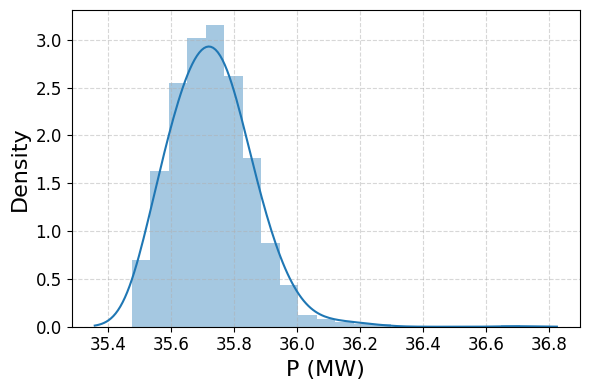

In [207]:
plot_ext_grid(results_df_aft_cop, save = 1)

# ☆ copula 19-21 ☆

In [197]:
groups_by_scenario = {
    ('hot', 'week'): (X_g0_week_hot, X_g1_week_hot, X_g2_week_hot),
    ('hot', 'end'):  (X_g0_end_hot,  X_g1_end_hot,  X_g2_end_hot),
    ('cold', 'week'): (X_g0_week_cold, X_g1_week_cold, X_g2_week_cold),
    ('cold', 'end'):  (X_g0_end_cold,  X_g1_end_cold,  X_g2_end_cold),
}

# Costruisci tutte le copule per la fascia oraria 6:15 - 9:00 AM (time steps 25–38)
copulas_by_scenario, ecdfs_by_scenario, U = build_copulas_by_scenario(
    time_range=range(77, 90), 
    groups_by_scenario=groups_by_scenario,
    n_samples=5000
)

KeyboardInterrupt: 

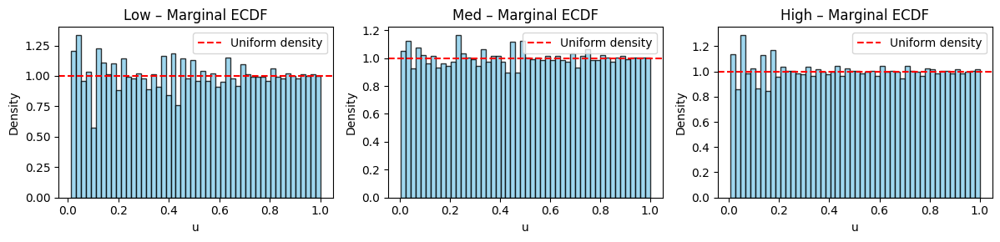

In [128]:
plt.figure(figsize=(12, 3))
for i, label in enumerate(['Low', 'Med', 'High']):
    plt.subplot(1, 3, i+1)
    plt.hist(U[:, i], bins=50, density=True, alpha=0.8, color='skyblue', edgecolor='k')
    plt.axhline(1, color='red', linestyle='--', label='Uniform density')
    plt.title(f"{label} – Marginal ECDF")
    plt.xlabel("u")
    plt.ylabel("Density")
    plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# GET THESE FROM THE PILOR RUN
means_array = np.array([......])

stds_array = np.array([.....])

In [130]:
net = pn.create_cigre_network_mv(with_der="all")
net.sgen['controllable'] = True  # Imposta tutti i generatori come controllabili
# Constraints
width_factor = 2 # try 1.0 first, then tighten
net.sgen['min_p_mw'] = means_array - width_factor * stds_array
net.sgen['max_p_mw'] = means_array + width_factor * stds_array

#net.sgen['min_q_mvar'] = -40  # Example reactive power limits (adjust as needed)
#net.sgen['max_q_mvar'] = 40   # Example reactive power limits (adjust as needed)



net.sgen['min_q_mvar'] = -0.3 * net.sgen['max_p_mw']  # Example reactive power limits (adjust as needed)
net.sgen['max_q_mvar'] = 0.3 * net.sgen['max_p_mw']   # Example reactive power limits (adjust as needed)

net.load['min_q_mvar'] = 0.9 * net.load['q_mvar']
net.load['max_q_mvar'] = 1.1 * net.load['q_mvar']




net.ext_grid['min_p_mw'] = 0
net.ext_grid['max_p_mw'] = 80

net.bus["min_vm_pu"] = 0.95
net.bus["max_vm_pu"] = 1.05

net.trafo["max_loading_percent"] = 95
net.line["max_loading_percent"] = 95

# EXT GRID CON VALORI VERI DI MERCATO
cp2_ext = 0.01  # o un valore molto piccolo, es: 0.001

for idx in net.ext_grid.index:
    pp.create_poly_cost(net, element=idx, et="ext_grid",
                        cp1_eur_per_mw=80,     # prezzo medio di mercato €/MWh
                        cp2_eur_per_mw2=cp2_ext,
                        cp0_eur=0)

# SGEN CON COST FUNCTION SOLO PER OTTIMIZZARE
cp2_min = 3
cp2_max = 5
std_min = stds_array.min()
std_max = stds_array.max()

# Linear scaling: std_min → cp2_min, std_max → cp2_max
#cp2_sgen_array = cp2_min + (cp2_max - cp2_min) * (stds_array - std_min) / (std_max - std_min)  #  HIGH STD --> HIGH PENALTY
cp2_sgen_array = cp2_max - (cp2_max - cp2_min) * (stds_array - std_min) / (std_max - std_min)    #inverted: HIGH STD --> LOWER PENALTY



for i, idx in enumerate(net.sgen.index):
    mean_val = means_array[i]
    pp.create_poly_cost(net, element=idx, et="sgen",
                        cp1_eur_per_mw=-2 * cp2_sgen_array[i] * mean_val,     # makes min at mean
                        cp2_eur_per_mw2=cp2_sgen_array[i],
                        cp0_eur=cp2_sgen_array[i] * mean_val**2)

In [132]:
# Parametri Monte Carlo
from scipy.stats import gaussian_kde
n_iterations = 1300 # DEVE ESSERE MULTIPLO DI 13  

total_costs = []
results = []
results_weighted = []
input_loads = []
start_time = time.time()

household_indices = [1, 2, 3, 4, 5, 6, 7, 9]  # Indices of household-like loads

# 25-38 per le 6-9 AM
# 45-58 per le 11-14 PM
# 77- 90 per le 19-22 PM
# Esegui il ciclo Monte Carlo
with tqdm(total=n_iterations, desc="Esecuzione Monte Carlo", unit="iter") as pbar:
    for k in range(77,90): # time stamps dalle 6 alle 9 di mattina (LO FISSO)
        for iteration in range(n_iterations//13):  
            try:
    
                random_date = df['date'].sample(n=1).iloc[0]
                sampled_p = sample_loads_EVE(random_date,k)
                #print(sampled_p)
                
                # Update network loads
                net.load.loc[household_indices, 'p_mw'] = sampled_p


                
                # Normalize active power to [0, 1]
                sampled_p_array = np.array(sampled_p)
                p_norm = (sampled_p_array - sampled_p_array.min()) / (sampled_p_array.max() - sampled_p_array.min())
                
                # Inverse scaling: high p → lower pf (i.e., more inductive), low p → higher pf
                sampled_pf = 0.99 - 0.03 * p_norm
                q_mvar = sampled_p * np.tan(np.arccos(sampled_pf))
                net.load.loc[household_indices, 'q_mvar'] = q_mvar
    

                
                # Run OPF
                pp.runopp(net, init = 'pf') #, verbose=True, enforce_q_lims=True
    
                # Save results
                results = save_results_loads(net, results)
    
                # Update progress bar
                pbar.update(1)
    
            except Exception as e:
                print(f"Errore nell'iterazione {iteration}: {e}")


# Calcola il tempo totale
total_time = time.time() - start_time
minutes = int(total_time // 60)
seconds = int(total_time % 60)
print(f"Tempo totale per {n_iterations} iterazioni di Monte Carlo: {minutes} minuti e {seconds} secondi.")

Esecuzione Monte Carlo:  88%|█████████████████████████████████████████████▌      | 1138/1300 [24:12<02:09,  1.25iter/s]

Errore nell'iterazione 38: Optimal Power Flow did not converge!


Esecuzione Monte Carlo:  90%|██████████████████████████████████████████████▊     | 1170/1300 [24:43<02:14,  1.04s/iter]

Errore nell'iterazione 71: Optimal Power Flow did not converge!


Esecuzione Monte Carlo: 100%|███████████████████████████████████████████████████▉| 1298/1300 [26:33<00:02,  1.23s/iter]

Tempo totale per 1300 iterazioni di Monte Carlo: 26 minuti e 33 secondi.


In [133]:
results_df_eve_cop = pd.DataFrame(results)

In [134]:
results_df_eve_cop.to_json('copula_evening.json', orient='records', lines=True)

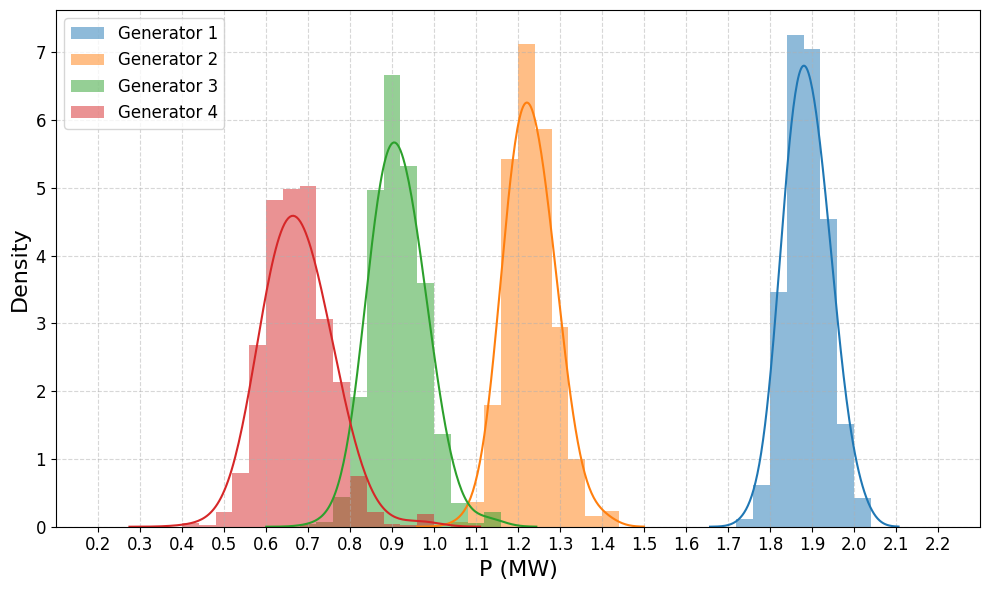

In [142]:
gen_df_eve_cop = pd.DataFrame({
    f'gen{i+1}_p_mw': results_df_eve_cop['sgen_p_mw'].apply(lambda x: x[i])
    for i in range(13)
})
plot_and_save_generator_distrib(gen_df_eve_cop, 1)

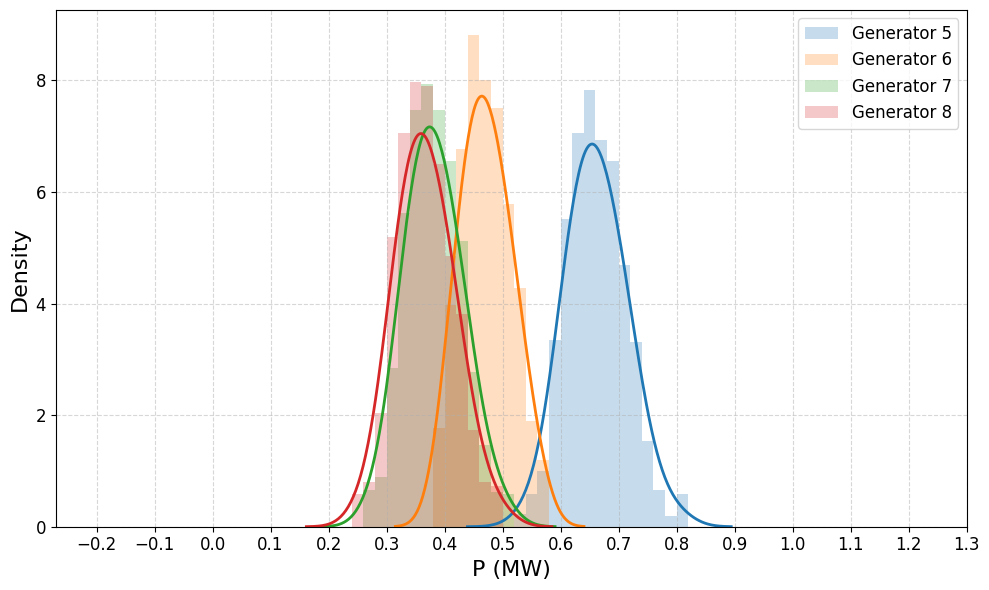

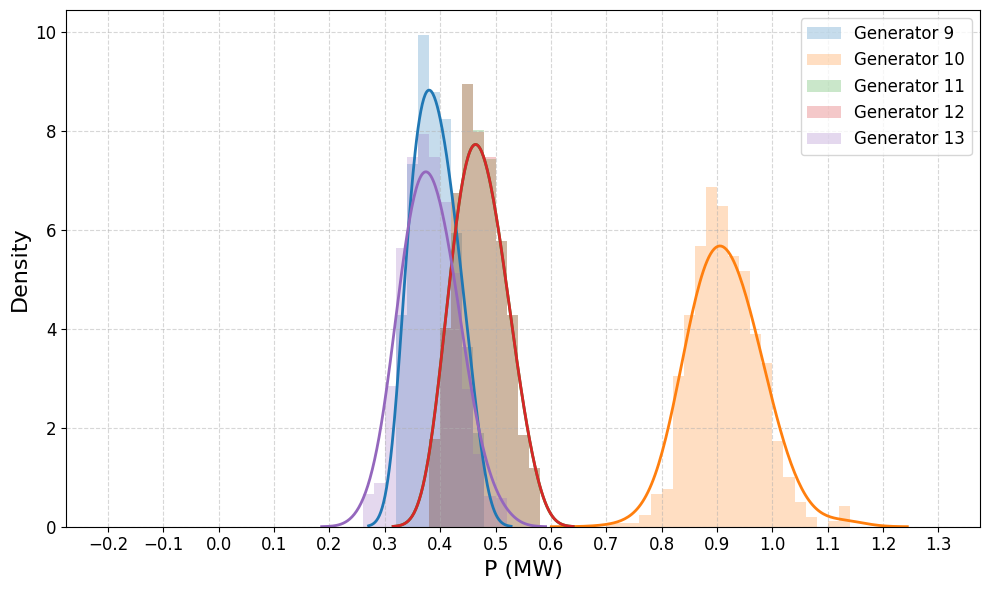

In [143]:
plot_and_save_generator_distrib_other(gen_df_eve_cop, 1)

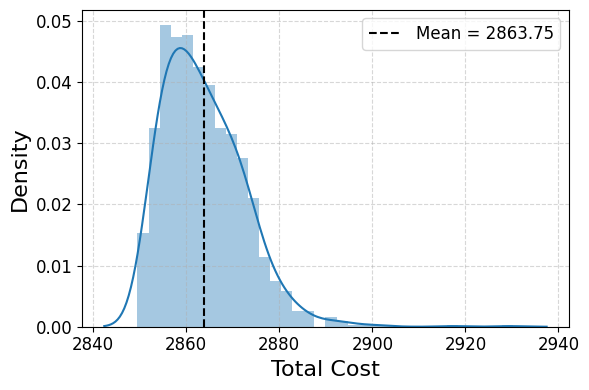

In [144]:
plot_cost_mc(results_df_eve_cop, save = 1)

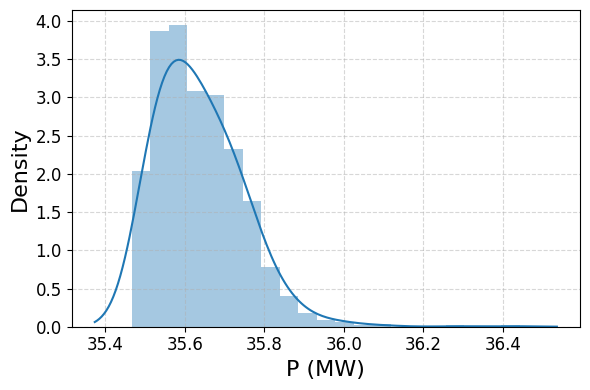

In [145]:
plot_ext_grid(results_df_eve_cop, save = 1)

# pdf comparisons

In [180]:
def plot_cost_mc(results_df, save):
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np

    plt.figure(figsize=(6, 4))
    data = results_df['total_cost']

    # Compute extended x-limits
    span = data.max() - data.min()
    x_min = data.min() - 0.1 * span
    x_max = data.max() + 0.1 * span
    bins = np.linspace(x_min, x_max, 41)

    # Plot histogram
    sns.histplot(
        data,
        bins=bins,
        stat='density',
        edgecolor=None,
        linewidth=1.2,
        alpha=0.4,
        color='C0'
    )
    # Separate KDE plot, clipped to x_min, x_max
    sns.kdeplot(
        data,
        bw_adjust=1.5,
        clip=(x_min, x_max),
        color='C0'
    )
    
    # Mean line
    mean_val = data.mean()
    plt.axvline(mean_val, color='black', linestyle='--', linewidth=1.5, label=f"Mean = {mean_val:.2f}")
    
    # Axis and grid styling
    plt.xlabel('Total Cost', fontsize=16)
    plt.ylabel('Density', fontsize=16)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(fontsize=12)
    plt.tight_layout()
    if (save == 1):
        plt.savefig("opf_real_cost_distribution_AM.png", dpi=300)
    plt.show()
    return

In [181]:
#true_df_69 = pd.read_json('DATA_FINAL\\BENCH\\MOR_BENCH.json', orient='records', lines=True)
#copula_df_69 = pd.read_json('DATA_FINAL\\BENCH\\MOR_COP.json', orient='records', lines=True)

In [209]:
true_df_69 = pd.read_json('DATA_FINAL\\bench_afternoon.json', orient='records', lines=True)
copula_df_69 = pd.read_json('DATA_FINAL\\copula_afternoon.json', orient='records', lines=True)

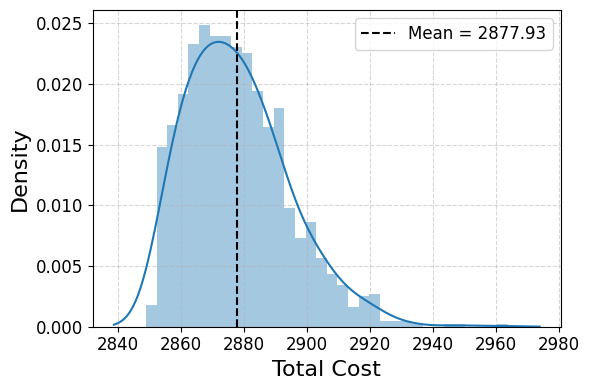

In [182]:
plot_cost_mc(true_df_69, save = 0)

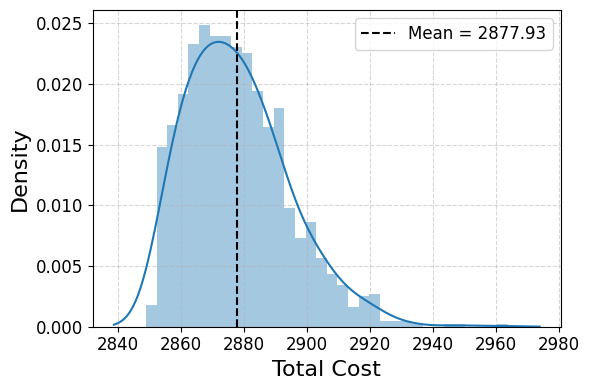

In [183]:
plot_cost_mc(true_df_69, save = 0)

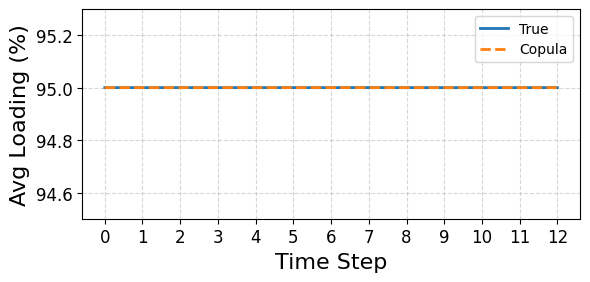

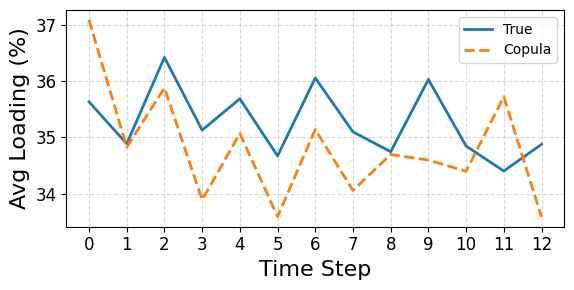

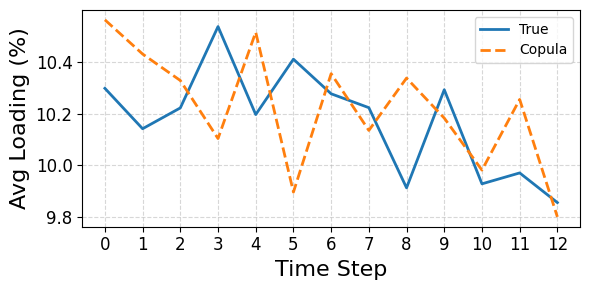

In [210]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
n_timesteps = 13
samples_per_t = len(true_df_69) // n_timesteps
n_lines = len(true_df_69['line_loading_percent'].iloc[0])

# Convert to arrays
true_array = np.stack(true_df_69['line_loading_percent'].values)
copula_array = np.stack(copula_df_69['line_loading_percent'].values)

# Compute profiles
true_profiles = np.zeros((n_lines, n_timesteps))
copula_profiles = np.zeros((n_lines, n_timesteps))

for t in range(n_timesteps):
    true_profiles[:, t] = true_array[t * samples_per_t : (t + 1) * samples_per_t].mean(axis=0)
    copula_profiles[:, t] = copula_array[t * samples_per_t : (t + 1) * samples_per_t].mean(axis=0)

important_line_indices = [0, 9, 10]

# Plot one subplot per line
for i in important_line_indices:   # n_lines
    plt.figure(figsize=(6, 3))
    plt.plot(true_profiles[i], label='True', linewidth=2)
    plt.plot(copula_profiles[i], label='Copula', linewidth=2, linestyle='--')
    #plt.title(f'Line {i+1}', fontsize=14)
    plt.xlabel('Time Step', fontsize=16)
    plt.ylabel('Avg Loading (%)', fontsize=16)
    plt.xticks(range(n_timesteps), fontsize = 12)
    plt.yticks(fontsize = 12)
    if (i == 0):
        plt.ylim((94.5,95.3))
    
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(fontsize=10)
    plt.tight_layout()
    plt.savefig(f"Line{i}_loading_trend.png", dpi=300)
    plt.show()


In [55]:
true_df_69 = {
    f'gen{i+1}_p_mw': true_df_69['sgen_p_mw'].apply(lambda x: x[i])
    for i in range(13)
}
# Create the DataFrame
true_df_69 = pd.DataFrame(true_df_69)


copula_df_69 = {
    f'gen{i+1}_p_mw': copula_df_69['sgen_p_mw'].apply(lambda x: x[i])
    for i in range(13)
}
# Create the DataFrame
copula_df_69 = pd.DataFrame(copula_df_69)

In [57]:
true_df_69 = pd.read_json('DATA_FINAL\\bench_morning.json', orient='records', lines=True)
copula_df_69 = pd.read_json('DATA_FINAL\\copula_morning.json', orient='records', lines=True)

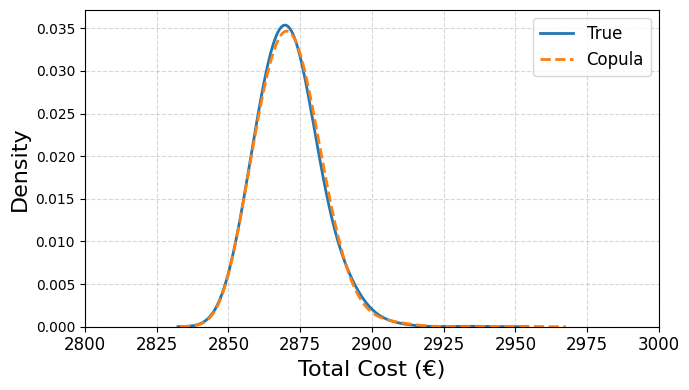

In [211]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(7, 4))
sns.kdeplot(true_df_69['total_cost'], label='True', linewidth=2, bw_adjust=2.5)
sns.kdeplot(copula_df_69['total_cost'], label='Copula', linewidth=2, bw_adjust=2.5, linestyle='--')

#plt.title('Density Comparison – Total Cost')
plt.xlabel('Total Cost (€)', fontsize = 16)
plt.ylabel('Density', fontsize = 16)
plt.legend(fontsize = 12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlim((2800,3000))
plt.xticks(fontsize = 12)
#plt.yticks(np.linspace(0, 0.025, 6), fontsize = 12)
plt.tight_layout()
plt.savefig(f"COST_MOR_COMPARISON_GOD.png", dpi=300)
plt.show()

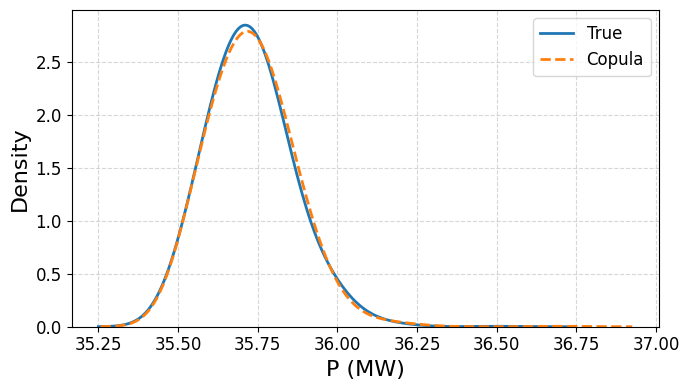

In [212]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Extract scalar values
true_data = true_df_69['ext_grid_p_mw'].apply(lambda x: x if isinstance(x, float) else x[0])
copula_data = copula_df_69['ext_grid_p_mw'].apply(lambda x: x if isinstance(x, float) else x[0])

# Define common x-limits manually (adjust as needed)
#x_min, x_max = 35.4, 36.7  # <- You can adjust to match your expected range
plt.figure(figsize=(7, 4))

# KDEs
sns.kdeplot(true_data, label='True', linewidth=2, bw_adjust=2.5)
sns.kdeplot(copula_data, label='Copula', linewidth=2, bw_adjust=2.5, linestyle='--')

# Labels and styling
plt.xlabel('P (MW)', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
#plt.xlim((x_min, x_max))
plt.xticks(fontsize=12)
plt.yticks(np.linspace(0, 2.5, 6), fontsize=12)  # adjust max if needed
plt.tight_layout()
plt.savefig("EXT_GRID_MOR_COMPARISON.png", dpi=300)
plt.show()


In [213]:
true_df_69 = {
    f'gen{i+1}_p_mw': true_df_69['sgen_p_mw'].apply(lambda x: x[i])
    for i in range(13)
}
# Create the DataFrame
true_df_69 = pd.DataFrame(true_df_69)


copula_df_69 = {
    f'gen{i+1}_p_mw': copula_df_69['sgen_p_mw'].apply(lambda x: x[i])
    for i in range(13)
}
# Create the DataFrame
copula_df_69 = pd.DataFrame(copula_df_69)

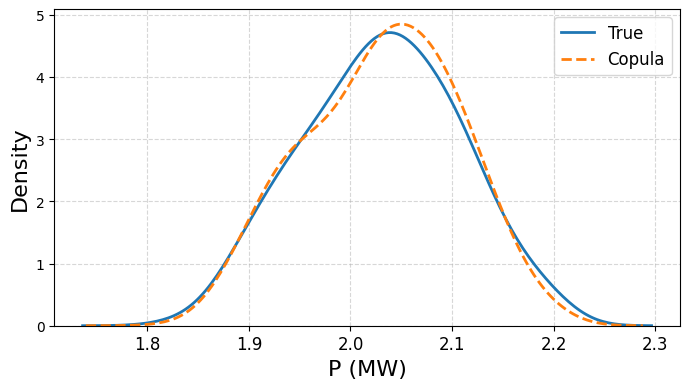

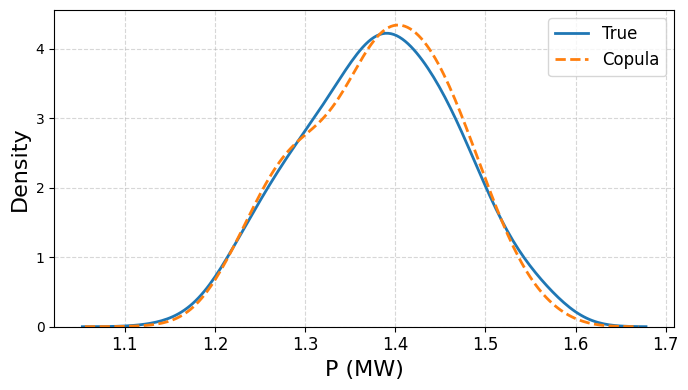

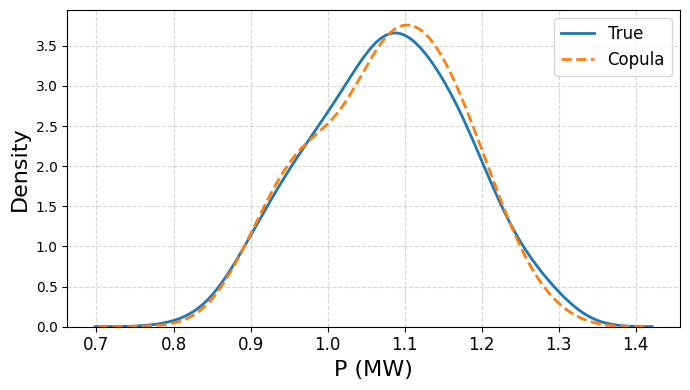

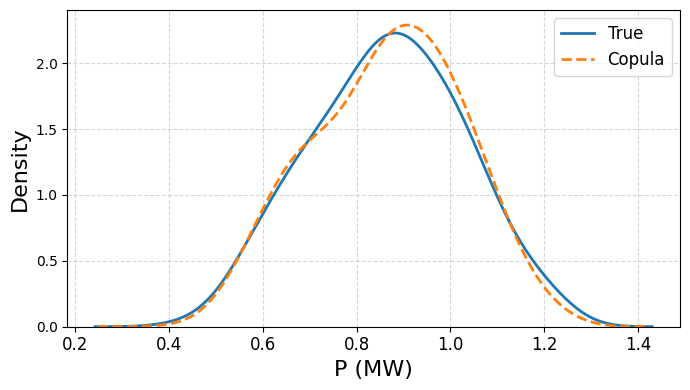

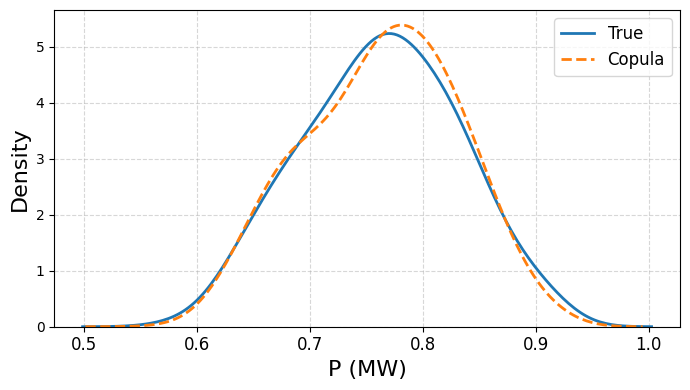

...

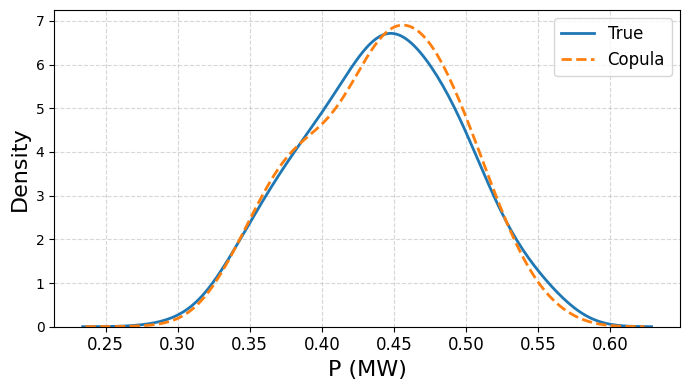

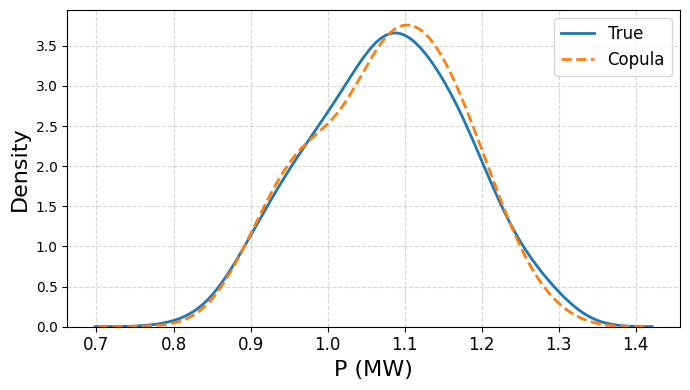

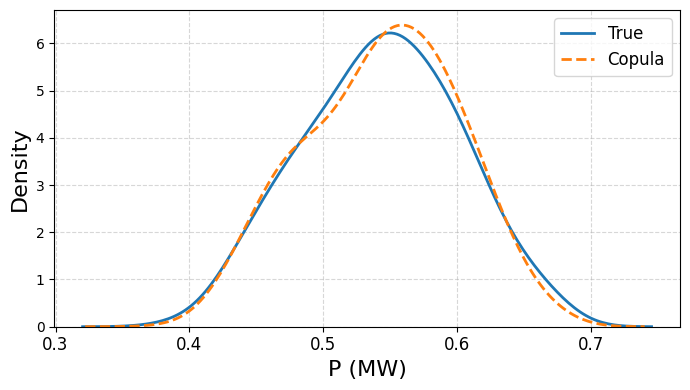

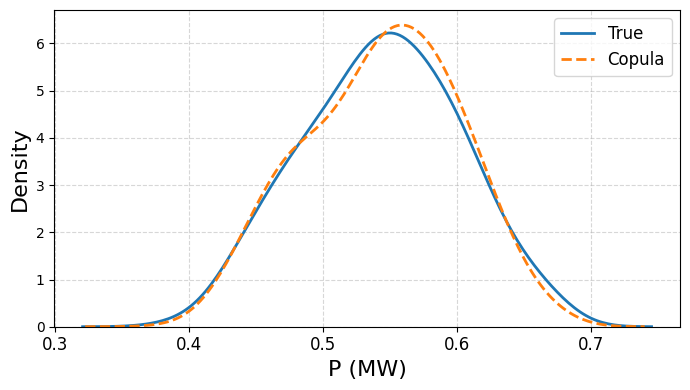

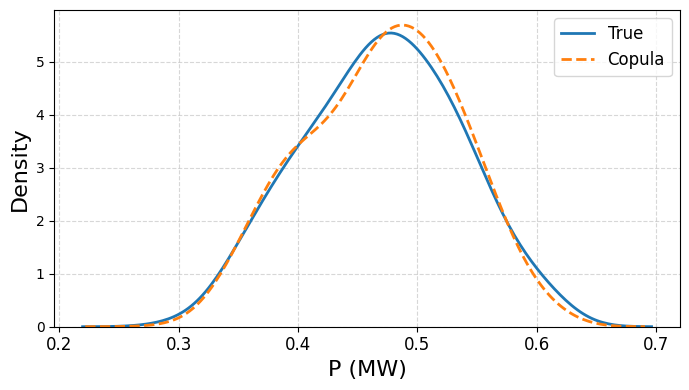

In [214]:
import matplotlib.pyplot as plt
import seaborn as sns

# Loop over all 13 generators
for i in range(13):
    gen_col = f'gen{i+1}_p_mw'
    
    plt.figure(figsize=(7, 4))
    sns.kdeplot(true_df_69[gen_col], label='True', linewidth=2, bw_adjust=1.5)
    sns.kdeplot(copula_df_69[gen_col], label='Copula', linewidth=2, bw_adjust=1.5, linestyle='--')
    
    #plt.title(f'Density Comparison – Generator {i+1}')
    plt.xlabel('P (MW)',fontsize = 16)
    plt.ylabel('Density',fontsize = 16)
    plt.xticks(fontsize = 12)
    plt.legend(fontsize = 12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.savefig(f"COMPARE_GEN{i+1}_EVE.png", dpi=300)
    plt.show()

# tabular comparisons

In [22]:
bench_mor = pd.read_json('DATA_FINAL\\bench_morning.json', orient='records', lines=True)
bench_aft = pd.read_json('DATA_FINAL\\bench_afternoon.json', orient='records', lines=True)
bench_eve = pd.read_json('DATA_FINAL\\bench_evening.json', orient='records', lines=True)

In [23]:
import pandas as pd
import numpy as np
import ast

# Funzioni di supporto
def extract_list(x):
    if isinstance(x, str):
        return ast.literal_eval(x)
    return x

def extract_max(lst):
    return max(extract_list(lst))

def extract_first(lst):
    lst = extract_list(lst)
    return lst[0] if lst else np.nan

def count_above_threshold(lst, threshold):
    return sum(1 for val in extract_list(lst) if val > threshold)

# Funzione di sintesi per ogni dataset
def summarize(df, label):
    total_cost = df["total_cost"]
    ext_grid_p = df["ext_grid_p_mw"].apply(extract_first)
    line_loading = df["line_loading_percent"].apply(extract_list)
    trafo_loading = df["trafo_loading_percent"].apply(extract_list)
    load_p = df["load_p_mw"].apply(lambda x: sum(extract_list(x)))
    sgen_p = df["sgen_p_mw"].apply(lambda x: sum(extract_list(x)))

    return {
        "Time Slot": label,
        "Avg Total Cost": total_cost.mean(),
        "Std Total Cost": total_cost.std(),
        "Avg Ext Grid P [MW]": ext_grid_p.mean(),
        "Std Ext Grid P [MW]": ext_grid_p.std(),
        #"Avg Max Line Loading [%]": df["line_loading_percent"].apply(extract_max).mean(),
        #"Std Max Line Loading [%]": df["line_loading_percent"].apply(extract_max).std(),
        "DER Coverage [%]": (sgen_p.sum() / load_p.sum()) * 100,
        "Lines > 90% loading (avg)": df["line_loading_percent"].apply(lambda x: count_above_threshold(x, 90)).mean()
    }

# Applica ai tre DataFrame (assicurati che siano definiti)
summary_mor = summarize(bench_mor, "Morning")
summary_aft = summarize(bench_aft, "Afternoon")
summary_eve = summarize(bench_eve, "Evening")

# Crea la tabella finale
summary_df = pd.DataFrame([summary_mor, summary_aft, summary_eve])

# Mostra
summary_df = summary_df.round(3)
print(summary_df.to_string(index=False))


Time Slot  Avg Total Cost  Std Total Cost  Avg Ext Grid P [MW]  Std Ext Grid P [MW]  DER Coverage [%]  Lines > 90% loading (avg)
  Morning        2869.225          11.734               35.703                0.145            20.908                      1.986
Afternoon        2871.017          10.012               35.726                0.124            23.537                      2.000
  Evening        2864.363           9.035               35.644                0.112            21.117                      1.989


In [ ]:
true_mor = pd.read_json('DATA_FINAL\\copula_morning.json', orient='records', lines=True)
true_aft = pd.read_json('DATA_FINAL\\copula_afternoon.json', orient='records', lines=True)
true_eve = pd.read_json('DATA_FINAL\\copula_evening.json', orient='records', lines=True)

In [25]:
import pandas as pd
import numpy as np
import ast

# Funzioni di supporto
def extract_list(x):
    if isinstance(x, str):
        return ast.literal_eval(x)
    return x

def extract_max(lst):
    return max(extract_list(lst))

def extract_first(lst):
    lst = extract_list(lst)
    return lst[0] if lst else np.nan

def count_above_threshold(lst, threshold):
    return sum(1 for val in extract_list(lst) if val > threshold)

# Funzione di sintesi per ogni dataset
def summarize(df, label):
    total_cost = df["total_cost"]
    ext_grid_p = df["ext_grid_p_mw"].apply(extract_first)
    line_loading = df["line_loading_percent"].apply(extract_list)
    trafo_loading = df["trafo_loading_percent"].apply(extract_list)
    load_p = df["load_p_mw"].apply(lambda x: sum(extract_list(x)))
    sgen_p = df["sgen_p_mw"].apply(lambda x: sum(extract_list(x)))

    return {
        "Time Slot": label,
        "Avg Total Cost": total_cost.mean(),
        "Std Total Cost": total_cost.std(),
        "Avg Ext Grid P [MW]": ext_grid_p.mean(),
        #"Std Ext Grid P [MW]": ext_grid_p.std(),
        #"Avg Max Line Loading [%]": df["line_loading_percent"].apply(extract_max).mean(),
        #"Std Max Line Loading [%]": df["line_loading_percent"].apply(extract_max).std(),
        "DER Coverage [%]": (sgen_p.sum() / load_p.sum()) * 100,
        "Lines > 90% loading (avg)": df["line_loading_percent"].apply(lambda x: count_above_threshold(x, 90)).mean()
    }

# Applica ai tre DataFrame (assicurati che siano definiti)
summary_mor = summarize(true_mor, "Morning")
summary_aft = summarize(true_aft, "Afternoon")
summary_eve = summarize(true_eve, "Evening")

# Crea la tabella finale
summary_df = pd.DataFrame([summary_mor, summary_aft, summary_eve])

# Mostra
summary_df = summary_df.round(3)
print(summary_df.to_string(index=False))


Time Slot  Avg Total Cost  Std Total Cost  Avg Ext Grid P [MW]  DER Coverage [%]  Lines > 90% loading (avg)
  Morning        2869.265          11.224               35.704            20.868                      1.989
Afternoon        2871.247          10.058               35.729            23.543                      2.000
  Evening        2863.751           8.650               35.636            21.046                      1.995
